## 初始化

In [1]:
from google.colab import drive
import os

drive.mount('/content/drive/')
os.chdir('/content/drive/MyDrive/thesis/')

ModuleNotFoundError: No module named 'google'

In [2]:
from datetime import datetime, timedelta
from dateutil import parser, zoneinfo, tz
from collections import defaultdict
from copy import deepcopy
from operator import itemgetter
import pandas as pd
import numpy as np
from queue import Queue
import math
import statistics
import random
import pytz
import matplotlib.pyplot as plt
import seaborn as sns
from haversine import haversine, Unit

sns.set()
sns.set_style('whitegrid')

# Ignore harmless warnings 
import warnings 
warnings.filterwarnings("ignore") 

In [3]:
# !pip install haversine


In [4]:
charging_speed = 10
charging_fee = 0.3  # NT$9/kwh --> US$0.3/kwh
# charging_fee = 9
parking_slots_num = 10
ALPHA = 0.5

In [5]:
building_start_time = parser.parse("2018-07-01")
building_end_time = parser.parse("2018-07-08")
charging_start_time = parser.parse("2018-07-01")
charging_end_time = parser.parse("2018-07-08")

# 讀取資訊

### 充電站
依據: https://www.eia.gov/consumption/commercial/building-type-definitions.php#FoodSales \\
type1: 4個(咖啡 coffee) \\
type2: 6個(雜貨 restaurant) \\
type3: 6個(餐廳 grocery) \\
type4: 4個(休閒 leisure)

In [6]:
# location = pd.read_csv("./Dataset/Simulation/location_5.csv", index_col="locationId")
location = pd.read_csv("./Dataset/location_5.csv", index_col="locationId")
location.index = location.index.astype(str) # 將索引轉換為字串型態
location = location.sort_values(by="buildingID") # 以 "buildingID" 這個欄位為鍵進行排序。
location["buildingID"] = location["buildingID"].astype(str) # 將 "buildingID" 這個欄位轉換為字串型態。

location.loc["50911", "contractCapacity"] = 222 #13
location.loc["50266", "contractCapacity"] = 273 #10
location

,Unnamed: 0,Latitude,Longitude,Location,Typing,Business_Time,buildingID,FacilityType,stationNewNum,stationUpperElec,contractCapacity,budget
locationId,,,,,,,,,,,,
50230,12,56.472968,-3.002456,Marchbanks,grocery,0800-2100,0,2,10,100,236,30
51199,4,56.460112,-2.975760,Dundee House,restaurant,1200-2100,1,3,10,100,204,43
50841,3,56.470163,-2.920664,Brington Place Sheltered Housing,grocery,0800-2200,2,2,10,100,415,45
50692,2,56.482148,-3.024697,Dundee Ice Arena,leisure,1000-1600,3,4,10,100,173,40
51087,18,56.467775,-2.873361,Queen Street Car Park,coffee,0800-1800,4,1,10,100,183,44
51198,6,56.460164,-2.975911,Dundee House,restaurant,0800-2400,5,3,10,100,212,39
50840,0,56.488382,-3.014353,Ardler Complex,leisure,0800-2000,6,4,10,100,175,45
50349,9,56.456726,-2.973511,Greenmarket Car Park,restaurant,1300-2200,7,3,10,100,394,30
50909,11,56.459078,-2.977268,South Tay Street,leisure,0900-1700,8,4,10,100,237,34


### 電力、EV 資料

- 真實產用電資料: generation_with_consumption_3.csv
- LSTM 預測產用電資料: predict_building_data.csv
- EV 歷史充電資料: charging_data_2_move.csv

In [7]:
building_data = pd.read_csv("./Dataset/generation_with_consumption_3.csv", index_col=0)
building_LSTM_data = pd.read_csv("./Result/predict_building_data.csv", index_col=0)
charging_data = pd.read_csv("./Dataset/charging_data_2_move.csv")

building_data["datetime"] = pd.to_datetime(building_data["datetime"], format="%Y-%m-%d %H:%M:%S")
building_data["buildingID"] = building_data["buildingID"].astype(str)

building_LSTM_data["datetime"] = pd.to_datetime(building_LSTM_data["datetime"], format="%Y-%m-%d %H:%M:%S")
building_LSTM_data["buildingID"] = building_LSTM_data["buildingID"].astype(str)

charging_data["createdNew"] = pd.to_datetime(charging_data["createdNew"], format="%Y-%m-%d %H:%M:%S")
charging_data["locationId"] = charging_data["locationId"].astype(str)
charging_data["userId"] = charging_data["userId"].astype(str)

building_data.loc[building_data["buildingID"] == "13", "contract_capacity"] = 222
building_data.loc[building_data["buildingID"] == "10", "contract_capacity"] = 273


# Utilis

### 計算電費
calculate_electricity_price(location, locationID, info) \\
location: 所有建物資料 \\
locationID: 建物 ID \\
info: 建物七天耗電、產電、EV 充電資訊

In [8]:
def calculate_electricity_price(location, locationID, info):

    testing_start_time = charging_start_time
    each_building_price = 262.5 / 30.73
    # capacity_price = 236.2
    capacity_price = 15.51 # 236.2 NT$ 236.2 --> US$ 15.51 Kw/month
    contract_capacity = location.loc[locationID, "contractCapacity"]
    electricity_price = defaultdict()

    # for weekday in range(1, 8):
    #     if weekday < 6:
    #         electricity_price[weekday] = [1.46] * 7 + [3.42] * 15 + [1.46] * 2
    #     elif weekday == 6:
    #         electricity_price[weekday] = [1.46] * 7 + [2.14] * 15 + [1.46] * 2
    #     else:
    #         electricity_price[weekday] = [1.46] * 24

    for weekday in range(1, 8):
        if weekday < 6:
            electricity_price[weekday] = [0.056] * 8 + [0.092] * 4 + [0.267] * 6 + [0.092] * 5 + [0.056] * 1
        else:
            electricity_price[weekday] = [0.056] * 24
    
    ### 基本電費 ### 
    # 每戶每月電價: each_building_price
    # 每月基本電價: 契約容量(contract_capacity) * 基本電價(capacity_price)
    basic_tariff = each_building_price + (contract_capacity * capacity_price)

    ### 流動電費 ###
    current_tariff = 0
    for day in range(1, 8):
        weekday = testing_start_time.isoweekday()
        for hour in range(24):
            current_tariff += electricity_price[weekday][hour] * (info[info["datetime"] == testing_start_time]["total"].values[0])
            testing_start_time += timedelta(hours=1)
    
    ### 超約罰金 ###
    overload_penalty = 0
    overload = info["total"].max()
    
    if max(overload, contract_capacity) != contract_capacity:
        overload -= contract_capacity
        overload_penalty += min(overload, contract_capacity * 0.1) * capacity_price * 2 # 超出契約容量 10% 以下的部分
        overload -= min(overload, contract_capacity * 0.1)
        overload_penalty += overload * capacity_price * 3 # 超出契約容量 10% 以上的部分

    return basic_tariff, current_tariff, overload_penalty

### 取得每日充電請求

In [9]:
def get_charging_request(charging_data, date):
    
    request_df = charging_data[(charging_data["createdNew"] >= date) & ((charging_data["createdNew"] < (date + timedelta(days=1))))]
    request_df["chargingHour"] = request_df["kwhNew"].apply(lambda x: x / charging_speed)
    charging_request = list()
 
    for item in request_df.iterrows():
        request = list(item[1][["_id", "userId", "chargingHour", "createdHour", "locationId"]])
        charging_request.append(request)

    return charging_request

### 讀取真實充電位數量資料
truth_data: 每個建築物在不同時刻下不超過契約容量下的充電位數量

In [10]:
truth_data = building_data.copy()
truth_data = truth_data.loc[(truth_data["datetime"] >= charging_start_time) & (truth_data["datetime"] < charging_end_time)]

for idx, row in truth_data.iterrows():

    max_station_num = location[location["buildingID"] == row["buildingID"]]["stationNewNum"].values[0]
    parking_slots = math.floor((row["contract_capacity"] - row["consumption"] + row["generation"]) / charging_speed)

    parking_slots = max(min(max_station_num, parking_slots), 0)
    truth_data.loc[idx, "parkingSlots"] = parking_slots

truth_data

,originID,buildingID,datetime,consumption,timestamp,generation,contract_capacity,parkingSlots
4344,281,0,2018-07-01 00:00:00,134.5124,1.609250e+10,0.001251,236,10.0
4345,281,0,2018-07-01 01:00:00,131.9056,1.609254e+10,0.001150,236,10.0
4346,281,0,2018-07-01 02:00:00,125.3885,1.609258e+10,0.001044,236,10.0
4347,281,0,2018-07-01 03:00:00,137.9011,1.609262e+10,0.000988,236,9.0
4348,281,0,2018-07-01 04:00:00,136.8584,1.609267e+10,0.001222,236,9.0
...,...,...,...,...,...,...,...,...
170947,512,19,2018-07-07 19:00:00,260.4630,1.609954e+10,3.030326,343,8.0
170948,512,19,2018-07-07 20:00:00,255.1878,1.609958e+10,1.871092,343,8.0
170949,512,19,2018-07-07 21:00:00,256.1769,1.609962e+10,0.872153,343,8.0
170950,512,19,2018-07-07 22:00:00,247.2750,1.609967e+10,0.382687,343,9.0


### 取得用戶 ID
只取某日期 (date) 前有資料的用戶

In [11]:
def get_user_list(date):
    temp = charging_data[charging_data["createdNew"] < date]
    user_list = temp.groupby("userId").groups.keys()
    return user_list

### 充電位相關 function

In [12]:
def get_parking_slots(building_data, location, date):
    ### LSTM ###

    electricity = building_data[ (building_data["datetime"] >= date) & (building_data["datetime"] < date + timedelta(days=1)) ]
    for idx, row in electricity.iterrows():
        contract_capacity = location[location["buildingID"] == row["buildingID"]]["contractCapacity"].values[0]
        max_station_num = location[location["buildingID"] == row["buildingID"]]["stationNewNum"].values[0]
        parking_slots = math.floor((contract_capacity - row["consumption"] + row["generation"]) / charging_speed)
        parking_slots = parking_slots if parking_slots < max_station_num else max_station_num
        electricity.loc[idx, "parkingSlots"] = parking_slots
    electricity["parkingSlots"] = electricity["parkingSlots"].apply(lambda x: math.floor(x) if x > 0 else 0)

    return electricity


def get_residual_slots(location, building_info, cs, hour, charging_len, schedule_type="OMMKP"):
    df = building_info.loc[(building_info["buildingID"] == location.loc[cs, "buildingID"]) & 
                           (building_info["datetime"].dt.hour >= hour) &
                           (building_info["datetime"].dt.hour < (hour + charging_len))]

    if schedule_type == "popular":
        return df["parkingSlots"].values[0] if df["parkingSlots"].all() else 0

    ### 保留一個充電位 ###
    df["parkingSlots"] = df["parkingSlots"].apply(lambda x: 0 if (x-1) < 0 else (x-1))
    return df["parkingSlots"].values[0] if df["parkingSlots"].all() else 0
    # return df["parkingSlots"].values[0] if (df["parkingSlots"].all() and df["parkingSlots"].values[0] > 1) else 0


def update_user_selection(location, slots_df, date, schedule, charging_len):

    slots_df.loc[(slots_df["buildingID"] == location.loc[schedule[0], "buildingID"]) &
                 (slots_df["datetime"] >= (date + timedelta(hours = schedule[1]))) &
                 (slots_df["datetime"] < (date + timedelta(hours = schedule[1] + charging_len))), "parkingSlots"] -= 1

    return slots_df

# Baseline

### Unscheduled: Original

每天的充電請求數量

In [13]:
testing_start_time = parser.parse("2018-07-01")

for day in range(7):
    print(testing_start_time, ":", len(charging_data[(charging_data["createdNew"] >= testing_start_time) & (charging_data["createdNew"] < testing_start_time + timedelta(days=1))]))
    testing_start_time += timedelta(days=1)

2018-07-01 00:00:00 : 98
2018-07-02 00:00:00 : 111
2018-07-03 00:00:00 : 103
2018-07-04 00:00:00 : 108
2018-07-05 00:00:00 : 106
2018-07-06 00:00:00 : 124
2018-07-07 00:00:00 : 103


#### Scheduling

In [14]:
# request 
# [18866, '606941', 3.0, 17, '51087'] 
# [userID, locationID, origin_charging_hour, charging_lenght]
 
unschedule_df = pd.DataFrame([], columns=["datetime", "userID", "locationID", "buildingID", "chargingLen", "originChargingHour"])

testing_start_time = charging_start_time

for day in range(7):
    
    charging_request = get_charging_request(charging_data, testing_start_time)

    for request in charging_request:

        buildingID = location.loc[location.index == request[4], "buildingID"].values[0]
        unschedule_df.loc[len(unschedule_df)] = [testing_start_time + timedelta(hours=request[3]),
                                                 request[1],
                                                 request[4],
                                                 buildingID,
                                                 request[2],
                                                 request[3]]
                                 
    testing_start_time += timedelta(days=1)

unschedule_df = unschedule_df[unschedule_df["userID"] != "603475"]
unschedule_df.loc[433, "datetime"] = parser.parse("2018-07-06 17:00:00")
unschedule_df.loc[471, "datetime"] = parser.parse("2018-07-06 17:00:00")
unschedule_df

,datetime,userID,locationID,buildingID,chargingLen,originChargingHour
0,2018-07-01 17:00:00,606941,51087,4,3.0,17
1,2018-07-01 16:00:00,604897H,51200,15,1.0,16
2,2018-07-01 17:00:00,604760H,50240,17,1.0,17
3,2018-07-01 17:00:00,V009198,50911,13,2.0,17
4,2018-07-01 16:00:00,604725H,50261,9,2.0,16
...,...,...,...,...,...,...
748,2018-07-07 12:00:00,604900H,50266,10,2.0,12
749,2018-07-07 12:00:00,604804H,50230,0,2.0,12
750,2018-07-07 12:00:00,604745H,51199,1,2.0,12
751,2018-07-07 12:00:00,603522H,50911,13,2.0,12


每個充電站被分配到的數量

In [15]:
unschedule_df.groupby("buildingID").size()

buildingID
0      21
1      39
10     28
11     32
12     48
13    200
14     34
15     30
16     14
17     31
18      6
19     23
2      27
3      49
4      43
5      29
6       1
7      53
8      30
9      14
dtype: int64

#### Evaluation

P.45 Station Profits \\


變數 -> 論文內的名稱 \\
-------------------------------------------------------- \\
基本電費(basic_tariff) -> Basic Tariff \\
流動電費(current_tariff) -> Current Tariff \\
超約罰金(overload_penalty) -> Overage Penalty \\
收益(unschedule_ev_revenue) -> Revenue \\

In [16]:
overage = 0
electricity_price = pd.DataFrame([], columns=["basic_tariff", "current_tariff", "overload_penalty", "total"])
unschedule_statistic_count = pd.DataFrame([], columns=[charging_start_time + timedelta(hours=hour) for hour in range(0, 7*24)])

overload_percentage = list()

unschedule_revenue = defaultdict()
unschedule_ev_charging_volume = list()
unschedule_electricity_cost = defaultdict() 
unschedule_ev_revenue = defaultdict()

for cs in location.index:
    
    info = building_data[(building_data["buildingID"] == location.loc[cs, "buildingID"]) & (building_data["datetime"] >= building_start_time) & (building_data["datetime"] < building_end_time) ]

    ### EV charging data ###
    ev_info = [0 for i in range(24*7)]
    current = charging_start_time
    
    for day in range(7):
        for hour in range(24):
            charging_value = len(unschedule_df[(unschedule_df["locationID"] == cs) &
                                            (unschedule_df["datetime"] >= current) &
                                            (unschedule_df["datetime"] < (current + timedelta(days=1))) &
                                            (unschedule_df["datetime"].dt.hour <= hour) &
                                            ((unschedule_df['datetime'].dt.hour + unschedule_df["chargingLen"]) > hour)]) * charging_speed
            ev_info[(day * 24) + hour] = charging_value
        current += timedelta(days=1)
    
    unschedule_ev_charging_volume.append(ev_info)
    unschedule_ev_revenue[cs] = sum(ev_info) * charging_fee
    info["charging"] = ev_info
    info["total"] = info["consumption"] - info["generation"] + info["charging"]

    ### check number of exceed ###
    info["exceed"] = info["total"] - location.loc[cs, "contractCapacity"]
    info["exceed"] = info["exceed"].apply(lambda x: 0 if x < 0 else x)
    
    overload_slots = 0
    for raw in info["exceed"]:
        if raw != 0:
            overload_slots += 1
        # overload_slots += math.ceil(raw / charging_speed)

    overload_percentage.append(overload_slots / (7* 24))
    print(int(location.loc[cs, 'buildingID']), ":")
    print(f"overload = {'{:.2f}'.format(info['exceed'].sum())}")
    print(f"overload_percentage = {'{:.4f}'.format(overload_percentage[-1])}")
    
    overage += info["exceed"].sum()
    basic_tariff, current_tariff, overload_penalty = calculate_electricity_price(location, cs, info)
    total_price = basic_tariff + current_tariff + overload_penalty
    electricity_price.loc[len(electricity_price)] = [basic_tariff, current_tariff, overload_penalty, total_price]
    unschedule_revenue[cs] = (-1) * total_price + (charging_fee * sum(ev_info))
    unschedule_electricity_cost[cs] = total_price
    print(f"revenue = {'{:.2f}'.format(unschedule_revenue[cs])}")

    ## image ###
    # ax = plt.gca()

    # info.plot(kind='line', x='datetime',y='consumption', ax=ax, figsize=(20.5,8))
    # info.plot(kind='line', x='datetime',y='generation', color='red', ax=ax, figsize=(20.5,8))
    # info.plot(kind='line', x='datetime',y='charging', color='yellowgreen', ax=ax, figsize=(20.5,8))
    # info.plot(kind='line', x='datetime',y='total', color='darkviolet', ax=ax, figsize=(20.5,8), fontsize=18)
    # ax.axhline(y=location.loc[cs, "contractCapacity"], color="black")

    # plt.title(f"BuildingID = {int(location.loc[cs, 'buildingID'])}", fontsize=20)
    # plt.xlabel("Time", fontsize=20)
    # plt.ylabel("Electricity (kW)", fontsize=20)
    # plt.legend(fontsize=18, loc="upper right")
    # plt.savefig(f"./Result/Schedule/Image/Popular/Schedule_{int(location.loc[cs, 'buildingID'])}.png", bbox_inches='tight')
    # plt.show()

    info["chargingCount"] = info["charging"].apply(lambda x: x/charging_speed)
    info.set_index("datetime", inplace=True)
    unschedule_statistic_count.loc[len(unschedule_statistic_count)] = info["chargingCount"].T

print("==========================")
# print(f"total overage = {overage}")
# print(f"average overage = {'{:.2f}'.format(overage/20)}")
# print(f"average overload_percentage = {'{:.4f}'.format(sum(overload_percentage)/20)}")
# print(f"overload_percentage = {overload_percentage}")
# print(f"revenue = {unschedule_revenue}")
print(f"average revenue = {int(sum(unschedule_revenue.values()) / 20)}")
print(electricity_price.mean(axis=0))

0 :
overload = 359.32
overload_percentage = 0.1726
revenue = -8606.86
1 :
overload = 375.37
overload_percentage = 0.2024
revenue = -7478.49
2 :
overload = 60.13
overload_percentage = 0.0476
revenue = -12935.95
3 :
overload = 192.00
overload_percentage = 0.1012
revenue = -6441.18
4 :
overload = 536.55
overload_percentage = 0.2798
revenue = -7086.01
5 :
overload = 243.35
overload_percentage = 0.1607
revenue = -7337.80
6 :
overload = 111.28
overload_percentage = 0.1250
revenue = -5844.48
7 :
overload = 1105.70
overload_percentage = 0.2917
revenue = -14344.38
8 :
overload = 19.50
overload_percentage = 0.0238
revenue = -7406.75
9 :
overload = 0.00
overload_percentage = 0.0000
revenue = -10158.88
10 :
overload = 22.79
overload_percentage = 0.0357
revenue = -8424.11
11 :
overload = 336.67
overload_percentage = 0.1548
revenue = -5848.78
12 :
overload = 78.06
overload_percentage = 0.0298
revenue = -5297.17
13 :
overload = 1017.22
overload_percentage = 0.3214
revenue = -9431.79
14 :
overload = 2

P.45 Load Balancing \\
平衡度(variation)

In [17]:
import time

testing_start_time = charging_start_time
unschedule_utilization = defaultdict(list)
unschedule_var = list()

while testing_start_time < charging_end_time:
    for cs in range(20):
        
        truth_slots = truth_data.loc[(truth_data["datetime"] == testing_start_time) & (truth_data["buildingID"] == str(cs)), "parkingSlots"].values[0]
        
        days = (testing_start_time - charging_start_time).days
        seconds = (testing_start_time - charging_start_time).seconds
        unschedule_slots = unschedule_ev_charging_volume[cs][int(days * 24 + (seconds / 3600))] / charging_speed
        unschedule_utilization[testing_start_time].append(unschedule_slots / truth_slots  if truth_slots != 0 else 1)
        
    unschedule_var.append(np.var(unschedule_utilization[testing_start_time]))
    testing_start_time += timedelta(hours=1)
# utilization
unschedule_variation = sum(unschedule_var) / len(unschedule_var) # 平均變異數
unschedule_variation

0.23976370148037168

P.45 Divergent Preferences \\
(Original 後來沒有比較這裡) \\

變數 -> 論文內的名稱 \\
-------------------------------------------------------- \\
unfavored_type -> Unfavored Ratio \\
time -> Moving Time \\
distance -> Moving distance

In [18]:
user_list = get_user_list(parser.parse("2018-07-01"))
history_charging_df = charging_data[charging_data["createdNew"] < parser.parse("2018-07-01")].copy()
history_charging_df["facilityType"] = history_charging_df["locationId"].apply(lambda x: location.loc[str(x), "FacilityType"])
history_charging_df["createdHour"] = history_charging_df["createdHour"].astype(int)

history_user_group = history_charging_df.groupby(["userId"])
user_preference = defaultdict(dict)

for user in user_list:
    ## 充電站選多個
    user_preference[user]["locationId"] = list()
    user_preference[user]["facilityType"] = list()
    user_preference[user]["createdHour"] = list()

    most_prefer_num = math.floor(len(history_user_group.get_group(user)) / 2)
    cs_charging_num = history_user_group.get_group(user).groupby("locationId").size()
    for cs in cs_charging_num.keys():
        if cs_charging_num[cs] >= most_prefer_num:
            user_preference[user]["locationId"].append(cs)
            user_preference[user]["facilityType"].append(location.loc[cs, "FacilityType"])
            user_preference[user]["createdHour"] += list(history_user_group.get_group(user).groupby("locationId").get_group(cs).groupby("createdHour").size().keys())
            user_preference[user]["createdHour"] = sorted(list(set(user_preference[user]["createdHour"])))
    ### 避免有人都沒有超過 50% 的
    if len(user_preference[user]["locationId"]) == 0:
        user_preference[user]["locationId"].append(cs_charging_num.sort_values(ascending=False).keys()[0])
        user_preference[user]["facilityType"].append(location.loc[user_preference[user]["locationId"][0], "FacilityType"])
        user_preference[user]["createdHour"] += list(history_user_group.get_group(user).groupby("locationId").get_group(user_preference[user]["locationId"][0]).groupby("createdHour").size().keys())
        user_preference[user]["createdHour"] = sorted(list(set(user_preference[user]["createdHour"])))

hit_type = 0
unfavored_type = 0
distance = 0
time = 0

for idx, raw in unschedule_df.iterrows():
    
    if location.loc[raw["locationID"], "FacilityType"] in user_preference[raw["userID"]]["facilityType"]:
        hit_type += 1
    if not location.loc[raw["locationID"], "FacilityType"] in user_preference[raw["userID"]]["facilityType"]:
        unfavored_type += 1
    
    min_distance = 1000
    for cs in user_preference[raw["userID"]]["locationId"]:
        value = haversine(location.loc[raw["locationID"], ["Latitude", "Longitude"]].values, location.loc[cs, ["Latitude", "Longitude"]].values, unit = Unit.KILOMETERS)
        min_distance = min(min_distance, value)
    distance += min_distance

    min_time = 1000
    for hour in user_preference[raw["userID"]]["createdHour"]:
        value = abs(raw["datetime"].hour - hour)
        min_time = min(min_time, value)
    time += min_time


print(f"hit type: {hit_type}")
print(f"average hit type: {hit_type / len(unschedule_df)}")
print(f"unfavored type: {unfavored_type}")
print(f"average unfavored type: {unfavored_type / len(unschedule_df)}")
print(f"average distance: {distance / len(unschedule_df)}")
print(f"average time: {time / len(unschedule_df)}")

hit type: 626
average hit type: 0.8324468085106383
unfavored type: 126
average unfavored type: 0.1675531914893617
average distance: 0.7780056696672215
average time: 0.785904255319149


#### Statistic

每個時間點每個充電站被分配到的車位數

In [19]:
unschedule_statistic_count

,2018-07-01 00:00:00,2018-07-01 01:00:00,2018-07-01 02:00:00,2018-07-01 03:00:00,2018-07-01 04:00:00,2018-07-01 05:00:00,2018-07-01 06:00:00,2018-07-01 07:00:00,2018-07-01 08:00:00,2018-07-01 09:00:00,...,2018-07-07 14:00:00,2018-07-07 15:00:00,2018-07-07 16:00:00,2018-07-07 17:00:00,2018-07-07 18:00:00,2018-07-07 19:00:00,2018-07-07 20:00:00,2018-07-07 21:00:00,2018-07-07 22:00:00,2018-07-07 23:00:00
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.0,1.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,1.0,1.0,0.0,0.0,0.0,2.0,1.0,0.0,2.0,2.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0
9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


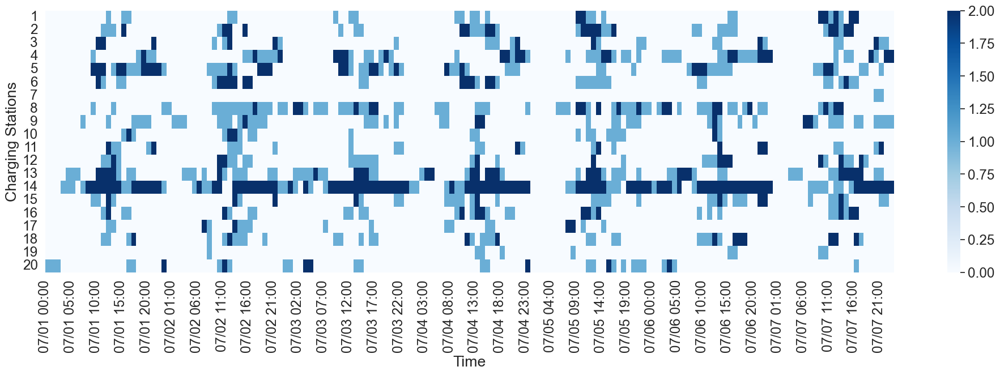

In [20]:
sns.set(rc={'figure.figsize':(20, 7)}, font_scale=1.6)
ax = sns.heatmap(unschedule_statistic_count, vmin=0, vmax=2, cmap="Blues")
x_name = list(unschedule_statistic_count.columns.strftime('%m/%d %H:00'))
# ax.set_xticklabels(x_name)
# 設置刻度位置
ax.set_xticks(np.arange(0, len(x_name), 5))
ax.set_xticklabels(x_name[::5])
ax.set_yticklabels([i for i in range(1, 21)])

# plt.xticks(rotation=45)
plt.xticks(np.arange(0, 168, step=5),)
plt.yticks(rotation=0)
plt.xlabel("Time")
plt.ylabel("Charging Stations")
plt.tight_layout()
plt.show()

每個充電站在七天的電力總花費、總收益(電費扣除EV收益)

In [21]:
unschedule_statistic_df = pd.DataFrame([], columns=["locationID", "buildingID", "Total Electricity Cost", "Total Revenue"])

for locationID in unschedule_electricity_cost.keys():
    unschedule_statistic_df.loc[len(unschedule_statistic_df)] = [locationID, 
                                                                 location.loc[locationID, "buildingID"],
                                                                 unschedule_electricity_cost[locationID],
                                                                 unschedule_revenue[locationID]]

unschedule_statistic_df.set_index("locationID", inplace=True)
unschedule_statistic_df

,buildingID,Total Electricity Cost,Total Revenue
locationID,,,
50230,0,8711.858409,-8606.858409
51199,1,7664.490038,-7478.490038
50841,2,13055.953907,-12935.953907
50692,3,6708.182133,-6441.182133
51087,4,7371.013059,-7086.013059
51198,5,7493.801700,-7337.801700
50840,6,5850.484571,-5844.484571
50349,7,14641.381352,-14344.381352
50909,8,7574.746418,-7406.746418


## FCFS_RR_V1

In [24]:
columns = [
    "datetime", 
    "date", 
    "userID", 
    "locationID", 
    "buildingID", 
    "chargingLen", 
    "originLocationID", 
    "originChargingHour", 
]

FCFS_RR_V1_df = pd.DataFrame([], columns=columns)
testing_start_time = charging_start_time
null_value = 0

for day in range(7):

    charging_request = get_charging_request(charging_data, testing_start_time)
    recommend = pd.read_csv(f"./Result/Carl/MISP/MISP_Q_Learning_incentive_025_cost_01_userBehavior/2023-07-03/alpha_0.2/{testing_start_time.strftime('%m%d')}.csv")
    recommend["datetime"] = pd.to_datetime(recommend["datetime"], format="%Y-%m-%d %H:%M:%S")
    
    for request in charging_request:
        try:
            schedule = recommend[recommend["requestID"] == request[0]]
            FCFS_RR_V1_df.loc[len(FCFS_RR_V1_df)] = [
                schedule["datetime"].values[0],
                testing_start_time.strftime("%m%d"),
                schedule["userID"].values[0],
                str(schedule["locationID"].values[0]),
                location.loc[str(schedule["locationID"].values[0]), "buildingID"],
                schedule["chargingLen"].values[0],
                schedule["originLocationID"].values[0],
                schedule["originHour"].values[0],
            ]
        except Exception as e:
            print(request, e)
            null_value += 1

    testing_start_time += timedelta(days=1)

FCFS_RR_V1_df

[11912, '603475', 3.0, 17, '50692'] index 0 is out of bounds for axis 0 with size 0


,datetime,date,userID,locationID,buildingID,chargingLen,originLocationID,originChargingHour
0,2018-07-01 12:00:00,0701,606941,50840,6,3.0,51087,17
1,2018-07-01 12:00:00,0701,604897H,50675,18,1.0,51200,16
2,2018-07-01 12:00:00,0701,604760H,50267,14,1.0,50240,17
3,2018-07-01 12:00:00,0701,V009198,50261,9,2.0,50911,17
4,2018-07-01 12:00:00,0701,604725H,50230,0,2.0,50261,16
...,...,...,...,...,...,...,...,...
747,2018-07-07 16:00:00,0707,604900H,50266,10,2.0,50266,12
748,2018-07-07 12:00:00,0707,604804H,50268,19,2.0,50230,12
749,2018-07-07 15:00:00,0707,604745H,50840,6,2.0,51199,12
750,2018-07-07 14:00:00,0707,603522H,50911,13,2.0,50911,12


In [25]:
overage = 0
electricity_price = pd.DataFrame([], columns=["basic_tariff", "current_tariff", "overload_penalty", "total"])
schedule_statistic_count = pd.DataFrame([], columns=[charging_start_time + timedelta(hours=hour) for hour in range(0, 7*24)])
overload_percentage = list()

FCFS_RR_V1_revenue = defaultdict()
FCFS_RR_V1_ev_charging_volume = list()
FCFS_RR_V1_electricity_cost = defaultdict() 
FCFS_RR_V1_ev_revenue = defaultdict()

for cs in location.index:
    
    info = building_data[ (building_data["buildingID"] == location.loc[cs, "buildingID"]) 
                         & (building_data["datetime"] >= building_start_time) & (building_data["datetime"] < building_end_time)]

    ### EV charging data ###
    ev_info = [0 for i in range(24*7)]
    current = charging_start_time
    for day in range(7):
        for hour in range(24):
            charging_value = len(FCFS_RR_V1_df[(FCFS_RR_V1_df["locationID"] == cs) &
                                             (FCFS_RR_V1_df["datetime"] >= current) &
                                             (FCFS_RR_V1_df["datetime"] < (current + timedelta(days=1))) &
                                             (FCFS_RR_V1_df["datetime"].dt.hour <= hour) &
                                             ((FCFS_RR_V1_df['datetime'].dt.hour + FCFS_RR_V1_df["chargingLen"]) > hour)]) * charging_speed
            
            ev_info[(day * 24) + hour] = charging_value
        current += timedelta(days=1)

    FCFS_RR_V1_ev_charging_volume.append(ev_info)
    FCFS_RR_V1_ev_revenue[cs] = sum(ev_info) * charging_fee
    info["charging"] = ev_info
    info["total"] = info["consumption"] - info["generation"] + info["charging"]

    ### check number of exceed ###
    info["exceed"] = info["total"] - location.loc[cs, "contractCapacity"]
    info["exceed"] = info["exceed"].apply(lambda x: 0 if x < 0 else x)

    overload_slots = 0
    for raw in info["exceed"]:
        if raw != 0:
            overload_slots += 1
        # overload_slots += math.ceil(raw / charging_speed)

    overload_percentage.append(overload_slots / (7 * 24))
    print(int(location.loc[cs, 'buildingID']), ":")
    print(f"overload = {'{:.2f}'.format(info['exceed'].sum())}")
    print(f"overload_percentage = {'{:.4f}'.format(overload_percentage[-1])}")
    
    overage += info["exceed"].sum()
    basic_tariff, current_tariff, overload_penalty = calculate_electricity_price(location, cs, info)
    total_price = basic_tariff + current_tariff + overload_penalty
    electricity_price.loc[len(electricity_price)] = [basic_tariff, current_tariff, overload_penalty, total_price]
    FCFS_RR_V1_revenue[cs] = (-1) * total_price + (charging_fee * info["charging"].sum())
    FCFS_RR_V1_electricity_cost[cs] = total_price
    print(f"revenue = {'{:.2f}'.format(FCFS_RR_V1_revenue[cs])}")

    info["chargingCount"] = info["charging"].apply(lambda x: x/charging_speed)
    info.set_index("datetime", inplace=True)
    schedule_statistic_count.loc[len(schedule_statistic_count)] = info["chargingCount"].T

print("==========================")
print(f"average revenue = {int(sum(FCFS_RR_V1_revenue.values()) / 20)}")
print(electricity_price.mean(axis=0))

0 :
overload = 431.27
overload_percentage = 0.2024
revenue = -8564.18
1 :
overload = 258.39
overload_percentage = 0.1786
revenue = -6825.17
2 :
overload = 148.15
overload_percentage = 0.0893
revenue = -13070.30
3 :
overload = 45.17
overload_percentage = 0.0298
revenue = -5566.06
4 :
overload = 146.19
overload_percentage = 0.1429
revenue = -6095.96
5 :
overload = 170.00
overload_percentage = 0.1607
revenue = -6955.34
6 :
overload = 151.70
overload_percentage = 0.1369
revenue = -5765.13
7 :
overload = 783.63
overload_percentage = 0.2619
revenue = -13818.87
8 :
overload = 14.81
overload_percentage = 0.0298
revenue = -7383.38
9 :
overload = 0.00
overload_percentage = 0.0000
revenue = -10105.02
10 :
overload = 22.56
overload_percentage = 0.0476
revenue = -8383.44
11 :
overload = 72.73
overload_percentage = 0.1131
revenue = -4733.96
12 :
overload = 0.00
overload_percentage = 0.0000
revenue = -4421.61
13 :
overload = 1.95
overload_percentage = 0.0060
revenue = -6400.80
14 :
overload = 14.16
o

In [26]:
testing_start_time = charging_start_time
schedule_utilization = defaultdict(list)
schedule_var = list()
while testing_start_time < charging_end_time:
    for cs in range(20):
        truth_slots = truth_data.loc[(truth_data["datetime"] == testing_start_time) & (truth_data["buildingID"] == str(cs)), "parkingSlots"].values[0]
        
        days = (testing_start_time - charging_start_time).days
        seconds = (testing_start_time - charging_start_time).seconds
        schedule_slots = FCFS_RR_V1_ev_charging_volume[cs][int(days * 24 + (seconds / 3600))] / charging_speed
        schedule_utilization[testing_start_time].append(schedule_slots / truth_slots if truth_slots != 0 else 1)
        

    schedule_var.append(np.var(schedule_utilization[testing_start_time]))
    testing_start_time += timedelta(hours=1)

schedule_variation = sum(schedule_var) / len(schedule_var)
schedule_variation

0.12029424134981369

In [27]:
user_list = get_user_list(parser.parse("2018-07-01"))
history_charging_df = charging_data[charging_data["createdNew"] < parser.parse("2018-07-01")].copy()
history_charging_df["facilityType"] = history_charging_df["locationId"].apply(lambda x: location.loc[str(x), "FacilityType"])
history_charging_df["createdHour"] = history_charging_df["createdHour"].astype(int)

history_user_group = history_charging_df.groupby(["userId"])
user_preference = defaultdict(dict)

for user in user_list:
    ## 充電站選多個
    user_preference[user]["locationId"] = list()
    user_preference[user]["facilityType"] = list()
    user_preference[user]["createdHour"] = list()

    most_prefer_num = math.floor(len(history_user_group.get_group(user)) / 2)
    cs_charging_num = history_user_group.get_group(user).groupby("locationId").size()
    for cs in cs_charging_num.keys():
        if cs_charging_num[cs] >= most_prefer_num:
            user_preference[user]["locationId"].append(cs)
            user_preference[user]["facilityType"].append(location.loc[cs, "FacilityType"])
            user_preference[user]["createdHour"] += list(history_user_group.get_group(user).groupby("locationId").get_group(cs).groupby("createdHour").size().keys())
            user_preference[user]["createdHour"] = sorted(list(set(user_preference[user]["createdHour"])))
    ### 避免有人都沒有超過 50% 的
    if len(user_preference[user]["locationId"]) == 0:
        user_preference[user]["locationId"].append(cs_charging_num.sort_values(ascending=False).keys()[0])
        user_preference[user]["facilityType"].append(location.loc[user_preference[user]["locationId"][0], "FacilityType"])
        user_preference[user]["createdHour"] += list(history_user_group.get_group(user).groupby("locationId").get_group(user_preference[user]["locationId"][0]).groupby("createdHour").size().keys())
        user_preference[user]["createdHour"] = sorted(list(set(user_preference[user]["createdHour"])))

hit_type = 0
unfavored_type = 0
distance = 0
time = 0

for idx, raw in FCFS_RR_V1_df.iterrows():
    
    if location.loc[raw["locationID"], "FacilityType"] in user_preference[raw["userID"]]["facilityType"]:
        hit_type += 1
    if not location.loc[raw["locationID"], "FacilityType"] in user_preference[raw["userID"]]["facilityType"]:
        unfavored_type += 1
    
    min_distance = 1000
    for cs in user_preference[raw["userID"]]["locationId"]:
        value = haversine(location.loc[raw["locationID"], ["Latitude", "Longitude"]].values, location.loc[cs, ["Latitude", "Longitude"]].values, unit = Unit.KILOMETERS)
        min_distance = min(min_distance, value)
    distance += min_distance

    min_time = 1000
    for hour in user_preference[raw["userID"]]["createdHour"]:
        value = abs(raw["datetime"].hour - hour)
        min_time = min(min_time, value)
    time += min_time


print(f"hit type: {hit_type}")
print(f"average hit type: {hit_type / len(FCFS_RR_V1_df)}")
print(f"unfavored type: {unfavored_type}")
print(f"average unfavored type: {unfavored_type / len(FCFS_RR_V1_df)}")
print(f"average distance: {distance / len(FCFS_RR_V1_df)}")
print(f"average time: {time / len(FCFS_RR_V1_df)}")

hit type: 419
average hit type: 0.5571808510638298
unfavored type: 333
average unfavored type: 0.4428191489361702
average distance: 2.5750792552317914
average time: 1.9827127659574468


1 total revenue: 42.67999999999847
2 total revenue: 653.32364194398
3 total revenue: -134.35046675178455
4 total revenue: 875.1213707750003
5 total revenue: 990.0554846316118
6 total revenue: 382.45872366164895
7 total revenue: 79.35000000000036
8 total revenue: 525.5108711715638
9 total revenue: 23.3700000000008
10 total revenue: 53.85999999999876
11 total revenue: 40.67709037873101
12 total revenue: 1114.8123310382198
13 total revenue: 875.5593272327533
14 total revenue: 3030.988362365806
15 total revenue: 271.30035373220016
16 total revenue: -68.96905715444973
17 total revenue: -136.76419635660932
18 total revenue: 393.6714187778798
19 total revenue: 423.8348494116508
20 total revenue: 112.42000000000007


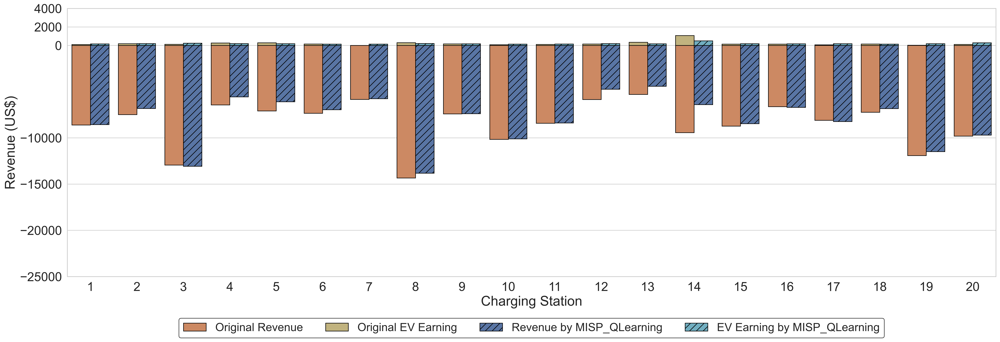

In [31]:
import itertools
sns.set(rc={'figure.figsize':(25, 9), "figure.dpi":400, 'savefig.dpi':400}, font_scale=2)
sns.set_style('whitegrid')

unschedule_info = pd.DataFrame([], columns=["Charging Station", "Original Revenue", "Original EV Earning"])#.assign(Method="Unschedule")
FCFS_RR_V1_info = pd.DataFrame([], columns=["Charging Station", "Revenue by MISP_QLearning", "EV Earning by MISP_QLearning"])

for item in location.index:
    unschedule_info.loc[len(unschedule_info)] = [int(location.loc[item, "buildingID"])+1, unschedule_revenue[item], unschedule_ev_revenue[item]]
    FCFS_RR_V1_info.loc[len(FCFS_RR_V1_info)] = [int(location.loc[item, "buildingID"])+1, FCFS_RR_V1_revenue[item], FCFS_RR_V1_ev_revenue[item]]


# unschedule_df = unschedule_df.assign(Method="Unschedule")
unschedule_info = pd.melt(unschedule_info, id_vars=["Charging Station"], var_name=['Var'])
FCFS_RR_V1_info = pd.melt(FCFS_RR_V1_info, id_vars=["Charging Station"], var_name=['Var'])

color = sns.color_palette("deep", 10)
ax1 = sns.barplot(x="Charging Station", y="value", hue="Var", data=unschedule_info, errwidth=0, edgecolor='black', linewidth=1, palette=[color[1], color[-2]])
ax2 = sns.barplot(x="Charging Station", y="value", hue="Var", data=FCFS_RR_V1_info, errwidth=0, edgecolor='black', linewidth=1, palette=[color[0], color[-1]])

hatches = itertools.cycle(['//'])#, '\\', '+', '-', 'x', '\\', '*', 'o', 'O', '.'])
for i, bar in enumerate(ax2.patches):
    if 20 <= i < 40:
        bar.set_x(bar.xy[0] - 0.4)
    elif 40 <= i < 60:
        bar.set_x(bar.xy[0] + 0.4)
    if i >= 40:
        hatch = next(hatches)
        bar.set_hatch(hatch)


plt.yticks([-25000, -20000, -15000, -10000, 0, 2000, 4000])#, [-250000, -200000, -150000, -100000, 0, "", 20000, "", 40000])
plt.xticks(range(0, 20), range(1, 21))
plt.ylabel("Revenue (US$)")

for cs in range(20):
    unschedule_total_revenue = unschedule_info.loc[(unschedule_info["Charging Station"] == (cs + 1)) & (unschedule_info["Var"] == "Original Revenue"), "value"].values[0]
    FCFS_RR_V1_total_revenue = FCFS_RR_V1_info.loc[(FCFS_RR_V1_info["Charging Station"] == (cs + 1)) & (FCFS_RR_V1_info["Var"] == "Revenue by MISP_QLearning"), "value"].values[0] 
    # print(cs, "total revenue:", schedule_total_revenue - unschedule_total_revenue )
    # plt.text(cs-0.5, min(unschedule_total_revenue, schedule_total_revenue)-15000, "{:.1f}%".format((unschedule_total_revenue - schedule_total_revenue) / unschedule_total_revenue * 100), fontsize=15)

    unschedule_ev_earning = unschedule_info.loc[(unschedule_info["Charging Station"] == (cs + 1)) & (unschedule_info["Var"] == "Original EV Earning"), "value"].values[0]
    schedule_ev_earning = FCFS_RR_V1_info.loc[(FCFS_RR_V1_info["Charging Station"] == (cs + 1)) & (FCFS_RR_V1_info["Var"] == "EV Earning by MISP_QLearning"), "value"].values[0] 
    # print(cs, "ev earning:", schedule_ev_earning - unschedule_ev_earning )
    # plt.text(cs-0.2, max(unschedule_ev_earning, schedule_ev_earning)+5000, "{:.1f}%".format((schedule_ev_earning - unschedule_ev_earning) / unschedule_ev_earning * 100), fontsize=15)

    # if (schedule_ev_earning - unschedule_ev_earning) > 0:
    print(cs + 1, "total revenue:", FCFS_RR_V1_total_revenue - unschedule_total_revenue)
    # print("ev earning:", schedule_ev_earning - unschedule_ev_earning)
    # print("unschedule_ev_earning:", unschedule_ev_earning)
    # if (unschedule_ev_earning > schedule_ev_earning) and ( (FCFS_RR_V1_total_revenue - unschedule_total_revenue) < (unschedule_ev_earning - schedule_ev_earning)):
    #     print(cs, "這個不好", unschedule_ev_earning - schedule_ev_earning, FCFS_RR_V1_total_revenue - unschedule_total_revenue )
# hatches = itertools.cycle(['//'])#, '/', '+', '-', 'x', '\\', '*', 'o', 'O', '.'])
# for i, bar in enumerate(ax1.patches):
#     hatch = next(hatches)
#     bar.set_hatch(hatch)



plt.legend(loc='lower center', bbox_to_anchor=(0.5, -0.25), ncol=4, fancybox=True, edgecolor="black", fontsize=20)
plt.tight_layout()
# plt.savefig("./Image/station_profits.png", transparent=True)

## Single: ISP
我的方法，在展開時只對單一充電站排程 \\

### Result to dataframe

In [24]:
single_df = pd.DataFrame([], columns=["datetime", "date", "userID", "locationID", "buildingID", "chargingLen", "originLocationID", "originChargingHour", "incentive", "score"])
testing_start_time = charging_start_time

for day in range(7):
    charging_request = get_charging_request(charging_data, testing_start_time)
    # recommend = pd.read_csv(f"./Result/Schedule/SingleStation/ISP/0719/alpha_0.5/{testing_start_time.strftime('%m%d')}.csv")
    recommend = pd.read_csv(f"./Result/Baseline/ISP/0719/alpha_0.5/{testing_start_time.strftime('%m%d')}.csv")
    recommend["datetime"] = pd.to_datetime(recommend["datetime"], format="%Y-%m-%d %H:%M:%S")
    
    for request in charging_request:
        try:
            schedule = recommend[recommend["requestID"] == request[0]]
            single_df.loc[len(single_df)] = [schedule["datetime"].values[0],
                                     testing_start_time.strftime("%m%d"),
                                     schedule["userID"].values[0],
                                     str(schedule["locationID"].values[0]),
                                     location.loc[str(schedule["locationID"].values[0]), "buildingID"],
                                     schedule["chargingLen"].values[0],
                                     schedule["originLocationID"].values[0],
                                     schedule["originHour"].values[0],
                                     schedule["incentive"].values[0],
                                     schedule["score"].values[0]]
        except Exception as e:
            print(request, e)

    testing_start_time += timedelta(days=1)
    
single_df

[11912, '603475', 3.0, 17, '50692'] index 0 is out of bounds for axis 0 with size 0


,datetime,date,userID,locationID,buildingID,chargingLen,originLocationID,originChargingHour,incentive,score
0,2018-07-01 01:00:00,0701,606941,51087,4,3.0,51087,17,0,0.500000
1,2018-07-01 00:00:00,0701,604897H,51200,15,1.0,51200,16,0,0.500000
2,2018-07-01 04:00:00,0701,604760H,50240,17,1.0,50240,17,0,0.500000
3,2018-07-01 05:00:00,0701,V009198,50911,13,2.0,50911,17,2,0.585184
4,2018-07-01 21:00:00,0701,604725H,50261,9,2.0,50261,16,0,0.500000
...,...,...,...,...,...,...,...,...,...,...
747,2018-07-07 09:00:00,0707,604900H,50266,10,2.0,50266,12,0,0.319079
748,2018-07-07 10:00:00,0707,604804H,50230,0,2.0,50230,12,0,0.201099
749,2018-07-07 19:00:00,0707,604745H,51199,1,2.0,51199,12,0,0.139583
750,2018-07-07 09:00:00,0707,603522H,50911,13,2.0,50911,12,4,-0.035545


### Evaluation

P.45 Station Profits \\


變數 -> 論文內的名稱 \\
-------------------------------------------------------- \\
基本電費(basic_tariff) -> Basic Tariff \\
流動電費(current_tariff) -> Current Tariff \\
超約罰金(overload_penalty) -> Overage Penalty \\
收益(isp_revenue) -> Revenue \\

In [25]:
overage = 0
electricity_price = pd.DataFrame([], columns=["basic_tariff", "current_tariff", "overload_penalty", "total"])
isp_statistic_count = pd.DataFrame([], columns=[charging_start_time + timedelta(hours=hour) for hour in range(0, 7*24)])
overload_percentage = list()
isp_ev_charging_volume = list()
isp_electricity_cost = defaultdict()
isp_revenue = defaultdict()

for cs in location.index:
    info = building_data[ (building_data["buildingID"] == location.loc[cs, "buildingID"]) &  (building_data["datetime"] >= building_start_time) & (building_data["datetime"] < building_end_time) ]

    ### EV charging data ###
    ev_info = [0 for i in range(24*7)]
    current = charging_start_time
    for day in range(7):
        for hour in range(24):
            charging_value = len(single_df[(single_df["locationID"] == cs) &
                                            (single_df["datetime"] >= current) &
                                            (single_df["datetime"] < (current + timedelta(days=1))) &
                                            (single_df["datetime"].dt.hour <= hour) &
                                            ((single_df['datetime'].dt.hour + single_df["chargingLen"]) > hour)]) * charging_speed
            ev_info[(day * 24) + hour] = charging_value
        current += timedelta(days=1)
    
    isp_ev_charging_volume.append(ev_info)
    info["charging"] = ev_info
    info["total"] = info["consumption"] - info["generation"] + info["charging"]

    ### check number of exceed ###
    info["exceed"] = info["total"] - location.loc[cs, "contractCapacity"]
    info["exceed"] = info["exceed"].apply(lambda x: 0 if x < 0 else x)
    
    overload_slots = 0
    for raw in info["exceed"]:
        if raw != 0:
            overload_slots += 1
        # overload_slots += math.ceil(raw / charging_speed)
    
    overload_percentage.append(overload_slots / (7* 24))
    print(int(location.loc[cs, 'buildingID']), ":")
    print(f"overload = {'{:.2f}'.format(info['exceed'].sum())}")
    print(f"overload_percentage = {'{:.4f}'.format(overload_percentage[-1])}")
    
    overage += info["exceed"].sum()
    basic_tariff, current_tariff, overload_penalty = calculate_electricity_price(location, cs, info)
    total_price = basic_tariff + current_tariff + overload_penalty
    electricity_price.loc[len(electricity_price)] = [basic_tariff, current_tariff, overload_penalty, total_price]
    isp_revenue[cs] = (-1) * total_price + (charging_fee * sum(ev_info))
    isp_electricity_cost[cs] = total_price
    print(f"revenue = {'{:.2f}'.format(isp_revenue[cs])}")

    ### image ###
    # ax = plt.gca()

    # info.plot(kind='line', x='datetime',y='consumption', ax=ax, figsize=(20.5,8))
    # info.plot(kind='line', x='datetime',y='generation', color='red', ax=ax, figsize=(20.5,8))
    # info.plot(kind='line', x='datetime',y='charging', color='yellowgreen', ax=ax, figsize=(20.5,8))
    # info.plot(kind='line', x='datetime',y='total', color='darkviolet', ax=ax, figsize=(20.5,8), fontsize=18)
    # ax.axhline(y=location.loc[cs, "contractCapacity"], color="black")

    # plt.title(f"BuildingID = {int(location.loc[cs, 'buildingID'])}", fontsize=20)
    # plt.xlabel("Time", fontsize=20)
    # plt.ylabel("Electricity (kW)", fontsize=20)
    # plt.legend(fontsize=18, loc="upper right")
    # # plt.savefig(f"./Result/Schedule/Image/Popular/Schedule_{int(location.loc[cs, 'buildingID'])}.png", bbox_inches='tight')
    # plt.show()

    info["chargingCount"] = info["charging"].apply(lambda x: x/charging_speed)
    info.set_index("datetime", inplace=True)
    isp_statistic_count.loc[len(isp_statistic_count)] = info["chargingCount"].T

print("==========================")
# print(f"total overage = {overage}")
# print(f"average overage = {'{:.2f}'.format(overage/20)}")
# print(f"average overload_percentage = {'{:.4f}'.format(sum(overload_percentage)/20)}")
# print(f"overload_percentage = {overload_percentage}")
# print(f"revenue = {isp_revenue}")
print(f"average revenue = {int(sum(isp_revenue.values()) / 20)}")
print(electricity_price.mean(axis=0))

0 :
overload = 312.34
overload_percentage = 0.1607
revenue = -8559.25
1 :
overload = 312.04
overload_percentage = 0.2024
revenue = -6823.60
2 :
overload = 67.53
overload_percentage = 0.0536
revenue = -12925.45
3 :
overload = 152.09
overload_percentage = 0.0833
revenue = -5972.75
4 :
overload = 385.61
overload_percentage = 0.2798
revenue = -6455.80
5 :
overload = 200.13
overload_percentage = 0.1607
revenue = -7282.09
6 :
overload = 104.20
overload_percentage = 0.1131
revenue = -5844.48
7 :
overload = 817.86
overload_percentage = 0.2917
revenue = -13753.16
8 :
overload = 26.72
overload_percentage = 0.0417
revenue = -7450.16
9 :
overload = 0.00
overload_percentage = 0.0000
revenue = -10131.55
10 :
overload = 10.52
overload_percentage = 0.0179
revenue = -8393.39
11 :
overload = 110.24
overload_percentage = 0.1190
revenue = -4857.72
12 :
overload = 5.06
overload_percentage = 0.0179
revenue = -4399.60
13 :
overload = 22.48
overload_percentage = 0.0655
revenue = -6155.32
14 :
overload = 0.49


P.45 Load Balancing \\
平衡度(variation)

In [26]:
import json
testing_start_time = charging_start_time
isp_utilization = defaultdict(list)
isp_var = list()

dic = {'isp': {}, 'truth': {}}

while testing_start_time < charging_end_time:
    isp_list = []
    truth_list = []
    
    for cs in range(20):
        truth_slots = truth_data.loc[(truth_data["datetime"] == testing_start_time) & (truth_data["buildingID"] == str(cs)), "parkingSlots"].values[0]
        
        days = (testing_start_time - charging_start_time).days
        seconds = (testing_start_time - charging_start_time).seconds

        isp_slots = isp_ev_charging_volume[cs][int(days * 24 + (seconds / 3600))] / charging_speed
        isp_utilization[testing_start_time].append(isp_slots / truth_slots if truth_slots != 0 else 1)

        isp_list.append(isp_slots)
        truth_list.append(truth_slots)

    dic['isp'][testing_start_time.strftime("%m/%d/%Y, %H:%M:%S")] = isp_list[:]
    dic['truth'][testing_start_time.strftime("%m/%d/%Y, %H:%M:%S")] = truth_list[:]


    print(testing_start_time)
    # print(isp_ev_charging_volume)
    isp_var.append(np.var(isp_utilization[testing_start_time]))
    testing_start_time += timedelta(hours=1)

with open('isp_truth.json', 'w') as f:
    json.dump(dic, f)

isp_variation = sum(isp_var) / len(isp_var)
isp_variation

2018-07-01 00:00:00
2018-07-01 01:00:00
2018-07-01 02:00:00
2018-07-01 03:00:00
2018-07-01 04:00:00
2018-07-01 05:00:00
2018-07-01 06:00:00
2018-07-01 07:00:00
2018-07-01 08:00:00
2018-07-01 09:00:00
2018-07-01 10:00:00
2018-07-01 11:00:00
2018-07-01 12:00:00
2018-07-01 13:00:00
2018-07-01 14:00:00
2018-07-01 15:00:00
2018-07-01 16:00:00
2018-07-01 17:00:00
2018-07-01 18:00:00
2018-07-01 19:00:00
2018-07-01 20:00:00
2018-07-01 21:00:00
2018-07-01 22:00:00
2018-07-01 23:00:00
2018-07-02 00:00:00
2018-07-02 01:00:00
2018-07-02 02:00:00
2018-07-02 03:00:00
2018-07-02 04:00:00
2018-07-02 05:00:00
2018-07-02 06:00:00
2018-07-02 07:00:00
2018-07-02 08:00:00
2018-07-02 09:00:00
2018-07-02 10:00:00
2018-07-02 11:00:00
2018-07-02 12:00:00
2018-07-02 13:00:00
2018-07-02 14:00:00
2018-07-02 15:00:00
2018-07-02 16:00:00
2018-07-02 17:00:00
2018-07-02 18:00:00
2018-07-02 19:00:00
2018-07-02 20:00:00
2018-07-02 21:00:00
2018-07-02 22:00:00
2018-07-02 23:00:00
2018-07-03 00:00:00
2018-07-03 01:00:00


0.12830525820598848

### Statistic

每個時間點每個充電站被分配到的車位數

In [27]:
isp_statistic_count

,2018-07-01 00:00:00,2018-07-01 01:00:00,2018-07-01 02:00:00,2018-07-01 03:00:00,2018-07-01 04:00:00,2018-07-01 05:00:00,2018-07-01 06:00:00,2018-07-01 07:00:00,2018-07-01 08:00:00,2018-07-01 09:00:00,...,2018-07-07 14:00:00,2018-07-07 15:00:00,2018-07-07 16:00:00,2018-07-07 17:00:00,2018-07-07 18:00:00,2018-07-07 19:00:00,2018-07-07 20:00:00,2018-07-07 21:00:00,2018-07-07 22:00:00,2018-07-07 23:00:00
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0
4,1.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0
9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<Axes: xlabel='Time', ylabel='Charging Stations'>

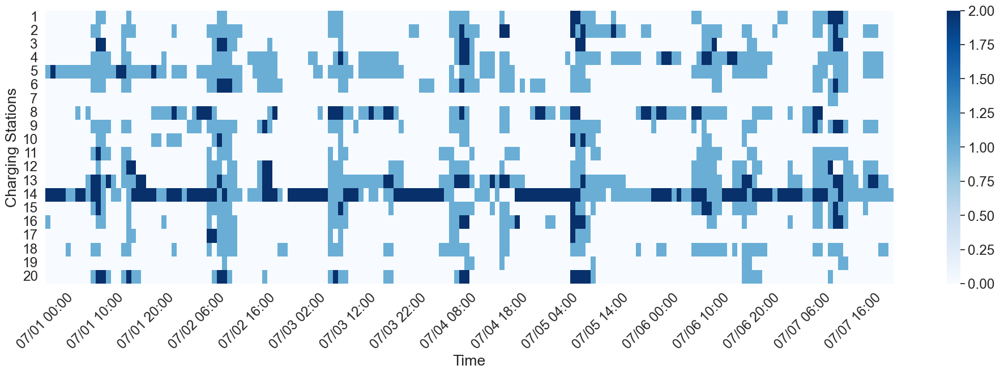

In [28]:
sns.set(rc={'figure.figsize':(20, 7)}, font_scale=1.6)
ax = sns.heatmap(isp_statistic_count, vmin=0, vmax=2, cmap="Blues")
x_name = list(isp_statistic_count.columns.strftime('%m/%d %H:00'))
# 設置刻度位置
ax.set_xticks(np.arange(0, len(x_name), 10))
ax.set_xticklabels(x_name[::10])
ax.set_yticklabels([i for i in range(1, 21)])
plt.xticks(np.arange(0, 168, step=10), rotation=45)
plt.yticks(rotation=0)
plt.xlabel("Time")
plt.ylabel("Charging Stations")
plt.tight_layout()
ax

每個充電站在七天的電力總花費、總收益(電費扣除EV收益)

In [29]:
isp_statistic_df = pd.DataFrame([], columns=["locationID", "buildingID", "Total Electricity Cost", "Total Revenue"])

for locationID in isp_electricity_cost.keys():
    isp_statistic_df.loc[len(isp_statistic_df)] = [locationID, 
                                                   location.loc[locationID, "buildingID"],
                                                   isp_electricity_cost[locationID],
                                                   isp_revenue[locationID]]

isp_statistic_df.set_index("locationID", inplace=True)
isp_statistic_df

,buildingID,Total Electricity Cost,Total Revenue
locationID,,,
50230,0,8664.253150,-8559.253150
51199,1,7009.596396,-6823.596396
50841,2,13045.453907,-12925.453907
50692,3,6245.752133,-5972.752133
51087,4,6746.800297,-6455.800297
51198,5,7438.089873,-7282.089873
50840,6,5850.484571,-5844.484571
50349,7,14059.160481,-13753.160481
50909,8,7618.157276,-7450.157276


## Multiple: Popular

### Scheduling
所有充電站熱門時段排行


In [30]:
training_start_time = parser.parse("2018-01-01")
training_end_time = parser.parse("2018-07-01")

train_charging_df = charging_data[(charging_data["createdNew"] >= training_start_time) & (charging_data["createdNew"] < training_end_time)]
hour_statistic = train_charging_df.groupby(["locationId", "createdHour"])
popular_info = list()

for cs, hour in hour_statistic.groups.keys():
    popular_info += [(cs, hour, len(hour_statistic.get_group((cs, hour))))]

popular_info = sorted(popular_info, key=lambda tup: tup[2], reverse=True)

popular_info

[('50841', 21, 41),
 ('50911', 20, 36),
 ('50911', 17, 34),
 ('50911', 10, 33),
 ('50911', 16, 33),
 ('50911', 9, 31),
 ('50911', 13, 31),
 ('50911', 18, 31),
 ('50911', 21, 29),
 ('50911', 19, 28),
 ('50911', 11, 27),
 ('50911', 15, 27),
 ('50911', 22, 26),
 ('50240', 16, 25),
 ('50911', 8, 24),
 ('50911', 14, 23),
 ('50911', 7, 22),
 ('51199', 11, 21),
 ('50266', 21, 20),
 ('50267', 21, 20),
 ('50240', 11, 19),
 ('50267', 13, 19),
 ('50268', 23, 19),
 ('50269', 11, 19),
 ('50349', 13, 19),
 ('50911', 12, 19),
 ('51198', 10, 19),
 ('50841', 12, 18),
 ('50349', 1, 17),
 ('50349', 12, 17),
 ('51199', 15, 17),
 ('51198', 15, 16),
 ('51199', 10, 16),
 ('50263', 15, 15),
 ('50263', 17, 15),
 ('50269', 14, 15),
 ('50349', 21, 15),
 ('50911', 23, 15),
 ('51198', 14, 15),
 ('51199', 12, 15),
 ('51200', 15, 15),
 ('50269', 12, 14),
 ('50911', 1, 14),
 ('50263', 10, 13),
 ('50263', 14, 13),
 ('50266', 13, 13),
 ('50267', 12, 13),
 ('50269', 13, 13),
 ('51199', 14, 13),
 ('50349', 2, 12),
 ('503

依照熱門度安排充電時間

In [31]:
popular_df = pd.DataFrame([], columns=["datetime", "userID", "locationID", "buildingID", "chargingLen", "originLocationID", "originChargingHour"])

testing_start_time = charging_start_time

for day in range(7):
    charging_request = get_charging_request(charging_data, testing_start_time)
    slots_df = get_parking_slots(building_LSTM_data, location, testing_start_time)
    ### 使用最大充電位排程 ###
    # slots_df["parkingSlots"] = slots_df["buildingID"].apply(lambda x: location.loc[(location["buildingID"] == x), "stationNewNum"][0])

    for request in charging_request:
        buildingID = location.loc[location.index == request[4], "buildingID"]

        ### check parking slots number
        idx = 0
        schedule_hour = popular_info[-1][1]
        while idx < len(popular_info):
            schedule_hour = popular_info[idx][1]
            if (schedule_hour + int(request[2])) < 24:
                if get_residual_slots(location, slots_df, popular_info[idx][0], schedule_hour, request[2], schedule_type="popular") > 0:
                    slots_df = update_user_selection(location, slots_df, testing_start_time, [popular_info[idx][0], schedule_hour, 1, 1], request[2])
                    break
            idx += 1

        popular_df.loc[len(popular_df)] = [testing_start_time + timedelta(hours=schedule_hour),
                                           request[1],
                                           popular_info[idx][0],
                                           location.loc[popular_info[idx][0], "buildingID"],
                                           request[2],
                                           request[4],
                                           request[3]]
                                 
    testing_start_time += timedelta(days=1)


popular_df = popular_df[popular_df["userID"] != "603475"]
# popular_df.to_csv("./Result/Schedule/MultipleStation/Popular/popular.csv")
popular_df

,datetime,userID,locationID,buildingID,chargingLen,originLocationID,originChargingHour
0,2018-07-01 20:00:00,606941,50911,13,3.0,51087,17
1,2018-07-01 21:00:00,604897H,50841,2,1.0,51200,16
2,2018-07-01 21:00:00,604760H,50841,2,1.0,50240,17
3,2018-07-01 21:00:00,V009198,50841,2,2.0,50911,17
4,2018-07-01 21:00:00,604725H,50841,2,2.0,50261,16
...,...,...,...,...,...,...,...
748,2018-07-07 01:00:00,604900H,50911,13,2.0,50266,12
749,2018-07-07 01:00:00,604804H,50911,13,2.0,50230,12
750,2018-07-07 01:00:00,604745H,50911,13,2.0,51199,12
751,2018-07-07 01:00:00,603522H,50911,13,2.0,50911,12


### Evaluation


P.45 Station Profits \\


變數 -> 論文內的名稱 \\
-------------------------------------------------------- \\
基本電費(basic_tariff) -> Basic Tariff \\
流動電費(current_tariff) -> Current Tariff \\
超約罰金(overload_penalty) -> Overage Penalty \\
收益(popular_revenue) -> Revenue \\

In [32]:
overage = 0
electricity_price = pd.DataFrame([], columns=["basic_tariff", "current_tariff", "overload_penalty", "total"])
popular_statistic_count = pd.DataFrame([], columns=[charging_start_time + timedelta(hours=hour) for hour in range(0, 7*24)])
overload_percentage = list()
popular_ev_charging_volume = list()
popular_electricity_cost = defaultdict()
popular_revenue = defaultdict()

for cs in location.index:
    info = building_data[ (building_data["buildingID"] == location.loc[cs, "buildingID"]) &  (building_data["datetime"] >= building_start_time) & (building_data["datetime"] < building_end_time) ]

    ### EV charging data ###
    ev_info = [0 for i in range(24*7)]
    current = charging_start_time
    for day in range(7):
        for hour in range(24):
            charging_value = len(popular_df[(popular_df["locationID"] == cs) &
                                            (popular_df["datetime"] >= current) &
                                            (popular_df["datetime"] < (current + timedelta(days=1))) &
                                            (popular_df["datetime"].dt.hour <= hour) &
                                            ((popular_df['datetime'].dt.hour + popular_df["chargingLen"]) > hour)]) * charging_speed
            ev_info[(day * 24) + hour] = charging_value
        current += timedelta(days=1)
    
    popular_ev_charging_volume.append(ev_info)
    info["charging"] = ev_info
    info["total"] = info["consumption"] - info["generation"] + info["charging"]

    ### check number of exceed ###
    info["exceed"] = info["total"] - location.loc[cs, "contractCapacity"]
    info["exceed"] = info["exceed"].apply(lambda x: 0 if x < 0 else x)

    overload_slots = 0
    for raw in info["exceed"]:
        if raw != 0:
            overload_slots += 1
        # overload_slots += math.ceil(raw / charging_speed)

    overload_percentage.append(overload_slots / (7* 24))
    print(int(location.loc[cs, 'buildingID']), ":")
    print(f"overload = {'{:.2f}'.format(info['exceed'].sum())}")
    print(f"overload_percentage = {'{:.4f}'.format(overload_percentage[-1])}")
    
    overage += info["exceed"].sum()
    basic_tariff, current_tariff, overload_penalty = calculate_electricity_price(location, cs, info)
    total_price = basic_tariff + current_tariff + overload_penalty
    electricity_price.loc[len(electricity_price)] = [basic_tariff, current_tariff, overload_penalty, total_price]
    popular_revenue[cs] = (-1) * total_price + (charging_fee * sum(ev_info))
    popular_electricity_cost[cs] = total_price
    print(f"revenue = {'{:.2f}'.format(popular_revenue[cs])}")

    
    ### image ###
    # ax = plt.gca()

    # info.plot(kind='line', x='datetime',y='consumption', ax=ax, figsize=(20.5,8))
    # info.plot(kind='line', x='datetime',y='generation', color='red', ax=ax, figsize=(20.5,8))
    # info.plot(kind='line', x='datetime',y='charging', color='yellowgreen', ax=ax, figsize=(20.5,8))
    # info.plot(kind='line', x='datetime',y='total', color='darkviolet', ax=ax, figsize=(20.5,8), fontsize=18)
    # ax.axhline(y=location.loc[cs, "contractCapacity"], color="black")

    # plt.title(f"BuildingID = {int(location.loc[cs, 'buildingID'])}", fontsize=20)
    # plt.xlabel("Time", fontsize=20)
    # plt.ylabel("Electricity (kW)", fontsize=20)
    # plt.legend(fontsize=18, loc="upper right")
    # # plt.savefig(f"./Result/Schedule/MultipleStation/Popular/Schedule_{int(location.loc[cs, 'buildingID'])}.png", bbox_inches='tight')
    # plt.show()

    info["chargingCount"] = info["charging"].apply(lambda x: x/charging_speed)
    info.set_index("datetime", inplace=True)
    popular_statistic_count.loc[len(popular_statistic_count)] = info["chargingCount"].T

print("==========================")
# print(f"total overage = {overage}")
# print(f"average overage = {'{:.2f}'.format(overage/20)}")
# print(f"average overload_percentage = {'{:.4f}'.format(sum(overload_percentage)/20)}")
# print(f"overload_percentage = {overload_percentage}")
# print(f"revenue = {popular_revenue}")
print(f"average revenue = {int(sum(popular_revenue.values()) / 20)}")
print(electricity_price.mean(axis=0))

0 :
overload = 264.55
overload_percentage = 0.1369
revenue = -8200.51
1 :
overload = 513.59
overload_percentage = 0.2321
revenue = -7252.57
2 :
overload = 870.92
overload_percentage = 0.1429
revenue = -14672.74
3 :
overload = 45.17
overload_percentage = 0.0298
revenue = -5685.39
4 :
overload = 124.25
overload_percentage = 0.1310
revenue = -6222.19
5 :
overload = 321.46
overload_percentage = 0.2381
revenue = -7076.43
6 :
overload = 104.20
overload_percentage = 0.1131
revenue = -5849.36
7 :
overload = 974.07
overload_percentage = 0.3155
revenue = -13437.33
8 :
overload = 0.00
overload_percentage = 0.0000
revenue = -7288.05
9 :
overload = 0.00
overload_percentage = 0.0000
revenue = -10182.57
10 :
overload = 28.56
overload_percentage = 0.0357
revenue = -8503.01
11 :
overload = 164.43
overload_percentage = 0.1845
revenue = -4831.38
12 :
overload = 43.21
overload_percentage = 0.0357
revenue = -4826.88
13 :
overload = 66.82
overload_percentage = 0.0893
revenue = -6530.38
14 :
overload = 47.76

P.45 Load Balancing \\
平衡度(variation)

In [33]:
testing_start_time = charging_start_time
popular_utilization = defaultdict(list)
popular_var = list()

while testing_start_time < charging_end_time:
    for cs in range(20):

        truth_slots = truth_data.loc[(truth_data["datetime"] == testing_start_time) & (truth_data["buildingID"] == str(cs)), "parkingSlots"].values[0]
        
        days = (testing_start_time - charging_start_time).days
        seconds = (testing_start_time - charging_start_time).seconds
        
        popular_slots = popular_ev_charging_volume[cs][int(days * 24 + (seconds / 3600))] / charging_speed
        popular_utilization[testing_start_time].append(popular_slots / truth_slots * 1 if truth_slots != 0 else 1)

    print(popular_utilization)
    popular_var.append(np.var(popular_utilization[testing_start_time]))
    testing_start_time += timedelta(hours=1)

popular_variation = sum(popular_var) / len(popular_var)
popular_variation

defaultdict(<class 'list'>, {datetime.datetime(2018, 7, 1, 0, 0): [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]})
defaultdict(<class 'list'>, {datetime.datetime(2018, 7, 1, 0, 0): [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], datetime.datetime(2018, 7, 1, 1, 0): [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]})
defaultdict(<class 'list'>, {datetime.datetime(2018, 7, 1, 0, 0): [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], datetime.datetime(2018, 7, 1, 1, 0): [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], datetime.datetime(2018, 7, 1, 2, 0): [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.7, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]})
defaultdict(<class 'list'>, {datetime.datetime(2018, 7, 1, 0, 0): [0.0, 0.0,

0.2816727653357418

P.45 Divergent Preferences \\

變數 -> 論文內的名稱 \\
-------------------------------------------------------- \\
unfavored_type -> Unfavored Ratio \\
time -> Moving Time \\
distance -> Moving distance

In [64]:
user_list = get_user_list(parser.parse("2018-07-01"))
history_charging_df = charging_data[charging_data["createdNew"] < parser.parse("2018-07-01")].copy()
history_charging_df["facilityType"] = history_charging_df["locationId"].apply(lambda x: location.loc[str(x), "FacilityType"])
history_charging_df["createdHour"] = history_charging_df["createdHour"].astype(int)

history_user_group = history_charging_df.groupby(["userId"])
user_preference = defaultdict(dict)

for user in user_list:
    ## 充電站選多個
    user_preference[user]["locationId"] = list()
    user_preference[user]["facilityType"] = list()
    user_preference[user]["createdHour"] = list()

    most_prefer_num = math.floor(len(history_user_group.get_group(user)) / 2)
    cs_charging_num = history_user_group.get_group(user).groupby("locationId").size()
    for cs in cs_charging_num.keys():
        if cs_charging_num[cs] >= most_prefer_num:
            user_preference[user]["locationId"].append(cs)
            user_preference[user]["facilityType"].append(location.loc[cs, "FacilityType"])
            user_preference[user]["createdHour"] += list(history_user_group.get_group(user).groupby("locationId").get_group(cs).groupby("createdHour").size().keys())
            user_preference[user]["createdHour"] = sorted(list(set(user_preference[user]["createdHour"])))
    ### 避免有人都沒有超過 50% 的
    if len(user_preference[user]["locationId"]) == 0:
        user_preference[user]["locationId"].append(cs_charging_num.sort_values(ascending=False).keys()[0])
        user_preference[user]["facilityType"].append(location.loc[user_preference[user]["locationId"][0], "FacilityType"])
        user_preference[user]["createdHour"] += list(history_user_group.get_group(user).groupby("locationId").get_group(user_preference[user]["locationId"][0]).groupby("createdHour").size().keys())
        user_preference[user]["createdHour"] = sorted(list(set(user_preference[user]["createdHour"])))

hit_type = 0
unfavored_type = 0
distance = 0
time = 0
for idx, raw in popular_df.iterrows():
    if location.loc[raw["locationID"], "FacilityType"] in user_preference[raw["userID"]]["facilityType"]:
        hit_type += 1
    if not location.loc[raw["locationID"], "FacilityType"] in user_preference[raw["userID"]]["facilityType"]:
        unfavored_type += 1
    
    min_distance = 1000
    for cs in user_preference[raw["userID"]]["locationId"]:
        value = haversine(location.loc[raw["locationID"], ["Latitude", "Longitude"]].values, location.loc[cs, ["Latitude", "Longitude"]].values, unit = Unit.KILOMETERS)
        min_distance = min(min_distance, value)
    distance += min_distance

    min_time = 1000
    for hour in user_preference[raw["userID"]]["createdHour"]:
        value = abs(raw["datetime"].hour - hour)
        min_time = min(min_time, value)
    time += min_time


print(f"average hit type: {hit_type / len(popular_df)}")
print(f"average unfavored type: {unfavored_type / len(popular_df)}")
print(f"average distance: {distance / len(popular_df)}")
print(f"average time: {time / len(popular_df)}")

average hit type: 0.2898936170212766
average unfavored type: 0.7101063829787234
average distance: 3.872172778142462
average time: 2.6476063829787235


### Statistic

In [65]:
popular_statistic_count

,2018-07-01 00:00:00,2018-07-01 01:00:00,2018-07-01 02:00:00,2018-07-01 03:00:00,2018-07-01 04:00:00,2018-07-01 05:00:00,2018-07-01 06:00:00,2018-07-01 07:00:00,2018-07-01 08:00:00,2018-07-01 09:00:00,...,2018-07-07 14:00:00,2018-07-07 15:00:00,2018-07-07 16:00:00,2018-07-07 17:00:00,2018-07-07 18:00:00,2018-07-07 19:00:00,2018-07-07 20:00:00,2018-07-07 21:00:00,2018-07-07 22:00:00,2018-07-07 23:00:00
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,3.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,10.0,4.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,3.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.0,10.0,7.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,4.0,0.0
8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


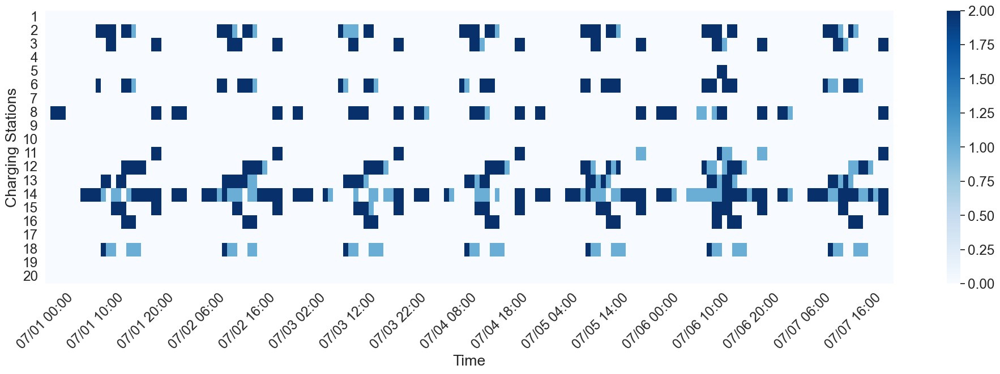

In [67]:
sns.set(rc={'figure.figsize':(20, 7)}, font_scale=1.6)
ax = sns.heatmap(popular_statistic_count, vmin=0, vmax=2, cmap="Blues")
x_name = list(popular_statistic_count.columns.strftime('%m/%d %H:00'))
# 設置刻度位置
ax.set_xticks(np.arange(0, len(x_name), 10))
ax.set_xticklabels(x_name[::10])
ax.set_yticklabels([i for i in range(1, 21)])
plt.xticks(np.arange(0, 168, step=10), rotation=45)
plt.yticks(rotation=0)
plt.xlabel("Time")
plt.ylabel("Charging Stations")
plt.tight_layout()
plt.show()

每個充電站在七天的電力總花費、總收益(電費扣除EV收益)

In [68]:
popular_statistic_df = pd.DataFrame([], columns=["locationID", "buildingID", "Total Electricity Cost", "Total Revenue"])

for locationID in popular_electricity_cost.keys():
    popular_statistic_df.loc[len(popular_statistic_df)] = [locationID, 
                                                           location.loc[locationID, "buildingID"],
                                                           popular_electricity_cost[locationID],
                                                           popular_revenue[locationID]]

popular_statistic_df.set_index("locationID", inplace=True)
popular_statistic_df

,buildingID,Total Electricity Cost,Total Revenue
locationID,,,
50230,0,152865.502667,-152865.502667
51199,1,138144.659201,-129864.659201
50841,2,278046.990839,-259506.990839
50692,3,107184.693422,-107184.693422
51087,4,118048.632786,-117688.632786
51198,5,138055.610674,-131035.610674
50840,6,110374.760628,-110374.760628
50349,7,263611.648693,-239401.648693
50909,8,139266.308481,-139266.308481


## Multiple: Remaining

### Scheduling

計算歷史資料中每個時段的剩餘空位 (要跑比較久，跑一次之後用 read 的)

In [20]:
# data_df = building_data.copy()
# data_df["parkingSlots"] = 0

# for idx, raw in data_df.iterrows():
#     contract_capacity = location.loc[location["buildingID"] == raw["buildingID"], "contractCapacity"].values[0]
#     station_num = location.loc[location["buildingID"] == raw["buildingID"], "stationNewNum"].values[0]
#     remain = math.floor((contract_capacity - raw["consumption"] + raw["generation"]) / charging_speed)
#     data_df.at[idx, "parkingSlots"] = max(min(remain, station_num), 0)

# data_df.to_csv("./Result/Schedule/MultipleStation/Remaining/building_data.csv")

data_df = pd.read_csv("./Result/Schedule/MultipleStation/Remaining/building_data.csv", index_col=0)
data_df

,originID,buildingID,datetime,consumption,timestamp,generation,contract_capacity,parkingSlots
0,281,0,2018-01-01 00:00:00,143.3757,1.590483e+10,0.001324,236,9
1,281,0,2018-01-01 01:00:00,122.7819,1.590488e+10,0.001111,236,10
2,281,0,2018-01-01 02:00:00,118.6110,1.590492e+10,0.001522,236,10
3,281,0,2018-01-01 03:00:00,125.1277,1.590496e+10,0.001524,236,10
4,281,0,2018-01-01 04:00:00,121.7389,1.590501e+10,0.001729,236,10
...,...,...,...,...,...,...,...,...
175195,512,19,2018-12-31 19:00:00,259.1442,1.628305e+10,0.000000,343,8
175196,512,19,2018-12-31 20:00:00,250.9017,1.628309e+10,0.000000,343,9
175197,512,19,2018-12-31 21:00:00,244.9671,1.628314e+10,0.000000,343,9
175198,512,19,2018-12-31 22:00:00,242.6592,1.628318e+10,0.000000,343,10


In [21]:
import time
def get_remaining_parking_slots_multiple():
    training_start_time = parser.parse("2018-01-01")
    training_end_time = parser.parse("2018-07-01")

    train_df = pd.read_csv("./Result/Schedule/MultipleStation/Remaining/building_data.csv", index_col=0)
    train_df["datetime"] = pd.to_datetime(train_df["datetime"], format="%Y-%m-%d %H:%M:%S")
    train_df = train_df[(train_df["datetime"] >= training_start_time) & (train_df["datetime"] < training_end_time)]

    remain_slots = np.zeros((20, 24))
    for buildingID in range(20):
        temp = list()
        for hour in range(24):
            filter_slots_num = train_df.loc[(train_df["buildingID"] == buildingID) & (train_df["datetime"].dt.hour == hour), "parkingSlots"]
            temp.append(math.floor(filter_slots_num.sum() / len(filter_slots_num)))
        remain_slots[buildingID] = temp

    return remain_slots


In [22]:
residual_df = pd.DataFrame([], columns=["datetime", "userID", "locationID", "buildingID", "chargingLen", "originChargingHour", "originLocationID"])
testing_start_time = charging_start_time

for day in range(7):

    # 歷史剩餘空位
    remain_order = get_remaining_parking_slots_multiple()

    # 每個充電站的充電位數量
    slots_num = np.zeros((20, 24))
    predict_slots_num = get_parking_slots(building_LSTM_data, location, testing_start_time)
    for buildingID in range(20):
        # 用 LSTM 預測結果去排
        for hour in range(24):
            slots_num[buildingID][hour] = predict_slots_num.loc[(predict_slots_num["buildingID"] == str(buildingID)) & 
                                                                (predict_slots_num["datetime"] == (testing_start_time + timedelta(hours=hour))), "parkingSlots"].values[0]
        # 直接用最大位置去排
        # slots_num[buildingID] = [location.loc[location["buildingID"] == str(buildingID), "stationNewNum"] for _ in range(24)]

    charging_request = get_charging_request(charging_data, testing_start_time)
    
    # 安排充電順序
    counter = 0
    order = list()

    while counter < (20*24):
        buildingID, hour = np.unravel_index(remain_order.argmax(), remain_order.shape)
        if buildingID in [7]:
            remain_order[buildingID][hour] = -1
            counter += 1
            continue
        order.append([buildingID, hour])
        remain_order[buildingID][hour] = -1
        counter += 1

    print(order)
    # 每個 request assign 地點和時間
    for request in charging_request:
        request[2] = int(request[2])

        for item in order:
            if item[1] + request[2] > 24:
                continue
            if slots_num[item[0]][item[1] : (item[1] + request[2])].all():
                schedule_building = item[0]
                schedule_hour = item[1]
                slots_num[item[0]][item[1] : (item[1] + request[2])] -= 1
                break
        
        residual_df.loc[len(residual_df)] = [testing_start_time + timedelta(hours=int(schedule_hour)),
                                             request[1],
                                             location.loc[location["buildingID"] == str(schedule_building)].index[0],
                                             str(schedule_building),
                                             request[2],
                                             request[3],
                                             request[4]]

    testing_start_time += timedelta(days=1)

residual_df = residual_df[residual_df["userID"] != "603475"]
# residual_df.to_csv("./Result/Schedule/MultipleStation/Remaining/Remaining.csv")
residual_df

[[0, 1], [0, 2], [2, 0], [2, 1], [2, 2], [2, 3], [2, 4], [2, 5], [2, 6], [2, 7], [2, 8], [2, 23], [9, 17], [9, 18], [9, 19], [9, 20], [9, 21], [9, 22], [9, 23], [16, 2], [18, 16], [18, 17], [18, 18], [18, 19], [18, 20], [18, 21], [18, 22], [0, 0], [0, 3], [0, 4], [0, 5], [1, 18], [1, 19], [1, 20], [1, 21], [2, 9], [2, 10], [2, 21], [2, 22], [9, 0], [9, 1], [9, 16], [10, 0], [10, 1], [10, 2], [10, 3], [10, 23], [13, 1], [13, 2], [15, 0], [15, 1], [15, 2], [15, 3], [16, 0], [16, 1], [16, 3], [16, 4], [16, 5], [16, 6], [16, 23], [18, 0], [18, 14], [18, 15], [18, 23], [19, 0], [19, 1], [19, 2], [19, 3], [19, 4], [19, 5], [19, 6], [19, 23], [1, 22], [2, 11], [2, 12], [2, 20], [8, 0], [8, 1], [10, 22], [13, 0], [13, 3], [14, 1], [14, 2], [14, 3], [14, 4], [14, 5], [15, 4], [15, 5], [16, 22], [18, 1], [18, 2], [18, 13], [19, 7], [0, 23], [1, 23], [2, 13], [2, 14], [2, 15], [2, 17], [5, 0], [5, 3], [5, 4], [5, 5], [8, 23], [9, 2], [9, 15], [13, 4], [13, 5], [13, 23], [14, 0], [14, 23], [17, 1]

,datetime,userID,locationID,buildingID,chargingLen,originChargingHour,originLocationID
0,2018-07-01 01:00:00,606941,50230,0,3,17,51087
1,2018-07-01 01:00:00,604897H,50230,0,1,16,51200
2,2018-07-01 01:00:00,604760H,50230,0,1,17,50240
3,2018-07-01 01:00:00,V009198,50230,0,2,17,50911
4,2018-07-01 01:00:00,604725H,50230,0,2,16,50261
...,...,...,...,...,...,...,...
748,2018-07-07 20:00:00,604900H,50261,9,2,12,50266
749,2018-07-07 20:00:00,604804H,50261,9,2,12,50230
750,2018-07-07 20:00:00,604745H,50261,9,2,12,51199
751,2018-07-07 21:00:00,603522H,50261,9,2,12,50911


### Evaluation

P.45 Station Profits \\


變數 -> 論文內的名稱 \\
-------------------------------------------------------- \\
基本電費(basic_tariff) -> Basic Tariff \\
流動電費(current_tariff) -> Current Tariff \\
超約罰金(overload_penalty) -> Overage Penalty \\
收益(remaining_revenue) -> Revenue \\

In [23]:
overage = 0
electricity_price = pd.DataFrame([], columns=["basic_tariff", "current_tariff", "overload_penalty", "total"])
residual_statistic_count = pd.DataFrame([], columns=[charging_start_time + timedelta(hours=hour) for hour in range(0, 7*24)])
overload_percentage = list()
remaining_ev_charging_volume = list()
remaining_electricity_cost = defaultdict()
remaining_revenue = defaultdict()

for cs in location.index:
    info = building_data[ (building_data["buildingID"] == location.loc[cs, "buildingID"]) &  (building_data["datetime"] >= building_start_time) & (building_data["datetime"] < building_end_time) ]

    ### EV charging data ###
    ev_info = [0 for i in range(24*7)]
    current = charging_start_time
    for day in range(7):
        for hour in range(24):
            charging_value = len(residual_df[(residual_df["locationID"] == cs) &
                                             (residual_df["datetime"] >= current) &
                                             (residual_df["datetime"] < (current + timedelta(days=1))) &
                                             (residual_df["datetime"].dt.hour <= hour) &
                                             ((residual_df['datetime'].dt.hour + residual_df["chargingLen"]) > hour)]) * charging_speed
            ev_info[(day * 24) + hour] = charging_value
        current += timedelta(days=1)
    
    remaining_ev_charging_volume.append(ev_info)
    info["charging"] = ev_info
    info["total"] = info["consumption"] - info["generation"] + info["charging"]

    ### check number of exceed ###
    info["exceed"] = info["total"] - location.loc[cs, "contractCapacity"]
    info["exceed"] = info["exceed"].apply(lambda x: 0 if x < 0 else x)

    overload_slots = 0
    for raw in info["exceed"]:
        if raw != 0:
            overload_slots += 1
        # overload_slots += math.ceil(raw / charging_speed)

    overload_percentage.append(overload_slots / (7* 24))
    print(int(location.loc[cs, 'buildingID']), ":")
    print(f"overload = {'{:.2f}'.format(info['exceed'].sum())}")
    print(f"overload_percentage = {'{:.4f}'.format(overload_percentage[-1])}")
    
    
    overage += info["exceed"].sum()
    basic_tariff, current_tariff, overload_penalty = calculate_electricity_price(location, cs, info)
    total_price = basic_tariff + current_tariff + overload_penalty
    electricity_price.loc[len(electricity_price)] = [basic_tariff, current_tariff, overload_penalty, total_price]
    remaining_revenue[cs] = (-1) * total_price + (charging_fee * sum(ev_info))
    remaining_electricity_cost[cs] = total_price
    print(f"revenue = {'{:.2f}'.format(remaining_revenue[cs])}")
    
    # ### image ###
    # ax = plt.gca()

    # info.plot(kind='line', x='datetime',y='consumption', ax=ax, figsize=(20.5,8))
    # info.plot(kind='line', x='datetime',y='generation', color='red', ax=ax, figsize=(20.5,8))
    # info.plot(kind='line', x='datetime',y='charging', color='yellowgreen', ax=ax, figsize=(20.5,8))
    # info.plot(kind='line', x='datetime',y='total', color='darkviolet', ax=ax, figsize=(20.5,8), fontsize=18)
    # ax.axhline(y=location.loc[cs, "contractCapacity"], color="black")

    # plt.title(f"BuildingID = {int(location.loc[cs, 'buildingID'])}", fontsize=20)
    # plt.xlabel("Time", fontsize=20)
    # plt.ylabel("Electricity (kW)", fontsize=20)
    # plt.legend(fontsize=18, loc="upper right")
    # # plt.savefig(f"./Result/Schedule/MultipleStation/Remaining/Schedule_{int(location.loc[cs, 'buildingID'])}.png", bbox_inches='tight')
    # plt.show()

    info["chargingCount"] = info["charging"].apply(lambda x: x/charging_speed)
    info.set_index("datetime", inplace=True)
    residual_statistic_count.loc[len(residual_statistic_count)] = info["chargingCount"].T

print("==========================")
# print(f"total overage = {overage}")
# print(f"average overage = {'{:.2f}'.format(overage/20)}")
# print(f"average overload_percentage = {'{:.4f}'.format(sum(overload_percentage)/20)}")
# print(f"overload_percentage = {overload_percentage}")
# print(f"revenue = {remaining_revenue}")
print(f"average revenue = {int(sum(remaining_revenue.values()) / 20)}")
print(electricity_price.mean(axis=0))

0 :
overload = 264.55
overload_percentage = 0.1369
revenue = -7795.47
1 :
overload = 100.24
overload_percentage = 0.1071
revenue = -6579.18
2 :
overload = 41.97
overload_percentage = 0.0298
revenue = -11251.02
3 :
overload = 45.17
overload_percentage = 0.0298
revenue = -5685.39
4 :
overload = 110.63
overload_percentage = 0.1190
revenue = -6223.51
5 :
overload = 90.86
overload_percentage = 0.0774
revenue = -7023.50
6 :
overload = 104.20
overload_percentage = 0.1131
revenue = -5849.36
7 :
overload = 726.96
overload_percentage = 0.2262
revenue = -13966.13
8 :
overload = 0.00
overload_percentage = 0.0000
revenue = -7288.05
9 :
overload = 0.00
overload_percentage = 0.0000
revenue = -9375.79
10 :
overload = 7.82
overload_percentage = 0.0119
revenue = -8469.77
11 :
overload = 54.56
overload_percentage = 0.0833
revenue = -4816.96
12 :
overload = 0.00
overload_percentage = 0.0000
revenue = -4519.67
13 :
overload = 0.00
overload_percentage = 0.0000
revenue = -6716.40
14 :
overload = 0.00
overloa

P.45 Load Balancing \\
平衡度(variation)

In [76]:
testing_start_time = charging_start_time
remaining_utilization = defaultdict(list)
remaining_var = list()
while testing_start_time < charging_end_time:
    for cs in range(20):
        truth_slots = truth_data.loc[(truth_data["datetime"] == testing_start_time) & (truth_data["buildingID"] == str(cs)), "parkingSlots"].values[0]
        
        days = (testing_start_time - charging_start_time).days
        seconds = (testing_start_time - charging_start_time).seconds
        remaining_slots = remaining_ev_charging_volume[cs][int(days * 24 + (seconds / 3600))] / charging_speed
        remaining_utilization[testing_start_time].append(remaining_slots / truth_slots * 1 if truth_slots != 0 else 1)

    remaining_var.append(np.var(remaining_utilization[testing_start_time]))
    testing_start_time += timedelta(hours=1)

remaining_variation = sum(remaining_var) / len(remaining_var)
remaining_variation

0.12843021600767174

P.45 Divergent Preferences \\

變數 -> 論文內的名稱 \\
-------------------------------------------------------- \\
unfavored_type -> Unfavored Ratio \\
time -> Moving Time \\
distance -> Moving distance

In [77]:
user_list = get_user_list(parser.parse("2018-07-01"))
history_charging_df = charging_data[charging_data["createdNew"] < parser.parse("2018-07-01")].copy()
history_charging_df["facilityType"] = history_charging_df["locationId"].apply(lambda x: location.loc[str(x), "FacilityType"])
history_charging_df["createdHour"] = history_charging_df["createdHour"].astype(int)

history_user_group = history_charging_df.groupby(["userId"])
user_preference = defaultdict(dict)

for user in user_list:
    ## 充電站選多個
    user_preference[user]["locationId"] = list()
    user_preference[user]["facilityType"] = list()
    user_preference[user]["createdHour"] = list()

    most_prefer_num = math.floor(len(history_user_group.get_group(user)) / 2)
    cs_charging_num = history_user_group.get_group(user).groupby("locationId").size()
    for cs in cs_charging_num.keys():
        if cs_charging_num[cs] >= most_prefer_num:
            user_preference[user]["locationId"].append(cs)
            user_preference[user]["facilityType"].append(location.loc[cs, "FacilityType"])
            user_preference[user]["createdHour"] += list(history_user_group.get_group(user).groupby("locationId").get_group(cs).groupby("createdHour").size().keys())
            user_preference[user]["createdHour"] = sorted(list(set(user_preference[user]["createdHour"])))
    ### 避免有人都沒有超過 50% 的
    if len(user_preference[user]["locationId"]) == 0:
        user_preference[user]["locationId"].append(cs_charging_num.sort_values(ascending=False).keys()[0])
        user_preference[user]["facilityType"].append(location.loc[user_preference[user]["locationId"][0], "FacilityType"])
        user_preference[user]["createdHour"] += list(history_user_group.get_group(user).groupby("locationId").get_group(user_preference[user]["locationId"][0]).groupby("createdHour").size().keys())
        user_preference[user]["createdHour"] = sorted(list(set(user_preference[user]["createdHour"])))

hit_type = 0
unfavored_type = 0
distance = 0
time = 0
for idx, raw in residual_df.iterrows():
    if location.loc[raw["locationID"], "FacilityType"] in user_preference[raw["userID"]]["facilityType"]:
        hit_type += 1
    if not location.loc[raw["locationID"], "FacilityType"] in user_preference[raw["userID"]]["facilityType"]:
        unfavored_type += 1
    
    min_distance = 1000
    for cs in user_preference[raw["userID"]]["locationId"]:
        value = haversine(location.loc[raw["locationID"], ["Latitude", "Longitude"]].values, location.loc[cs, ["Latitude", "Longitude"]].values, unit = Unit.KILOMETERS)
        min_distance = min(min_distance, value)
    distance += min_distance

    min_time = 1000
    for hour in user_preference[raw["userID"]]["createdHour"]:
        value = abs(raw["datetime"].hour - hour)
        min_time = min(min_time, value)
    time += min_time


print(f"average hit type: {hit_type / len(residual_df)}")
print(f"average unfavored type: {unfavored_type / len(residual_df)}")
print(f"average distance: {distance / len(residual_df)}")
print(f"average time: {time / len(residual_df)}")

average hit type: 0.25398936170212766
average unfavored type: 0.7460106382978723
average distance: 3.6520206886796465
average time: 4.402925531914893


### Statistic

每個時間點每個充電站被分配到的車位數

In [78]:
residual_statistic_count

,2018-07-01 00:00:00,2018-07-01 01:00:00,2018-07-01 02:00:00,2018-07-01 03:00:00,2018-07-01 04:00:00,2018-07-01 05:00:00,2018-07-01 06:00:00,2018-07-01 07:00:00,2018-07-01 08:00:00,2018-07-01 09:00:00,...,2018-07-07 14:00:00,2018-07-07 15:00:00,2018-07-07 16:00:00,2018-07-07 17:00:00,2018-07-07 18:00:00,2018-07-07 19:00:00,2018-07-07 20:00:00,2018-07-07 21:00:00,2018-07-07 22:00:00,2018-07-07 23:00:00
0,0.0,10.0,10.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,10.0,10.0,10.0,10.0,7.0,2.0,1.0


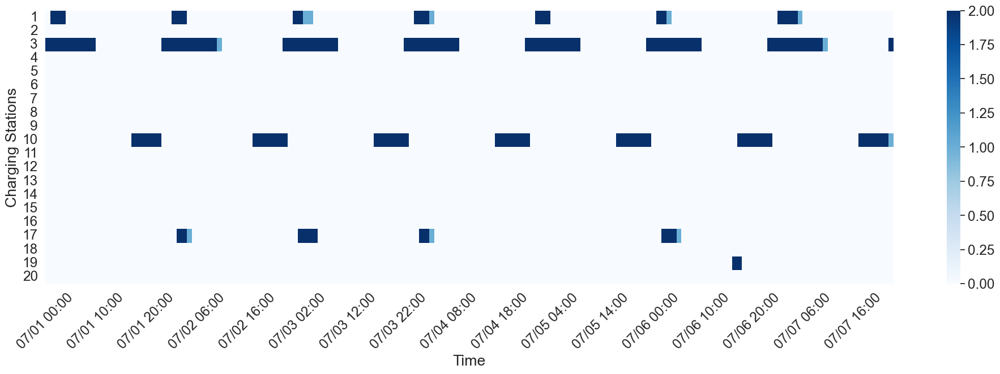

In [80]:
sns.set(rc={'figure.figsize':(20, 7)}, font_scale=1.6)
ax = sns.heatmap(residual_statistic_count, vmin=0, vmax=2, cmap="Blues")
x_name = list(residual_statistic_count.columns.strftime('%m/%d %H:00'))
# 設置刻度位置
ax.set_xticks(np.arange(0, len(x_name), 10))
ax.set_xticklabels(x_name[::10])
ax.set_yticklabels([i for i in range(1, 21)])
plt.xticks(np.arange(0, 168, step=10), rotation=45)
plt.yticks(rotation=0)
plt.xlabel("Time")
plt.ylabel("Charging Stations")
plt.tight_layout()
plt.show()

每個充電站在七天的電力總花費、總收益(電費扣除EV收益)

In [81]:
remaining_statistic_df = pd.DataFrame([], columns=["locationID", "buildingID", "Total Electricity Cost", "Total Revenue"])

for locationID in remaining_electricity_cost.keys():
    remaining_statistic_df.loc[len(remaining_statistic_df)] = [locationID,
                                                               location.loc[locationID, "buildingID"],
                                                               remaining_electricity_cost[locationID],
                                                               remaining_revenue[locationID]]

remaining_statistic_df.set_index("locationID", inplace=True)
remaining_statistic_df

,buildingID,Total Electricity Cost,Total Revenue
locationID,,,
50230,0,155289.102667,-140349.102667
51199,1,123373.835100,-123373.835100
50841,2,255320.461740,-189710.461740
50692,3,107184.693422,-107184.693422
51087,4,117911.832786,-117911.832786
51198,5,133351.321783,-133351.321783
50840,6,110374.760628,-110374.760628
50349,7,257840.248693,-257840.248693
50909,8,139266.308481,-139266.308481


## Multiple: Round Robin (RR)

In [17]:
def calculate_utilization(usage_num, slots_num):
    load_matrix = np.zeros((20, 24))
    for buildingID in range(20):
        for hour in range(24):
            if slots_num[buildingID][hour] == 0:
                #slots_num[buildingID][hour]
                load_matrix[buildingID][hour] = 1
            else:
                load_matrix[buildingID][hour] = usage_num[buildingID][hour] / slots_num[buildingID][hour]
    return load_matrix

def average_utilization(load_matrix):
    average_utilization_ratio = np.zeros(24)
    for hour in range(24):
        average_utilization_ratio[hour] = load_matrix.sum(axis=0)[hour] / len(location)
    return average_utilization_ratio

### Scheduling

In [18]:
round_df = pd.DataFrame([], columns=["datetime", "userID", "locationID", "buildingID", "chargingLen", "originChargingHour", "originLocationID"])
testing_start_time = charging_start_time

schedule_order = list()
for hour in range(24):
    for cs in range(20):
        schedule_order.append([cs, hour])
round_index = 0

for day in range(7):
    charging_request = get_charging_request(charging_data, testing_start_time)

    slots_num = np.zeros((20, 24))
    predict_slots_num = get_parking_slots(building_LSTM_data, location, testing_start_time)
    for buildingID in range(20):
        # 用 LSTM 預測結果去排
        for hour in range(24):
            slots_num[buildingID][hour] = predict_slots_num.loc[(predict_slots_num["buildingID"] == str(buildingID)) & 
                                                                (predict_slots_num["datetime"] == (testing_start_time + timedelta(hours=hour))), "parkingSlots"].values[0]
        # 直接用最大位置去排
        # slots_num[buildingID] = [location.loc[location["buildingID"] == str(buildingID), "stationNewNum"] for _ in range(24)]


    for request in charging_request:
        request[2] = int(request[2])

        # 檢查有沒有充電位 (LSTM)
        check_slots = False
        while not check_slots:
            # 檢查時間夠不夠充
            if (schedule_order[round_index][1] + request[2]) > 24:
                round_index = (round_index + 1) % len(schedule_order)
                continue
            
            # 檢查有沒有充電位置
            if not slots_num[schedule_order[round_index][0]][schedule_order[round_index][1]: (schedule_order[round_index][1]+request[2])].all():
                round_index = (round_index + 1) % len(schedule_order)
            else: 
                slots_num[schedule_order[round_index][0]][schedule_order[round_index][1]: (schedule_order[round_index][1]+request[2])] -= 1
                check_slots = True
        

        # print(schedule_order[round_index][0], schedule_order[round_index][1])
        round_df.loc[len(round_df)] = [testing_start_time + timedelta(hours=int(schedule_order[round_index][1])),
                                       request[1],
                                       location.loc[location["buildingID"] == str(schedule_order[round_index][0])].index[0],
                                       str(schedule_order[round_index][0]),
                                       request[2],
                                       request[3],
                                       request[4]]

        round_index = (round_index + 1) % len(schedule_order)

    testing_start_time += timedelta(days=1)

round_df = round_df[round_df["userID"] != "603475"]
# round_df.to_csv("./Result/Schedule/MultipleStation/RoundRobin/RoundRobin.csv")
round_df

,datetime,userID,locationID,buildingID,chargingLen,originChargingHour,originLocationID
0,2018-07-01 00:00:00,606941,50230,0,3,17,51087
1,2018-07-01 00:00:00,604897H,51199,1,1,16,51200
2,2018-07-01 00:00:00,604760H,50841,2,1,17,50240
3,2018-07-01 00:00:00,V009198,50692,3,2,17,50911
4,2018-07-01 00:00:00,604725H,51087,4,2,16,50261
...,...,...,...,...,...,...,...
748,2018-07-07 20:00:00,604900H,50675,18,2,12,50266
749,2018-07-07 20:00:00,604804H,50268,19,2,12,50230
750,2018-07-07 21:00:00,604745H,50230,0,2,12,51199
751,2018-07-07 21:00:00,603522H,51199,1,2,12,50911


### Evaluation

P.45 Station Profits \\


變數 -> 論文內的名稱 \\
-------------------------------------------------------- \\
基本電費(basic_tariff) -> Basic Tariff \\
流動電費(current_tariff) -> Current Tariff \\
超約罰金(overload_penalty) -> Overage Penalty \\
收益(round_revenue) -> Revenue \\

In [19]:
overage = 0
electricity_price = pd.DataFrame([], columns=["basic_tariff", "current_tariff", "overload_penalty", "total"])
round_statistic_count = pd.DataFrame([], columns=[charging_start_time + timedelta(hours=hour) for hour in range(0, 7*24)])
overload_percentage = list()
round_ev_charging_volume = list()
round_electricity_cost = defaultdict()
round_revenue = defaultdict()

for cs in location.index:
    info = building_data[ (building_data["buildingID"] == location.loc[cs, "buildingID"]) &  (building_data["datetime"] >= building_start_time) & (building_data["datetime"] < building_end_time) ]

    ### EV charging data ###
    ev_info = [0 for i in range(24*7)]
    current = charging_start_time
    for day in range(7):
        for hour in range(24):
            charging_value = len(round_df[(round_df["locationID"] == cs) &
                                             (round_df["datetime"] >= current) &
                                             (round_df["datetime"] < (current + timedelta(days=1))) &
                                             (round_df["datetime"].dt.hour <= hour) &
                                             ((round_df['datetime'].dt.hour + round_df["chargingLen"]) > hour)]) * charging_speed
            ev_info[(day * 24) + hour] = charging_value
        current += timedelta(days=1)
    
    round_ev_charging_volume.append(ev_info)
    info["charging"] = ev_info
    info["total"] = info["consumption"] - info["generation"] + info["charging"]

    ### check number of exceed ###
    info["exceed"] = info["total"] - location.loc[cs, "contractCapacity"]
    info["exceed"] = info["exceed"].apply(lambda x: 0 if x < 0 else x)

    overload_slots = 0
    for raw in info["exceed"]:
        if raw != 0:
            overload_slots += 1
        # overload_slots += math.ceil(raw / charging_speed)

    overload_percentage.append(overload_slots / (7* 24))
    print(int(location.loc[cs, 'buildingID']), ":")
    print(f"overload = {'{:.2f}'.format(info['exceed'].sum())}")
    print(f"overload_percentage = {'{:.4f}'.format(overload_percentage[-1])}")
    
    
    overage += info["exceed"].sum()
    basic_tariff, current_tariff, overload_penalty = calculate_electricity_price(location, cs, info)
    total_price = basic_tariff + current_tariff + overload_penalty
    electricity_price.loc[len(electricity_price)] = [basic_tariff, current_tariff, overload_penalty, total_price]
    round_revenue[cs] = (-1) * total_price + (charging_fee * sum(ev_info))
    round_electricity_cost[cs] = total_price
    print(f"revenue = {'{:.2f}'.format(round_revenue[cs])}")
    
    ### image ###
    # ax = plt.gca()

    # info.plot(kind='line', x='datetime',y='consumption', ax=ax, figsize=(20.5,8))
    # info.plot(kind='line', x='datetime',y='generation', color='red', ax=ax, figsize=(20.5,8))
    # info.plot(kind='line', x='datetime',y='charging', color='yellowgreen', ax=ax, figsize=(20.5,8))
    # info.plot(kind='line', x='datetime',y='total', color='darkviolet', ax=ax, figsize=(20.5,8), fontsize=18)
    # ax.axhline(y=location.loc[cs, "contractCapacity"], color="black")

    # plt.title(f"BuildingID = {int(location.loc[cs, 'buildingID'])}", fontsize=20)
    # plt.xlabel("Time", fontsize=20)
    # plt.ylabel("Electricity (kW)", fontsize=20)
    # plt.legend(fontsize=18, loc="upper right")
    # # plt.savefig(f"./Result/Schedule/MultipleStation/Remaining/Schedule_{int(location.loc[cs, 'buildingID'])}.png", bbox_inches='tight')
    # plt.show()

    info["chargingCount"] = info["charging"].apply(lambda x: x/charging_speed)
    info.set_index("datetime", inplace=True)
    round_statistic_count.loc[len(round_statistic_count)] = info["chargingCount"].T

print("==========================")
# print(f"total overage = {overage}")
# print(f"average overage = {'{:.2f}'.format(overage/20)}")
# print(f"average overload_percentage = {'{:.4f}'.format(sum(overload_percentage)/20)}")
# print(f"overload_percentage = {overload_percentage}")
# print(f"revenue = {round_revenue}")
print(f"average revenue = {int(sum(round_revenue.values()) / 20)}")
print(electricity_price.mean(axis=0))

0 :
overload = 463.98
overload_percentage = 0.2024
revenue = -8945.14
1 :
overload = 325.74
overload_percentage = 0.2024
revenue = -7143.54
2 :
overload = 157.06
overload_percentage = 0.0714
revenue = -13493.43
3 :
overload = 101.83
overload_percentage = 0.0536
revenue = -6013.44
4 :
overload = 212.32
overload_percentage = 0.1905
revenue = -6530.44
5 :
overload = 227.58
overload_percentage = 0.1667
revenue = -7252.56
6 :
overload = 141.99
overload_percentage = 0.1548
revenue = -5735.16
7 :
overload = 765.26
overload_percentage = 0.2619
revenue = -13863.34
8 :
overload = 44.66
overload_percentage = 0.0476
revenue = -7642.27
9 :
overload = 0.00
overload_percentage = 0.0000
revenue = -10050.05
10 :
overload = 28.80
overload_percentage = 0.0357
revenue = -8637.03
11 :
overload = 186.67
overload_percentage = 0.1726
revenue = -5057.76
12 :
overload = 6.57
overload_percentage = 0.0119
revenue = -4598.62
13 :
overload = 0.62
overload_percentage = 0.0060
revenue = -6634.69
14 :
overload = 7.38


P.45 Load Balancing \\
平衡度(variation)

In [84]:
testing_start_time = charging_start_time
round_utilization = defaultdict(list)
round_var = list()
while testing_start_time < charging_end_time:
    for cs in range(20):
        truth_slots = truth_data.loc[(truth_data["datetime"] == testing_start_time) & (truth_data["buildingID"] == str(cs)), "parkingSlots"].values[0]
        
        days = (testing_start_time - charging_start_time).days
        seconds = (testing_start_time - charging_start_time).seconds
        round_slots = round_ev_charging_volume[cs][int(days * 24 + (seconds / 3600))] / charging_speed
        round_utilization[testing_start_time].append(round_slots / truth_slots * 1 if truth_slots != 0 else 1)

    round_var.append(np.var(round_utilization[testing_start_time]))
    testing_start_time += timedelta(hours=1)

round_variation = sum(round_var) / len(round_var)
round_variation

0.1250411881417856

P.45 Divergent Preferences \\

變數 -> 論文內的名稱 \\
-------------------------------------------------------- \\
unfavored_type -> Unfavored Ratio \\
time -> Moving Time \\
distance -> Moving distance

In [85]:
user_list = get_user_list(parser.parse("2018-07-01"))
history_charging_df = charging_data[charging_data["createdNew"] < parser.parse("2018-07-01")].copy()
history_charging_df["facilityType"] = history_charging_df["locationId"].apply(lambda x: location.loc[str(x), "FacilityType"])
history_charging_df["createdHour"] = history_charging_df["createdHour"].astype(int)

history_user_group = history_charging_df.groupby(["userId"])
user_preference = defaultdict(dict)

for user in user_list:
    ## 充電站選多個
    user_preference[user]["locationId"] = list()
    user_preference[user]["facilityType"] = list()
    user_preference[user]["createdHour"] = list()

    most_prefer_num = math.floor(len(history_user_group.get_group(user)) / 2)
    cs_charging_num = history_user_group.get_group(user).groupby("locationId").size()
    for cs in cs_charging_num.keys():
        if cs_charging_num[cs] >= most_prefer_num:
            user_preference[user]["locationId"].append(cs)
            user_preference[user]["facilityType"].append(location.loc[cs, "FacilityType"])
            user_preference[user]["createdHour"] += list(history_user_group.get_group(user).groupby("locationId").get_group(cs).groupby("createdHour").size().keys())
            user_preference[user]["createdHour"] = sorted(list(set(user_preference[user]["createdHour"])))
    ### 避免有人都沒有超過 50% 的
    if len(user_preference[user]["locationId"]) == 0:
        user_preference[user]["locationId"].append(cs_charging_num.sort_values(ascending=False).keys()[0])
        user_preference[user]["facilityType"].append(location.loc[user_preference[user]["locationId"][0], "FacilityType"])
        user_preference[user]["createdHour"] += list(history_user_group.get_group(user).groupby("locationId").get_group(user_preference[user]["locationId"][0]).groupby("createdHour").size().keys())
        user_preference[user]["createdHour"] = sorted(list(set(user_preference[user]["createdHour"])))

hit_type = 0
unfavored_type = 0
distance = 0
time = 0
for idx, raw in round_df.iterrows():
    if location.loc[raw["locationID"], "FacilityType"] in user_preference[raw["userID"]]["facilityType"]:
        hit_type += 1
    if not location.loc[raw["locationID"], "FacilityType"] in user_preference[raw["userID"]]["facilityType"]:
        unfavored_type += 1
    
    min_distance = 1000
    for cs in user_preference[raw["userID"]]["locationId"]:
        value = haversine(location.loc[raw["locationID"], ["Latitude", "Longitude"]].values, location.loc[cs, ["Latitude", "Longitude"]].values, unit = Unit.KILOMETERS)
        min_distance = min(min_distance, value)
    distance += min_distance

    min_time = 1000
    for hour in user_preference[raw["userID"]]["createdHour"]:
        value = abs(raw["datetime"].hour - hour)
        min_time = min(min_time, value)
    time += min_time


print(f"average hit type: {hit_type / len(round_df)}")
print(f"average unfavored type: {unfavored_type / len(round_df)}")
print(f"average distance: {distance / len(round_df)}")
print(f"average time: {time / len(round_df)}")

average hit type: 0.24601063829787234
average unfavored type: 0.7539893617021277
average distance: 3.995299846823616
average time: 3.199468085106383


### Statistic

每個時間點每個充電站被分配到的車位數

In [86]:
round_statistic_count

,2018-07-01 00:00:00,2018-07-01 01:00:00,2018-07-01 02:00:00,2018-07-01 03:00:00,2018-07-01 04:00:00,2018-07-01 05:00:00,2018-07-01 06:00:00,2018-07-01 07:00:00,2018-07-01 08:00:00,2018-07-01 09:00:00,...,2018-07-07 14:00:00,2018-07-07 15:00:00,2018-07-07 16:00:00,2018-07-07 17:00:00,2018-07-07 18:00:00,2018-07-07 19:00:00,2018-07-07 20:00:00,2018-07-07 21:00:00,2018-07-07 22:00:00,2018-07-07 23:00:00
0,1.0,2.0,2.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,2.0,1.0,1.0,2.0,1.0,0.0
1,1.0,1.0,2.0,2.0,2.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,2.0,3.0,1.0,2.0,2.0,1.0,0.0
2,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,1.0
3,1.0,2.0,2.0,2.0,2.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,1.0,2.0,1.0,1.0,1.0,0.0,0.0,0.0
4,1.0,2.0,1.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0
5,1.0,2.0,1.0,2.0,3.0,1.0,1.0,0.0,0.0,0.0,...,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0
6,1.0,2.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,...,0.0,1.0,1.0,2.0,0.0,0.0,1.0,0.0,0.0,0.0
7,1.0,1.0,2.0,2.0,1.0,1.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,1.0,2.0,2.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,0.0,0.0
9,1.0,1.0,2.0,2.0,2.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,1.0,2.0,1.0,2.0,1.0,0.0,0.0,0.0


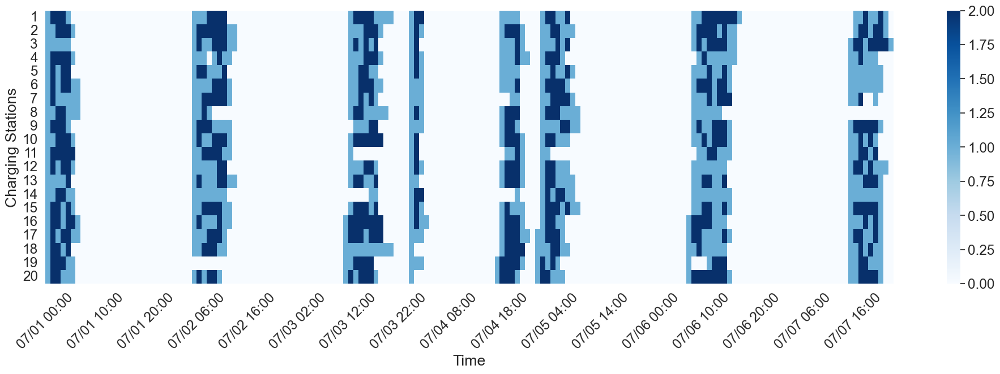

In [88]:
sns.set(rc={'figure.figsize':(20, 7)}, font_scale=1.6)
ax = sns.heatmap(round_statistic_count, vmin=0, vmax=2, cmap="Blues")
x_name = list(round_statistic_count.columns.strftime('%m/%d %H:00'))
# 設置刻度位置
ax.set_xticks(np.arange(0, len(x_name), 10))
ax.set_xticklabels(x_name[::10])
ax.set_yticklabels([i for i in range(1, 21)])
plt.xticks(np.arange(0, 168, step=10), rotation=45)
plt.yticks(rotation=0)
plt.xlabel("Time")
plt.ylabel("Charging Stations")
plt.tight_layout()
plt.show()

每個充電站在七天的電力總花費、總收益(電費扣除EV收益)

In [89]:
round_statistic_df = pd.DataFrame([], columns=["locationID", "buildingID", "Total Electricity Cost", "Total Revenue"])

for locationID in round_electricity_cost.keys():
    round_statistic_df.loc[len(round_statistic_df)] = [locationID,
                                                       location.loc[locationID, "buildingID"],
                                                       round_electricity_cost[locationID],
                                                       round_revenue[locationID]]

round_statistic_df.set_index("locationID", inplace=True)
round_statistic_df

,buildingID,Total Electricity Cost,Total Revenue
locationID,,,
50230,0,168285.482465,-161445.482465
51199,1,136402.209155,-129112.209155
50841,2,253514.861740,-246944.861740
50692,3,115512.703852,-109842.703852
51087,4,125866.420230,-120466.420230
51198,5,140670.546735,-134280.546735
50840,6,112034.160628,-106364.160628
50349,7,259216.648693,-254356.648693
50909,8,148458.036494,-142248.036494


## Multiple: Least Utilization (LU)

### Scheduling

In [92]:
LU_df = pd.DataFrame([], columns=["datetime", "userID", "locationID", "buildingID", "chargingLen", "originChargingHour", "originLocationID"])
testing_start_time = charging_start_time


for day in range(7):
    charging_request = get_charging_request(charging_data, testing_start_time)

    slots_num = np.zeros((20, 24))
    usage_num = np.zeros((20, 24))
    predict_slots_num = get_parking_slots(building_LSTM_data, location, testing_start_time)
    for buildingID in range(20):
        # 用 LSTM 預測結果去排
        for hour in range(24):
            slots_num[buildingID][hour] = predict_slots_num.loc[(predict_slots_num["buildingID"] == str(buildingID)) & 
                                                                (predict_slots_num["datetime"] == (testing_start_time + timedelta(hours=hour))), "parkingSlots"].values[0]
        # 直接用最大位置去排
        # slots_num[buildingID] = [location.loc[location["buildingID"] == str(buildingID), "stationNewNum"] for _ in range(24)]
    load_matrix = calculate_utilization(usage_num, slots_num)
    average_utilization_ratio = average_utilization(load_matrix)


    for request in charging_request:
        request[2] = int(request[2])

        max_diff_cs = 0
        max_diff_hour = 0
        max_diff = 9999
        for cs in range(20):
            for hour in range(24):
                if load_matrix[cs][hour] < max_diff and (hour + request[2]) <= 24:
                    max_diff = load_matrix[cs][hour]
                    max_diff_cs = cs
                    max_diff_hour = hour
        schedule_building = max_diff_cs
        schedule_hour = max_diff_hour

        # print(schedule_building, schedule_hour, max_diff)
        LU_df.loc[len(LU_df)] = [testing_start_time + timedelta(hours=int(schedule_hour)),
                                       request[1],
                                       location.loc[location["buildingID"] == str(schedule_building)].index[0],
                                       str(schedule_building),
                                       request[2],
                                       request[3],
                                       request[4]]

        # 更新使用率
        usage_num[schedule_building][schedule_hour:schedule_hour+request[2]] += 1
        load_matrix = calculate_utilization(usage_num, slots_num)
        average_utilization_ratio = average_utilization(load_matrix)
        #

        schedule_hour = (schedule_hour + 1) % 24

    testing_start_time += timedelta(days=1)

LU_df = LU_df[LU_df["userID"] != "603475"]
# LU_df.to_csv("./Result/Schedule/MultipleStation/RoundRobin/RoundRobin.csv")
LU_df

,datetime,userID,locationID,buildingID,chargingLen,originChargingHour,originLocationID
0,2018-07-01 00:00:00,606941,50230,0,3,17,51087
1,2018-07-01 03:00:00,604897H,50230,0,1,16,51200
2,2018-07-01 04:00:00,604760H,50230,0,1,17,50240
3,2018-07-01 05:00:00,V009198,50230,0,2,17,50911
4,2018-07-01 07:00:00,604725H,50230,0,2,16,50261
...,...,...,...,...,...,...,...
748,2018-07-07 04:00:00,604900H,50349,7,2,12,50266
749,2018-07-07 06:00:00,604804H,50349,7,2,12,50230
750,2018-07-07 08:00:00,604745H,50349,7,2,12,51199
751,2018-07-07 21:00:00,603522H,50349,7,2,12,50911


### Evaluation

P.45 Station Profits \\


變數 -> 論文內的名稱 \\
-------------------------------------------------------- \\
基本電費(basic_tariff) -> Basic Tariff \\
流動電費(current_tariff) -> Current Tariff \\
超約罰金(overload_penalty) -> Overage Penalty \\
收益(LU_revenue) -> Revenue \\

In [93]:
overage = 0
electricity_price = pd.DataFrame([], columns=["basic_tariff", "current_tariff", "overload_penalty", "total"])
LU_statistic_count = pd.DataFrame([], columns=[charging_start_time + timedelta(hours=hour) for hour in range(0, 7*24)])
overload_percentage = list()
LU_ev_charging_volume = list()
LU_electricity_cost = defaultdict()
LU_revenue = defaultdict()

for cs in location.index:
    info = building_data[ (building_data["buildingID"] == location.loc[cs, "buildingID"]) &  (building_data["datetime"] >= building_start_time) & (building_data["datetime"] < building_end_time) ]

    ### EV charging data ###
    ev_info = [0 for i in range(24*7)]
    current = charging_start_time
    for day in range(7):
        for hour in range(24):
            charging_value = len(LU_df[(LU_df["locationID"] == cs) &
                                             (LU_df["datetime"] >= current) &
                                             (LU_df["datetime"] < (current + timedelta(days=1))) &
                                             (LU_df["datetime"].dt.hour <= hour) &
                                             ((LU_df['datetime'].dt.hour + LU_df["chargingLen"]) > hour)]) * charging_speed
            ev_info[(day * 24) + hour] = charging_value
        current += timedelta(days=1)
    
    LU_ev_charging_volume.append(ev_info)
    info["charging"] = ev_info
    info["total"] = info["consumption"] - info["generation"] + info["charging"]

    ### check number of exceed ###
    info["exceed"] = info["total"] - location.loc[cs, "contractCapacity"]
    info["exceed"] = info["exceed"].apply(lambda x: 0 if x < 0 else x)

    overload_slots = 0
    for raw in info["exceed"]:
        if raw != 0:
            overload_slots += 1
        # overload_slots += math.ceil(raw / charging_speed)

    overload_percentage.append(overload_slots / (7* 24))
    print(int(location.loc[cs, 'buildingID']), ":")
    print(f"overload = {'{:.2f}'.format(info['exceed'].sum())}")
    print(f"overload_percentage = {'{:.4f}'.format(overload_percentage[-1])}")
    
    
    overage += info["exceed"].sum()
    basic_tariff, current_tariff, overload_penalty = calculate_electricity_price(location, cs, info)
    total_price = basic_tariff + current_tariff + overload_penalty
    electricity_price.loc[len(electricity_price)] = [basic_tariff, current_tariff, overload_penalty, total_price]
    LU_revenue[cs] = (-1) * total_price + (charging_fee * sum(ev_info))
    LU_electricity_cost[cs] = total_price
    print(f"revenue = {'{:.2f}'.format(LU_revenue[cs])}")
    
    ### image ###
    # ax = plt.gca()

    # info.plot(kind='line', x='datetime',y='consumption', ax=ax, figsize=(20.5,8))
    # info.plot(kind='line', x='datetime',y='generation', color='red', ax=ax, figsize=(20.5,8))
    # info.plot(kind='line', x='datetime',y='charging', color='yellowgreen', ax=ax, figsize=(20.5,8))
    # info.plot(kind='line', x='datetime',y='total', color='darkviolet', ax=ax, figsize=(20.5,8), fontsize=18)
    # ax.axhline(y=location.loc[cs, "contractCapacity"], color="black")

    # plt.title(f"BuildingID = {int(location.loc[cs, 'buildingID'])}", fontsize=20)
    # plt.xlabel("Time", fontsize=20)
    # plt.ylabel("Electricity (kW)", fontsize=20)
    # plt.legend(fontsize=18, loc="upper right")
    # # plt.savefig(f"./Result/Schedule/MultipleStation/Remaining/Schedule_{int(location.loc[cs, 'buildingID'])}.png", bbox_inches='tight')
    # plt.show()

    info["chargingCount"] = info["charging"].apply(lambda x: x/charging_speed)
    info.set_index("datetime", inplace=True)
    LU_statistic_count.loc[len(LU_statistic_count)] = info["chargingCount"].T

print("==========================")
# print(f"total overage = {overage}")
# print(f"average overage = {'{:.2f}'.format(overage/20)}")
# print(f"average overload_percentage = {'{:.4f}'.format(sum(overload_percentage)/20)}")
# print(f"overload_percentage = {overload_percentage}")
# print(f"revenue = {LU_revenue}")
print(f"average revenue = {int(sum(LU_revenue.values()) / 20)}")
print(electricity_price.mean(axis=0))

0 :
overload = 577.64
overload_percentage = 0.2321
revenue = -149062.90
1 :
overload = 402.55
overload_percentage = 0.2619
revenue = -117701.30
2 :
overload = 149.12
overload_percentage = 0.0952
revenue = -235764.26
3 :
overload = 164.23
overload_percentage = 0.1012
revenue = -102973.70
4 :
overload = 417.19
overload_percentage = 0.3095
revenue = -113220.42
5 :
overload = 360.24
overload_percentage = 0.2560
revenue = -127726.75
6 :
overload = 291.00
overload_percentage = 0.2262
revenue = -106711.53
7 :
overload = 781.83
overload_percentage = 0.2679
revenue = -250251.85
8 :
overload = 22.72
overload_percentage = 0.0298
revenue = -138486.62
9 :
overload = 0.00
overload_percentage = 0.0000
revenue = -189087.71
10 :
overload = 7.82
overload_percentage = 0.0119
revenue = -159951.32
11 :
overload = 54.56
overload_percentage = 0.0833
revenue = -90068.75
12 :
overload = 0.00
overload_percentage = 0.0000
revenue = -84921.25
13 :
overload = 0.00
overload_percentage = 0.0000
revenue = -127787.51


P.45 Load Balancing \\
平衡度(variation)

In [94]:
testing_start_time = charging_start_time
LU_utilization = defaultdict(list)
LU_var = list()
while testing_start_time < charging_end_time:
    for cs in range(20):
        truth_slots = truth_data.loc[(truth_data["datetime"] == testing_start_time) & (truth_data["buildingID"] == str(cs)), "parkingSlots"].values[0]
        
        days = (testing_start_time - charging_start_time).days
        seconds = (testing_start_time - charging_start_time).seconds
        LU_slots = LU_ev_charging_volume[cs][int(days * 24 + (seconds / 3600))] / charging_speed
        LU_utilization[testing_start_time].append(LU_slots / truth_slots if truth_slots != 0 else 1)

    LU_var.append(np.var(LU_utilization[testing_start_time]))
    testing_start_time += timedelta(hours=1)

LU_variation = sum(LU_var) / len(LU_var)
LU_variation

0.13707216830032834

P.45 Divergent Preferences \\

變數 -> 論文內的名稱 \\
-------------------------------------------------------- \\
unfavored_type -> Unfavored Ratio \\
time -> Moving Time \\
distance -> Moving distance

In [95]:
user_list = get_user_list(parser.parse("2018-07-01"))
history_charging_df = charging_data[charging_data["createdNew"] < parser.parse("2018-07-01")].copy()
history_charging_df["facilityType"] = history_charging_df["locationId"].apply(lambda x: location.loc[str(x), "FacilityType"])
history_charging_df["createdHour"] = history_charging_df["createdHour"].astype(int)

history_user_group = history_charging_df.groupby(["userId"])
user_preference = defaultdict(dict)

for user in user_list:
    ## 充電站選多個
    user_preference[user]["locationId"] = list()
    user_preference[user]["facilityType"] = list()
    user_preference[user]["createdHour"] = list()

    most_prefer_num = math.floor(len(history_user_group.get_group(user)) / 2)
    cs_charging_num = history_user_group.get_group(user).groupby("locationId").size()
    for cs in cs_charging_num.keys():
        if cs_charging_num[cs] >= most_prefer_num:
            user_preference[user]["locationId"].append(cs)
            user_preference[user]["facilityType"].append(location.loc[cs, "FacilityType"])
            user_preference[user]["createdHour"] += list(history_user_group.get_group(user).groupby("locationId").get_group(cs).groupby("createdHour").size().keys())
            user_preference[user]["createdHour"] = sorted(list(set(user_preference[user]["createdHour"])))
    ### 避免有人都沒有超過 50% 的
    if len(user_preference[user]["locationId"]) == 0:
        user_preference[user]["locationId"].append(cs_charging_num.sort_values(ascending=False).keys()[0])
        user_preference[user]["facilityType"].append(location.loc[user_preference[user]["locationId"][0], "FacilityType"])
        user_preference[user]["createdHour"] += list(history_user_group.get_group(user).groupby("locationId").get_group(user_preference[user]["locationId"][0]).groupby("createdHour").size().keys())
        user_preference[user]["createdHour"] = sorted(list(set(user_preference[user]["createdHour"])))

hit_type = 0
unfavored_type = 0
distance = 0
time = 0
for idx, raw in LU_df.iterrows():
    if location.loc[raw["locationID"], "FacilityType"] in user_preference[raw["userID"]]["facilityType"]:
        hit_type += 1
    if not location.loc[raw["locationID"], "FacilityType"] in user_preference[raw["userID"]]["facilityType"]:
        unfavored_type += 1
    
    min_distance = 1000
    for cs in user_preference[raw["userID"]]["locationId"]:
        value = haversine(location.loc[raw["locationID"], ["Latitude", "Longitude"]].values, location.loc[cs, ["Latitude", "Longitude"]].values, unit = Unit.KILOMETERS)
        min_distance = min(min_distance, value)
    distance += min_distance

    min_time = 1000
    for hour in user_preference[raw["userID"]]["createdHour"]:
        value = abs(raw["datetime"].hour - hour)
        min_time = min(min_time, value)
    time += min_time


print(f"average hit type: {hit_type / len(LU_df)}")
print(f"average unfavored type: {unfavored_type / len(LU_df)}")
print(f"average distance: {distance / len(LU_df)}")
print(f"average time: {time / len(LU_df)}")

average hit type: 0.21808510638297873
average unfavored type: 0.7819148936170213
average distance: 4.038471824124422
average time: 3.252659574468085


### Statistic

每個時間點每個充電站被分配到的車位數

In [96]:
LU_statistic_count

,2018-07-01 00:00:00,2018-07-01 01:00:00,2018-07-01 02:00:00,2018-07-01 03:00:00,2018-07-01 04:00:00,2018-07-01 05:00:00,2018-07-01 06:00:00,2018-07-01 07:00:00,2018-07-01 08:00:00,2018-07-01 09:00:00,...,2018-07-07 14:00:00,2018-07-07 15:00:00,2018-07-07 16:00:00,2018-07-07 17:00:00,2018-07-07 18:00:00,2018-07-07 19:00:00,2018-07-07 20:00:00,2018-07-07 21:00:00,2018-07-07 22:00:00,2018-07-07 23:00:00
0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
2,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
3,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
4,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
5,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
6,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
7,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


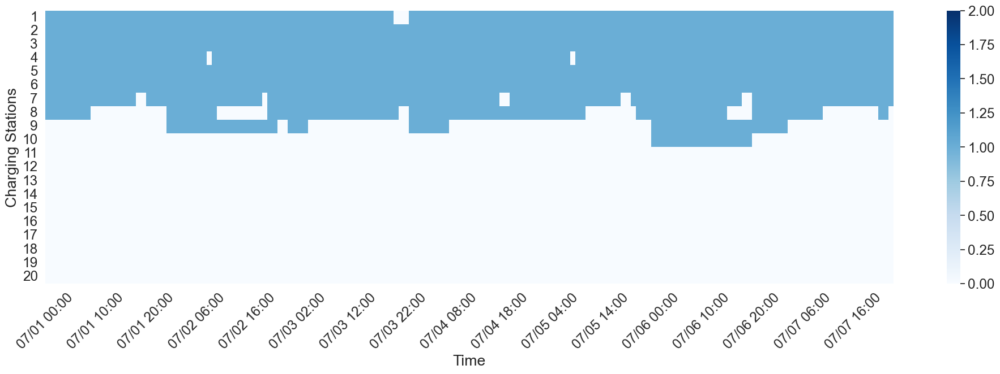

In [103]:
sns.set(rc={'figure.figsize':(20, 7)}, font_scale=1.6)
ax = sns.heatmap(LU_statistic_count, vmin=0, vmax=2, cmap="Blues")
x_name = list(LU_statistic_count.columns.strftime('%m/%d %H:00'))
# 設置刻度位置
ax.set_xticks(np.arange(0, len(x_name), 10))
ax.set_xticklabels(x_name[::10])
ax.set_yticklabels([i for i in range(1, 21)])
plt.xticks(np.arange(0, 168, step=10), rotation=45)
plt.yticks(rotation=0)
plt.xlabel("Time")
plt.ylabel("Charging Stations")
plt.tight_layout()
plt.show()

每個充電站在七天的電力總花費、總收益(電費扣除EV收益)

In [104]:
LU_statistic_df = pd.DataFrame([], columns=["locationID", "buildingID", "Total Electricity Cost", "Total Revenue"])

for locationID in LU_electricity_cost.keys():
    LU_statistic_df.loc[len(LU_statistic_df)] = [locationID, 
                                                 location.loc[locationID, "buildingID"],
                                                 LU_electricity_cost[locationID],
                                                 LU_revenue[locationID]]

LU_statistic_df.set_index("locationID", inplace=True)
LU_statistic_df

,buildingID,Total Electricity Cost,Total Revenue
locationID,,,
50230,0,163912.902667,-149062.902667
51199,1,132821.299282,-117701.299282
50841,2,250884.261740,-235764.261740
50692,3,117913.703852,-102973.703852
51087,4,128340.420230,-113220.420230
51198,5,142846.746735,-127726.746735
50840,6,121021.531832,-106711.531832
50349,7,260511.848693,-250251.848693
50909,8,143976.622659,-138486.622659


## Multiple: MISMF

### Result to dataframe

In [105]:
mf_df = pd.DataFrame([], columns=["datetime", "date", "userID", "locationID", "buildingID", "chargingLen", "originLocationID", "originChargingHour", "incentive", "score"])
testing_start_time = charging_start_time
null_value = 0

for day in range(7):
    
    charging_request = get_charging_request(charging_data, testing_start_time)
    # recommend = pd.read_csv(f"./Result/Schedule/MultipleStation/MF/0721/alpha_0.5/{testing_start_time.strftime('%m%d')}.csv")
    recommend = pd.read_csv(f"./Result/Baseline/MF/0721/alpha_0.5/{testing_start_time.strftime('%m%d')}.csv")
    recommend["datetime"] = pd.to_datetime(recommend["datetime"], format="%Y-%m-%d %H:%M:%S")
    
    for request in charging_request:
        try:
            schedule = recommend[recommend["requestID"] == request[0]]
            mf_df.loc[len(mf_df)] = [schedule["datetime"].values[0],
                                     testing_start_time.strftime("%m%d"),
                                     schedule["userID"].values[0],
                                     str(schedule["locationID"].values[0]),
                                     location.loc[str(schedule["locationID"].values[0]), "buildingID"],
                                     schedule["chargingLen"].values[0],
                                     schedule["originLocationID"].values[0],
                                     schedule["originHour"].values[0],
                                     schedule["incentive"].values[0],
                                     schedule["score"].values[0]]
        except Exception as e:
            print(request, e)
            null_value += 1

    testing_start_time += timedelta(days=1)
    
mf_df

[11912, '603475', 3.0, 17, '50692'] index 0 is out of bounds for axis 0 with size 0


,datetime,date,userID,locationID,buildingID,chargingLen,originLocationID,originChargingHour,incentive,score
0,2018-07-01 00:00:00,0701,606941,50266,10,3.0,51087,17,1,0.851610
1,2018-07-01 03:00:00,0701,604897H,51199,1,1.0,51200,16,1,0.835634
2,2018-07-01 22:00:00,0701,604760H,50692,3,1.0,50240,17,1,0.840126
3,2018-07-01 12:00:00,0701,V009198,50267,14,2.0,50911,17,1,0.273654
4,2018-07-01 12:00:00,0701,604725H,50909,8,2.0,50261,16,1,0.312726
...,...,...,...,...,...,...,...,...,...,...
747,2018-07-07 16:00:00,0707,604900H,50261,9,2.0,50266,12,0,0.269099
748,2018-07-07 16:00:00,0707,604804H,51199,1,2.0,50230,12,1,0.322468
749,2018-07-07 14:00:00,0707,604745H,51199,1,2.0,51199,12,1,0.280093
750,2018-07-07 16:00:00,0707,603522H,50268,19,2.0,50911,12,0,0.211647


### Evaluation

P.45 Station Profits \\


變數 -> 論文內的名稱 \\
-------------------------------------------------------- \\
基本電費(basic_tariff) -> Basic Tariff \\
流動電費(current_tariff) -> Current Tariff \\
超約罰金(overload_penalty) -> Overage Penalty \\
收益(mf_revenue) -> Revenue \\

In [122]:
overage = 0
electricity_price = pd.DataFrame([], columns=["basic_tariff", "current_tariff", "overload_penalty", "total"])
mf_statistic_count = pd.DataFrame([], columns=[charging_start_time + timedelta(hours=hour) for hour in range(0, 7*24)])
overload_percentage = list()
mf_ev_charging_volume = list()
mf_electricity_cost = defaultdict()
mf_revenue = defaultdict()

for cs in location.index:
    info = building_data[ (building_data["buildingID"] == location.loc[cs, "buildingID"]) &  (building_data["datetime"] >= building_start_time) & (building_data["datetime"] < building_end_time) ]

    ### EV charging data ###
    ev_info = [0 for i in range(24*7)]
    current = charging_start_time
    for day in range(7):
        for hour in range(24):
            charging_value = len(mf_df[(mf_df["locationID"] == cs) &
                                       (mf_df["datetime"] >= current) &
                                       (mf_df["datetime"] < (current + timedelta(days=1))) &
                                       (mf_df["datetime"].dt.hour <= hour) &
                                       ((mf_df['datetime'].dt.hour + mf_df["chargingLen"]) > hour)]) * charging_speed
            charging_value = location.loc[cs, "stationUpperElec"] if charging_value >= location.loc[cs, "stationUpperElec"] else charging_value

            ev_info[(day * 24) + hour] = charging_value
        current += timedelta(days=1)
    
    mf_ev_charging_volume.append(ev_info)
    info["charging"] = ev_info
    info["total"] = info["consumption"] - info["generation"] + info["charging"]

    ### check number of exceed ###
    info["exceed"] = info["total"] - location.loc[cs, "contractCapacity"]
    info["exceed"] = info["exceed"].apply(lambda x: 0 if x < 0 else x)

    overload_slots = 0
    for raw in info["exceed"]:
        if raw != 0:
            overload_slots += 1
        # overload_slots += math.ceil(raw / charging_speed)

    overload_percentage.append(overload_slots / (7* 24))
    print(int(location.loc[cs, 'buildingID']), ":")
    print(f"overload = {'{:.2f}'.format(info['exceed'].sum())}")
    print(f"overload_percentage = {'{:.4f}'.format(overload_percentage[-1])}")
    
    overage += info["exceed"].sum()
    basic_tariff, current_tariff, overload_penalty = calculate_electricity_price(location, cs, info)
    total_price = basic_tariff + current_tariff + overload_penalty
    electricity_price.loc[len(electricity_price)] = [basic_tariff, current_tariff, overload_penalty, total_price]
    mf_revenue[cs] = (-1) * total_price + (charging_fee * sum(ev_info))
    mf_electricity_cost[cs] = total_price
    print(f"revenue = {'{:.2f}'.format(mf_revenue[cs])}")

    # ### image ###
    # ax = plt.gca()

    # info.plot(kind='line', x='datetime',y='consumption', ax=ax, figsize=(20.5,8))
    # info.plot(kind='line', x='datetime',y='generation', color='red', ax=ax, figsize=(20.5,8))
    # info.plot(kind='line', x='datetime',y='charging', color='yellowgreen', ax=ax, figsize=(20.5,8))
    # info.plot(kind='line', x='datetime',y='total', color='darkviolet', ax=ax, figsize=(20.5,8), fontsize=18)
    # ax.axhline(y=location.loc[cs, "contractCapacity"], color="black")

    # # plt.title(f"BuildingID = {int(location.loc[cs, 'buildingID'])}", fontsize=20)
    # plt.xlabel("Time", fontsize=20)
    # plt.ylabel("Electricity (kW)", fontsize=20)
    # plt.legend(fontsize=18, loc="upper right")
    # # plt.savefig(f"./Result/Schedule/MultipleStation/Baseline/MF/Schedule_6/budget_3/{int(location.loc[cs, 'buildingID'])}.png", bbox_inches='tight')
    # plt.show()

    info["chargingCount"] = info["charging"].apply(lambda x: x/charging_speed)
    info.set_index("datetime", inplace=True)
    mf_statistic_count.loc[len(mf_statistic_count)] = info["chargingCount"].T

print("==========================")
print(f"total overage = {overage}")
print(f"average overage = {'{:.2f}'.format(overage/20)}")
print(f"average overload_percentage = {'{:.4f}'.format(sum(overload_percentage)/20)}")
print(f"overload_percentage = {overload_percentage}")
# print(f"revenue = {mf_revenue}")
print(f"average revenue = {int(sum(mf_revenue.values()) / 20)}")
print(electricity_price.mean(axis=0))

0 :
overload = 489.46
overload_percentage = 0.2143
revenue = -156127.90
1 :
overload = 252.22
overload_percentage = 0.2143
revenue = -122219.30
2 :
overload = 507.61
overload_percentage = 0.1667
revenue = -248375.17
3 :
overload = 45.17
overload_percentage = 0.0298
revenue = -105594.49
4 :
overload = 148.99
overload_percentage = 0.1488
revenue = -116115.03
5 :
overload = 163.10
overload_percentage = 0.1488
revenue = -130491.32
6 :
overload = 164.32
overload_percentage = 0.1488
revenue = -107462.76
7 :
overload = 804.41
overload_percentage = 0.2679
revenue = -254597.85
8 :
overload = 10.68
overload_percentage = 0.0179
revenue = -139425.42
9 :
overload = 0.00
overload_percentage = 0.0000
revenue = -182078.51
10 :
overload = 19.49
overload_percentage = 0.0417
revenue = -157946.02
11 :
overload = 56.39
overload_percentage = 0.0893
revenue = -87835.35
12 :
overload = 0.00
overload_percentage = 0.0000
revenue = -81668.45
13 :
overload = 0.00
overload_percentage = 0.0000
revenue = -126565.31


P.45 Load Balancing \\
平衡度(variation)

In [107]:
testing_start_time = charging_start_time
mf_utilization = defaultdict(list)
mf_var = list()
while testing_start_time < charging_end_time:
    for cs in range(20):
        truth_slots = truth_data.loc[(truth_data["datetime"] == testing_start_time) & (truth_data["buildingID"] == str(cs)), "parkingSlots"].values[0]
        
        days = (testing_start_time - charging_start_time).days
        seconds = (testing_start_time - charging_start_time).seconds
        mf_slots = mf_ev_charging_volume[cs][int(days * 24 + (seconds / 3600))] / charging_speed
        mf_utilization[testing_start_time].append(mf_slots / truth_slots if truth_slots != 0 else 1)

    mf_var.append(np.var(mf_utilization[testing_start_time]))
    testing_start_time += timedelta(hours=1)

mf_variation = sum(mf_var) / len(mf_var)
mf_variation

0.11074044793016412

P.45 Divergent Preferences \\

變數 -> 論文內的名稱 \\
-------------------------------------------------------- \\
unfavored_type -> Unfavored Ratio \\
time -> Moving Time \\
distance -> Moving distance

In [108]:
user_list = get_user_list(parser.parse("2018-07-01"))
history_charging_df = charging_data[charging_data["createdNew"] < parser.parse("2018-07-01")].copy()
history_charging_df["facilityType"] = history_charging_df["locationId"].apply(lambda x: location.loc[str(x), "FacilityType"])
history_charging_df["createdHour"] = history_charging_df["createdHour"].astype(int)

history_user_group = history_charging_df.groupby(["userId"])
user_preference = defaultdict(dict)

for user in user_list:
    ## 充電站選多個
    user_preference[user]["locationId"] = list()
    user_preference[user]["facilityType"] = list()
    user_preference[user]["createdHour"] = list()

    most_prefer_num = math.floor(len(history_user_group.get_group(user)) / 2)
    cs_charging_num = history_user_group.get_group(user).groupby("locationId").size()
    for cs in cs_charging_num.keys():
        if cs_charging_num[cs] >= most_prefer_num:
            user_preference[user]["locationId"].append(cs)
            user_preference[user]["facilityType"].append(location.loc[cs, "FacilityType"])
            user_preference[user]["createdHour"] += list(history_user_group.get_group(user).groupby("locationId").get_group(cs).groupby("createdHour").size().keys())
            user_preference[user]["createdHour"] = sorted(list(set(user_preference[user]["createdHour"])))
    ### 避免有人都沒有超過 50% 的
    if len(user_preference[user]["locationId"]) == 0:
        user_preference[user]["locationId"].append(cs_charging_num.sort_values(ascending=False).keys()[0])
        user_preference[user]["facilityType"].append(location.loc[user_preference[user]["locationId"][0], "FacilityType"])
        user_preference[user]["createdHour"] += list(history_user_group.get_group(user).groupby("locationId").get_group(user_preference[user]["locationId"][0]).groupby("createdHour").size().keys())
        user_preference[user]["createdHour"] = sorted(list(set(user_preference[user]["createdHour"])))

hit_type = 0
unfavored_type = 0
distance = 0
time = 0
for idx, raw in mf_df.iterrows():
    if location.loc[raw["locationID"], "FacilityType"] in user_preference[raw["userID"]]["facilityType"]:
        hit_type += 1
    if not location.loc[raw["locationID"], "FacilityType"] in user_preference[raw["userID"]]["facilityType"]:
        unfavored_type += 1
    
    min_distance = 1000
    for cs in user_preference[raw["userID"]]["locationId"]:
        value = haversine(location.loc[raw["locationID"], ["Latitude", "Longitude"]].values, location.loc[cs, ["Latitude", "Longitude"]].values, unit = Unit.KILOMETERS)
        min_distance = min(min_distance, value)
    distance += min_distance

    min_time = 1000
    for hour in user_preference[raw["userID"]]["createdHour"]:
        value = abs(raw["datetime"].hour - hour)
        min_time = min(min_time, value)
    time += min_time


print(f"average hit type: {hit_type / len(mf_df)}")
print(f"average unfavored type: {unfavored_type / len(mf_df)}")
print(f"average distance: {distance / len(mf_df)}")
print(f"average time: {time / len(mf_df)}")

average hit type: 0.24069148936170212
average unfavored type: 0.7593085106382979
average distance: 3.9166116245212677
average time: 1.7194148936170213


### Statistic

每個時間點每個充電站被分配到的車位數

In [109]:
mf_statistic_count

,2018-07-01 00:00:00,2018-07-01 01:00:00,2018-07-01 02:00:00,2018-07-01 03:00:00,2018-07-01 04:00:00,2018-07-01 05:00:00,2018-07-01 06:00:00,2018-07-01 07:00:00,2018-07-01 08:00:00,2018-07-01 09:00:00,...,2018-07-07 14:00:00,2018-07-07 15:00:00,2018-07-07 16:00:00,2018-07-07 17:00:00,2018-07-07 18:00:00,2018-07-07 19:00:00,2018-07-07 20:00:00,2018-07-07 21:00:00,2018-07-07 22:00:00,2018-07-07 23:00:00
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,2.0,2.0,2.0,4.0,2.0,1.0,0.0,1.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,4.0,3.0,2.0,2.0,3.0,3.0,1.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.0,3.0,4.0,1.0,3.0,2.0,1.0,0.0,0.0,0.0


<Axes: xlabel='Time', ylabel='Charging Stations'>

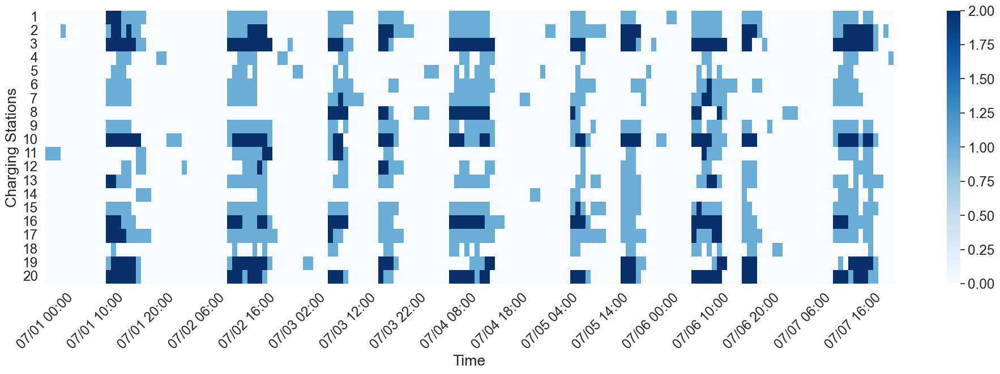

In [110]:
sns.set(rc={'figure.figsize':(20, 7)}, font_scale=1.6)
ax = sns.heatmap(mf_statistic_count, vmin=0, vmax=2, cmap="Blues")
x_name = list(mf_statistic_count.columns.strftime('%m/%d %H:00'))
# 設置刻度位置
ax.set_xticks(np.arange(0, len(x_name), 10))
ax.set_xticklabels(x_name[::10])
ax.set_yticklabels([i for i in range(1, 21)])
plt.xticks(np.arange(0, 168, step=10), rotation=45)
plt.yticks(rotation=0)
plt.xlabel("Time")
plt.ylabel("Charging Stations")
plt.tight_layout()
ax

每個充電站在七天的電力總花費、總收益(電費扣除EV收益)

In [111]:
mf_statistic_df = pd.DataFrame([], columns=["locationID", "buildingID", "Total Electricity Cost", "Total Revenue"])

for locationID in mf_electricity_cost.keys():
    mf_statistic_df.loc[len(mf_statistic_df)] = [locationID, 
                                                 location.loc[locationID, "buildingID"],
                                                 mf_electricity_cost[locationID],
                                                 mf_revenue[locationID]]

mf_statistic_df.set_index("locationID", inplace=True)
mf_statistic_df

,buildingID,Total Electricity Cost,Total Revenue
locationID,,,
50230,0,161707.902667,-156127.902667
51199,1,131939.299282,-122219.299282
50841,2,263855.172064,-248375.172064
50692,3,107844.493422,-105594.493422
51087,4,118635.032786,-116115.032786
51198,5,134811.321783,-130491.321783
50840,6,111782.760628,-107462.760628
50349,7,259637.848693,-254597.848693
50909,8,144015.422659,-139425.422659


# MISP

## Result to dataframe

In [112]:
schedule_df = pd.DataFrame([], columns=["datetime", "date", "userID", "locationID", "buildingID", "chargingLen", "originLocationID", "originChargingHour", "incentive", "score"])
testing_start_time = charging_start_time
null_value = 0

for day in range(7):
    charging_request = get_charging_request(charging_data, testing_start_time)
    # recommend = pd.read_csv(f"./Result/Schedule/MultipleStation/MISP/0719_expected_score_6/alpha_0.5/{testing_start_time.strftime('%m%d')}.csv")
    recommend = pd.read_csv(f"./Result/MISP/0719_expected_score_6/alpha_0.5/{testing_start_time.strftime('%m%d')}.csv")
    recommend["datetime"] = pd.to_datetime(recommend["datetime"], format="%Y-%m-%d %H:%M:%S")
    
    for request in charging_request:
        try:
            schedule = recommend[recommend["requestID"] == request[0]]
            schedule_df.loc[len(schedule_df)] = [schedule["datetime"].values[0],
                                                testing_start_time.strftime("%m%d"),
                                                schedule["userID"].values[0],
                                                str(schedule["locationID"].values[0]),
                                                location.loc[str(schedule["locationID"].values[0]), "buildingID"],
                                                schedule["chargingLen"].values[0],
                                                schedule["originLocationID"].values[0],
                                                schedule["originHour"].values[0],
                                                schedule["incentive"].values[0],
                                                schedule["score"].values[0]]
        except Exception as e:
            print(request, e)
            null_value += 1

    testing_start_time += timedelta(days=1)
    
schedule_df

[11912, '603475', 3.0, 17, '50692'] index 0 is out of bounds for axis 0 with size 0


,datetime,date,userID,locationID,buildingID,chargingLen,originLocationID,originChargingHour,incentive,score
0,2018-07-01 00:00:00,0701,606941,50268,19,3.0,51087,17,1,0.718592
1,2018-07-01 23:00:00,0701,604897H,50263,11,1.0,51200,16,1,0.883332
2,2018-07-01 22:00:00,0701,604760H,50268,19,1.0,50240,17,1,0.603736
3,2018-07-01 03:00:00,0701,V009198,50240,17,2.0,50911,17,0,0.500000
4,2018-07-01 12:00:00,0701,604725H,50675,18,2.0,50261,16,1,0.319088
...,...,...,...,...,...,...,...,...,...,...
747,2018-07-07 16:00:00,0707,604900H,50261,9,2.0,50266,12,1,0.453979
748,2018-07-07 15:00:00,0707,604804H,50261,9,2.0,50230,12,0,0.370212
749,2018-07-07 16:00:00,0707,604745H,50675,18,2.0,51199,12,1,0.350401
750,2018-07-07 19:00:00,0707,603522H,50261,9,2.0,50911,12,1,0.272273


## Evaluation

P.45 Station Profits \\


變數 -> 論文內的名稱 \\
-------------------------------------------------------- \\
基本電費(basic_tariff) -> Basic Tariff \\
流動電費(current_tariff) -> Current Tariff \\
超約罰金(overload_penalty) -> Overage Penalty \\
收益(schedule_revenue) -> Revenue \\

In [113]:
overage = 0
electricity_price = pd.DataFrame([], columns=["basic_tariff", "current_tariff", "overload_penalty", "total"])
schedule_statistic_count = pd.DataFrame([], columns=[charging_start_time + timedelta(hours=hour) for hour in range(0, 7*24)])
overload_percentage = list()
schedule_revenue = defaultdict()
schedule_ev_charging_volume = list()
schedule_electricity_cost = defaultdict() 
schedule_ev_revenue = defaultdict()

for cs in location.index:
    info = building_data[ (building_data["buildingID"] == location.loc[cs, "buildingID"]) &  (building_data["datetime"] >= building_start_time) & (building_data["datetime"] < building_end_time) ]

    ### EV charging data ###
    ev_info = [0 for i in range(24*7)]
    current = charging_start_time
    for day in range(7):
        for hour in range(24):
            charging_value = len(schedule_df[(schedule_df["locationID"] == cs) &
                                             (schedule_df["datetime"] >= current) &
                                             (schedule_df["datetime"] < (current + timedelta(days=1))) &
                                             (schedule_df["datetime"].dt.hour <= hour) &
                                             ((schedule_df['datetime'].dt.hour + schedule_df["chargingLen"]) > hour)]) * charging_speed
            ev_info[(day * 24) + hour] = charging_value
        current += timedelta(days=1)

    schedule_ev_charging_volume.append(ev_info)
    schedule_ev_revenue[cs] = sum(ev_info) * charging_fee
    info["charging"] = ev_info
    info["total"] = info["consumption"] - info["generation"] + info["charging"]

    ### check number of exceed ###
    info["exceed"] = info["total"] - location.loc[cs, "contractCapacity"]
    info["exceed"] = info["exceed"].apply(lambda x: 0 if x < 0 else x)

    overload_slots = 0
    for raw in info["exceed"]:
        if raw != 0:
            overload_slots += 1
        # overload_slots += math.ceil(raw / charging_speed)

    overload_percentage.append(overload_slots / (7* 24))
    print(int(location.loc[cs, 'buildingID']), ":")
    print(f"overload = {'{:.2f}'.format(info['exceed'].sum())}")
    print(f"overload_percentage = {'{:.4f}'.format(overload_percentage[-1])}")
    
    overage += info["exceed"].sum()
    basic_tariff, current_tariff, overload_penalty = calculate_electricity_price(location, cs, info)
    total_price = basic_tariff + current_tariff + overload_penalty
    electricity_price.loc[len(electricity_price)] = [basic_tariff, current_tariff, overload_penalty, total_price]
    schedule_revenue[cs] = (-1) * total_price + (charging_fee * info["charging"].sum())
    schedule_electricity_cost[cs] = total_price
    print(f"revenue = {'{:.2f}'.format(schedule_revenue[cs])}")

    ### image ###
    # ax = plt.gca()

    # info.plot(kind='line', x='datetime',y='consumption', ax=ax, figsize=(20.5,8))
    # info.plot(kind='line', x='datetime',y='generation', color='red', ax=ax, figsize=(20.5,8))
    # info.plot(kind='line', x='datetime',y='charging', color='yellowgreen', ax=ax, figsize=(20.5,8))
    # info.plot(kind='line', x='datetime',y='total', color='darkviolet', ax=ax, figsize=(20.5,8), fontsize=18)
    # ax.axhline(y=location.loc[cs, "contractCapacity"], color="black")

    # plt.title(f"BuildingID = {int(location.loc[cs, 'buildingID'])}", fontsize=20)
    # plt.xlabel("Time", fontsize=20)
    # plt.ylabel("Electricity (kW)", fontsize=20)
    # plt.legend(fontsize=18, loc="upper right")
    # # plt.savefig(f"./Result/Schedule/MultipleStation/Baseline/MF/Schedule_6/budget_3/{int(location.loc[cs, 'buildingID'])}.png", bbox_inches='tight')
    # plt.show()

    info["chargingCount"] = info["charging"].apply(lambda x: x/charging_speed)
    info.set_index("datetime", inplace=True)
    schedule_statistic_count.loc[len(schedule_statistic_count)] = info["chargingCount"].T

print("==========================")
# print(f"total overage = {overage}")
# print(f"average overage = {'{:.2f}'.format(overage/20)}")
# print(f"average overload_percentage = {'{:.5f}'.format(sum(overload_percentage)/20)}")
# print(f"overload_percentage = {overload_percentage}")
# print(f"revenue = {schedule_revenue}")
print(f"average revenue = {int(sum(schedule_revenue.values()) / 20)}")
print(electricity_price.mean(axis=0))

0 :
overload = 520.36
overload_percentage = 0.2083
revenue = -156131.70
1 :
overload = 240.33
overload_percentage = 0.1905
revenue = -123763.50
2 :
overload = 496.82
overload_percentage = 0.1964
revenue = -242875.72
3 :
overload = 45.17
overload_percentage = 0.0298
revenue = -105558.29
4 :
overload = 148.99
overload_percentage = 0.1488
revenue = -116492.03
5 :
overload = 140.95
overload_percentage = 0.1369
revenue = -130957.32
6 :
overload = 164.32
overload_percentage = 0.1488
revenue = -107682.16
7 :
overload = 774.83
overload_percentage = 0.2619
revenue = -255142.25
8 :
overload = 14.81
overload_percentage = 0.0298
revenue = -138605.82
9 :
overload = 0.00
overload_percentage = 0.0000
revenue = -182638.71
10 :
overload = 22.56
overload_percentage = 0.0476
revenue = -157848.02
11 :
overload = 56.39
overload_percentage = 0.0893
revenue = -88054.75
12 :
overload = 0.86
overload_percentage = 0.0060
revenue = -81448.42
13 :
overload = 5.06
overload_percentage = 0.0179
revenue = -123805.63


P.45 Load Balancing \\
平衡度(variation)

In [114]:
testing_start_time = charging_start_time
schedule_utilization = defaultdict(list)
schedule_var = list()
while testing_start_time < charging_end_time:
    for cs in range(20):
        truth_slots = truth_data.loc[(truth_data["datetime"] == testing_start_time) & (truth_data["buildingID"] == str(cs)), "parkingSlots"].values[0]
        
        days = (testing_start_time - charging_start_time).days
        seconds = (testing_start_time - charging_start_time).seconds
        schedule_slots = schedule_ev_charging_volume[cs][int(days * 24 + (seconds / 3600))] / charging_speed
        schedule_utilization[testing_start_time].append(schedule_slots / truth_slots if truth_slots != 0 else 1)
        

    schedule_var.append(np.var(schedule_utilization[testing_start_time]))
    testing_start_time += timedelta(hours=1)

schedule_variation = sum(schedule_var) / len(schedule_var)
schedule_variation

0.10771186183950544

P.45 Divergent Preferences \\

變數 -> 論文內的名稱 \\
-------------------------------------------------------- \\
unfavored_type -> Unfavored Ratio \\
time -> Moving Time \\
distance -> Moving distance

In [115]:
user_list = get_user_list(parser.parse("2018-07-01"))
history_charging_df = charging_data[charging_data["createdNew"] < parser.parse("2018-07-01")].copy()
history_charging_df["facilityType"] = history_charging_df["locationId"].apply(lambda x: location.loc[str(x), "FacilityType"])
history_charging_df["createdHour"] = history_charging_df["createdHour"].astype(int)

history_user_group = history_charging_df.groupby(["userId"])
user_preference = defaultdict(dict)

for user in user_list:
    ## 充電站選多個
    user_preference[user]["locationId"] = list()
    user_preference[user]["facilityType"] = list()
    user_preference[user]["createdHour"] = list()

    most_prefer_num = math.floor(len(history_user_group.get_group(user)) / 2)
    cs_charging_num = history_user_group.get_group(user).groupby("locationId").size()
    for cs in cs_charging_num.keys():
        if cs_charging_num[cs] >= most_prefer_num:
            user_preference[user]["locationId"].append(cs)
            user_preference[user]["facilityType"].append(location.loc[cs, "FacilityType"])
            user_preference[user]["createdHour"] += list(history_user_group.get_group(user).groupby("locationId").get_group(cs).groupby("createdHour").size().keys())
            user_preference[user]["createdHour"] = sorted(list(set(user_preference[user]["createdHour"])))
    ### 避免有人都沒有超過 50% 的
    if len(user_preference[user]["locationId"]) == 0:
        user_preference[user]["locationId"].append(cs_charging_num.sort_values(ascending=False).keys()[0])
        user_preference[user]["facilityType"].append(location.loc[user_preference[user]["locationId"][0], "FacilityType"])
        user_preference[user]["createdHour"] += list(history_user_group.get_group(user).groupby("locationId").get_group(user_preference[user]["locationId"][0]).groupby("createdHour").size().keys())
        user_preference[user]["createdHour"] = sorted(list(set(user_preference[user]["createdHour"])))

 
    ## 時間以選中的充電站為主
    # user_preference[user]["locationId"] = history_user_group.get_group(user).groupby("locationId").size().sort_values(ascending=False).keys()[0]
    # user_preference[user]["facilityType"] = int(location.loc[user_preference[user]["locationId"], "FacilityType"])
    # user_preference[user]["createdHour"] = history_user_group.get_group(user).groupby("locationId").get_group(user_preference[user]["locationId"]).groupby("createdHour").size().sort_values(ascending=False).keys()[0]

    ## 時間以最多次的為主
    # user_preference[user]["facilityType"] = history_user_group.get_group(user).groupby("facilityType").size().sort_values(ascending=False).keys()[0]
    # user_preference[user]["createdHour"] = history_user_group.get_group(user).groupby("createdHour").size().sort_values(ascending=False).keys()[0]
    # user_preference[user]["locationId"] = history_user_group.get_group(user).groupby("locationId").size().sort_values(ascending=False).keys()[0]

user_preference

defaultdict(dict,
            {'506530': {'locationId': ['50909'],
              'facilityType': [4],
              'createdHour': [1, 12, 13, 14, 15, 17, 19, 21]},
             '513577': {'locationId': ['50349'],
              'facilityType': [3],
              'createdHour': [0, 2, 3, 22]},
             '515623': {'locationId': ['50349', '50911'],
              'facilityType': [3, 1],
              'createdHour': [0, 4, 16, 17, 19, 20, 21]},
             '516399': {'locationId': ['51087'],
              'facilityType': [1],
              'createdHour': [9, 13, 14, 15]},
             '517846': {'locationId': ['50269'],
              'facilityType': [2],
              'createdHour': [2, 3, 4, 5, 6, 13, 14, 15, 20, 21]},
             '517866': {'locationId': ['50911'],
              'facilityType': [1],
              'createdHour': [9, 16, 20, 21, 22]},
             '518009': {'locationId': ['50911'],
              'facilityType': [1],
              'createdHour': [0, 1, 3, 13, 18, 19, 

In [116]:
unfavored_type = 0
hit_type = 0
distance = 0
time = 0
for idx, raw in schedule_df.iterrows():
    if location.loc[raw["locationID"], "FacilityType"] in user_preference[raw["userID"]]["facilityType"]:
        hit_type += 1
    if not location.loc[raw["locationID"], "FacilityType"] in user_preference[raw["userID"]]["facilityType"]:
        unfavored_type += 1
    
    min_distance = 1000
    for cs in user_preference[raw["userID"]]["locationId"]:
        value = haversine(location.loc[raw["locationID"], ["Latitude", "Longitude"]].values, location.loc[cs, ["Latitude", "Longitude"]].values, unit = Unit.KILOMETERS)
        min_distance = min(min_distance, value)
    distance += min_distance

    min_time = 1000
    for hour in user_preference[raw["userID"]]["createdHour"]:
        value = abs(raw["datetime"].hour - hour)
        min_time = min(min_time, value)
    time += min_time
    
print(f"average hit type: {hit_type / len(schedule_df)}")
print(f"average unfavored type: {unfavored_type / len(schedule_df)}")
print(f"average distance: {distance / len(schedule_df)}")
print(f"average time: {time / len(schedule_df)}")

average hit type: 0.363031914893617
average unfavored type: 0.636968085106383
average distance: 3.31418772578281
average time: 1.5013297872340425


In [118]:
schedule_statistic_count

,2018-07-01 00:00:00,2018-07-01 01:00:00,2018-07-01 02:00:00,2018-07-01 03:00:00,2018-07-01 04:00:00,2018-07-01 05:00:00,2018-07-01 06:00:00,2018-07-01 07:00:00,2018-07-01 08:00:00,2018-07-01 09:00:00,...,2018-07-07 14:00:00,2018-07-07 15:00:00,2018-07-07 16:00:00,2018-07-07 17:00:00,2018-07-07 18:00:00,2018-07-07 19:00:00,2018-07-07 20:00:00,2018-07-07 21:00:00,2018-07-07 22:00:00,2018-07-07 23:00:00
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,1.0,1.0,0.0,3.0,2.0,2.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,4.0,3.0,2.0,1.0,2.0,2.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0
9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,3.0,4.0,2.0,3.0,2.0,1.0,0.0,0.0,0.0


<Axes: xlabel='Time', ylabel='Charging Stations'>

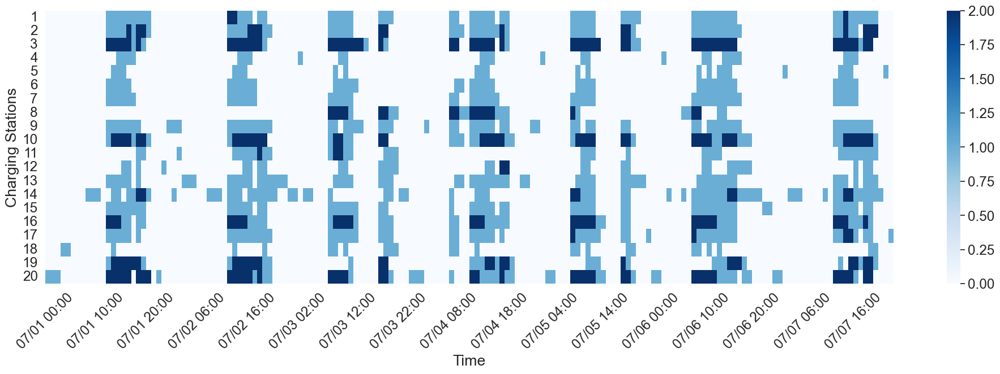

In [119]:
sns.set(rc={'figure.figsize':(20, 7)}, font_scale=1.6)
ax = sns.heatmap(schedule_statistic_count, vmin=0, vmax=2, cmap="Blues")
x_name = list(schedule_statistic_count.columns.strftime('%m/%d %H:00'))
# 設置刻度位置
ax.set_xticks(np.arange(0, len(x_name), 10))
ax.set_xticklabels(x_name[::10])
ax.set_yticklabels([i for i in range(1, 21)])
plt.xticks(np.arange(0, 168, step=10), rotation=45)
plt.yticks(rotation=0)
plt.xlabel("Time")
plt.ylabel("Charging Stations")
plt.tight_layout()
ax

每個充電站在七天的電力總花費、總收益(電費扣除EV收益)

In [121]:
misp_statistic_df = pd.DataFrame([], columns=["locationID", "buildingID", "Total Electricity Cost", "Total Revenue"])

for locationID in schedule_electricity_cost.keys():
    misp_statistic_df.loc[len(misp_statistic_df)] = [locationID, 
                                                 location.loc[locationID, "buildingID"],
                                                 schedule_electricity_cost[locationID],
                                                 schedule_ev_revenue[locationID]]

misp_statistic_df.set_index("locationID", inplace=True)
misp_statistic_df

,buildingID,Total Electricity Cost,Total Revenue
locationID,,,
50230,0,161801.702667,0
51199,1,131233.499282,0
50841,2,257815.717156,0
50692,3,107898.293422,0
51087,4,118562.032786,0
51198,5,134557.321783,0
50840,6,111732.160628,0
50349,7,259462.248693,0
50909,8,144275.822659,0


## Random
在模擬使用者選項時 random 的結果讀取 (後來沒用)

In [117]:
random_counter = 50
electricity_price = pd.DataFrame([], columns=["basic_tariff", "current_tariff", "overload_penalty", "total"])
schedule_revenue = defaultdict(lambda:0)
electricity_cost = defaultdict(lambda:0) 
schedule_ev_revenue = defaultdict(lambda:0)
average_incentive = 0

average_unfavored_type = 0
average_hit_type = 0
average_distance = 0
average_time = 0

average_variation = 0

for counter in range(random_counter):
    schedule_df = pd.DataFrame([], columns=["datetime", "date", "userID", "locationID", "buildingID", "chargingLen", "originLocationID", "originChargingHour", "incentive", "score"])
    testing_start_time = charging_start_time

    for day in range(7):
        charging_request = get_charging_request(charging_data, testing_start_time)
        # recommend = pd.read_csv(f"./Result/Schedule/MultipleStation/MISP/0719_expected_score_6/alpha_0.5/{testing_start_time.strftime('%m%d')}.csv")
        
        recommend = pd.read_csv(f"./Result/Schedule/MultipleStation/MISP/0819_CP_old_relation_random_0.8_blacklist/{counter + 1}/{testing_start_time.strftime('%m%d')}.csv")
        recommend["datetime"] = pd.to_datetime(recommend["datetime"], format="%Y-%m-%d %H:%M:%S")
        
        for request in charging_request:
            try:
                schedule = recommend[recommend["requestID"] == request[0]]
                schedule_df.loc[len(schedule_df)] = [schedule["datetime"].values[0],
                                                    testing_start_time.strftime("%m%d"),
                                                    schedule["userID"].values[0],
                                                    str(schedule["locationID"].values[0]),
                                                    location.loc[str(schedule["locationID"].values[0]), "buildingID"],
                                                    schedule["chargingLen"].values[0],
                                                    schedule["originLocationID"].values[0],
                                                    schedule["originHour"].values[0],
                                                    schedule["incentive"].values[0],
                                                    schedule["score"].values[0]]
            except Exception as e:
                print(request, e)

        testing_start_time += timedelta(days=1)

    # 計算 incentive 數量
    # print(schedule_df["incentive"].sum())
    print("incentive = ", (schedule_df["incentive"].sum() * 10) / 20)
    average_incentive += ((schedule_df["incentive"].sum() * 10) / 20)
    
    # 計算電費
    # schedule_statistic_count = pd.DataFrame([], columns=[charging_start_time + timedelta(hours=hour) for hour in range(0, 7*24)])
    schedule_ev_charging_volume = list()

    for cs in location.index:
        info = building_data[ (building_data["buildingID"] == location.loc[cs, "buildingID"]) &  (building_data["datetime"] >= building_start_time) & (building_data["datetime"] < building_end_time) ]

        ### EV charging data ###
        ev_info = [0 for i in range(24*7)]
        current = charging_start_time
        for day in range(7):
            for hour in range(24):
                charging_value = len(schedule_df[(schedule_df["locationID"] == cs) &
                                                (schedule_df["datetime"] >= current) &
                                                (schedule_df["datetime"] < (current + timedelta(days=1))) &
                                                (schedule_df["datetime"].dt.hour <= hour) &
                                                ((schedule_df['datetime'].dt.hour + schedule_df["chargingLen"]) > hour)]) * charging_speed
                ev_info[(day * 24) + hour] = charging_value
            current += timedelta(days=1)

        schedule_ev_charging_volume.append(ev_info)
        schedule_ev_revenue[cs] += (sum(ev_info) * charging_fee)
        info["charging"] = ev_info
        info["total"] = info["consumption"] - info["generation"] + info["charging"]

        ### check number of exceed ###
        info["exceed"] = info["total"] - location.loc[cs, "contractCapacity"]
        info["exceed"] = info["exceed"].apply(lambda x: 0 if x < 0 else x)

        # overload_slots = 0
        # for raw in info["exceed"]:
        #     if raw != 0:
        #         overload_slots += 1
                
        # overload_percentage.append(overload_slots / (7* 24))
        # print(int(location.loc[cs, 'buildingID']), ":")
        # print(f"overload = {'{:.2f}'.format(info['exceed'].sum())}")
        # print(f"overload_percentage = {'{:.4f}'.format(overload_percentage[-1])}")
        
        basic_tariff, current_tariff, overload_penalty = calculate_electricity_price(location, cs, info)
        total_price = basic_tariff + current_tariff + overload_penalty
        electricity_price.loc[len(electricity_price)] = [basic_tariff, current_tariff, overload_penalty, total_price]
        # 看要不要加 incentive 上來
        schedule_revenue[cs] += ((-1) * total_price + (charging_fee * info["charging"].sum()))
        electricity_cost[cs] += total_price
        # print((-1) * total_price, ":", charging_fee * info["charging"].sum())
        # print(f"revenue = {'{:.2f}'.format(schedule_revenue[cs])}")

        # info["chargingCount"] = info["charging"].apply(lambda x: x/charging_speed)
        # info.set_index("datetime", inplace=True)
        # schedule_statistic_count.loc[len(schedule_statistic_count)] = info["chargingCount"].T

    # 計算個人偏好度
    unfavored_type = 0
    hit_type = 0
    distance = 0
    time = 0
    for idx, raw in schedule_df.iterrows():
        if location.loc[raw["locationID"], "FacilityType"] in user_preference[raw["userID"]]["facilityType"]:
            hit_type += 1
        if not location.loc[raw["locationID"], "FacilityType"] in user_preference[raw["userID"]]["facilityType"]:
            unfavored_type += 1
        
        min_distance = 1000
        for cs in user_preference[raw["userID"]]["locationId"]:
            value = haversine(location.loc[raw["locationID"], ["Latitude", "Longitude"]].values, location.loc[cs, ["Latitude", "Longitude"]].values, unit = Unit.KILOMETERS)
            min_distance = min(min_distance, value)
        distance += min_distance

        min_time = 1000
        for hour in user_preference[raw["userID"]]["createdHour"]:
            value = abs(raw["datetime"].hour - hour)
            min_time = min(min_time, value)
        time += min_time

    average_unfavored_type += (unfavored_type / len(schedule_df))
    average_hit_type += (hit_type / len(schedule_df))
    average_distance += (distance / len(schedule_df))
    average_time += (time / len(schedule_df))
    print("unfavored: ", (unfavored_type / len(schedule_df)))
    print("time: ", (time / len(schedule_df)))
    print("distance: ", (distance / len(schedule_df)))

    # 計算平衡度
    testing_start_time = charging_start_time
    schedule_utilization = defaultdict(list)
    schedule_variation = list()
    while testing_start_time < charging_end_time:
        for cs in range(20):
            truth_slots = truth_data.loc[(truth_data["datetime"] == testing_start_time) & (truth_data["buildingID"] == str(cs)), "parkingSlots"].values[0]
            
            days = (testing_start_time - charging_start_time).days
            seconds = (testing_start_time - charging_start_time).seconds
            schedule_slots = schedule_ev_charging_volume[cs][int(days * 24 + (seconds / 3600))] / charging_speed
            schedule_utilization[testing_start_time].append(schedule_slots / truth_slots if truth_slots != 0 else 1)

        schedule_variation.append(np.var(schedule_utilization[testing_start_time]))
        testing_start_time += timedelta(hours=1)

    # utilization
    average_variation += (sum(schedule_variation) / len(schedule_variation))


    print(f"=========================={counter}==========================")

print("average revenue: ", int(sum(schedule_revenue.values()) / (20 * random_counter)))
print("electricity: ", electricity_price.mean(axis=0))   
for cs in location.index:
    print(location.loc[cs, "buildingID"], " ev revenue: ", schedule_ev_revenue[cs] / random_counter)
print("average incentive: ", average_incentive / random_counter)
print("======divergent======")
print("average unfavored ratio: ", average_unfavored_type / random_counter)
print("average time: ", average_time / random_counter)
print("average distance: ", average_distance / random_counter)
print("======variation======")
print("average utilization: ", average_variation / random_counter)


FileNotFoundError: [Errno 2] No such file or directory: './Result/Schedule/MultipleStation/MISP/0819_CP_old_relation_random_0.8_blacklist/1/0701.csv'

# 圖片輸出
P.48 & P.49

0 total revenue: 1789.3999999999942
ev earning: 2790.0
unschedule_ev_earning: 3150.0
1 total revenue: 11389.712974027585
ev earning: 2700.0
unschedule_ev_earning: 5580.0
2 total revenue: -4424.635704247223
ev earning: 11430.0
unschedule_ev_earning: 3600.0
3 total revenue: 9519.21043050001
ev earning: -6210.0
unschedule_ev_earning: 8010.0
4 total revenue: 11186.628850418201
ev earning: -6750.0
unschedule_ev_earning: 8550.0
5 total revenue: 5269.100227523042
ev earning: -900.0
unschedule_ev_earning: 4680.0
6 total revenue: 2220.5999999999913
ev earning: 3330.0
unschedule_ev_earning: 180.0
7 total revenue: 4705.7678769001795
ev earning: -4680.0
unschedule_ev_earning: 8910.0
8 total revenue: -155.9999999999709
ev earning: 0.0
unschedule_ev_earning: 5040.0
9 total revenue: 6338.8000000000175
ev earning: 9180.0
unschedule_ev_earning: 2250.0
10 total revenue: 309.45098307260196
ev earning: 630.0
unschedule_ev_earning: 3510.0
11 total revenue: 16225.793177754647
ev earning: -720.0
unschedule_e

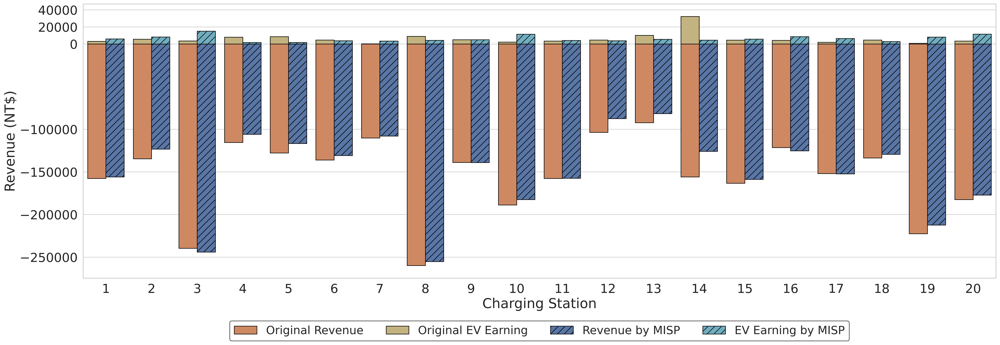

In [ ]:
import itertools
sns.set(rc={'figure.figsize':(25, 9), "figure.dpi":400, 'savefig.dpi':400}, font_scale=2)
sns.set_style('whitegrid')

unschedule_info = pd.DataFrame([], columns=["Charging Station", "Original Revenue", "Original EV Earning"])#.assign(Method="Unschedule")
schedule_info = pd.DataFrame([], columns=["Charging Station", "Revenue by MISP", "EV Earning by MISP"])
for item in location.index:
    unschedule_info.loc[len(unschedule_info)] = [int(location.loc[item, "buildingID"])+1, unschedule_revenue[item], unschedule_ev_revenue[item]]
    schedule_info.loc[len(schedule_info)] = [int(location.loc[item, "buildingID"])+1, schedule_revenue[item], schedule_ev_revenue[item]]


# unschedule_df = unschedule_df.assign(Method="Unschedule")
unschedule_info = pd.melt(unschedule_info, id_vars=["Charging Station"], var_name=['Var'])
schedule_info = pd.melt(schedule_info, id_vars=["Charging Station"], var_name=['Var'])

color = sns.color_palette("deep", 10)
ax1 = sns.barplot(x="Charging Station", y="value", hue="Var", data=unschedule_info, errwidth=0, edgecolor='black', linewidth=1, palette=[color[1], color[-2]])
ax2 = sns.barplot(x="Charging Station", y="value", hue="Var", data=schedule_info, errwidth=0, edgecolor='black', linewidth=1, palette=[color[0], color[-1]])

hatches = itertools.cycle(['//'])#, '\\', '+', '-', 'x', '\\', '*', 'o', 'O', '.'])
for i, bar in enumerate(ax2.patches):
    if 20 <= i < 40:
        bar.set_x(bar.xy[0] - 0.4)
    elif 40 <= i < 60:
        bar.set_x(bar.xy[0] + 0.4)
    if i >= 40:
        hatch = next(hatches)
        bar.set_hatch(hatch)


plt.yticks([-250000, -200000, -150000, -100000, 0, 20000, 40000])#, [-250000, -200000, -150000, -100000, 0, "", 20000, "", 40000])
plt.xticks(range(0, 20), range(1, 21))
plt.ylabel("Revenue (NT$)")

for cs in range(20):
    unschedule_total_revenue = unschedule_info.loc[(unschedule_info["Charging Station"] == (cs + 1)) & (unschedule_info["Var"] == "Original Revenue"), "value"].values[0]
    schedule_total_revenue = schedule_info.loc[(schedule_info["Charging Station"] == (cs + 1)) & (schedule_info["Var"] == "Revenue by MISP"), "value"].values[0] 
    # print(cs, "total revenue:", schedule_total_revenue - unschedule_total_revenue )
    # plt.text(cs-0.5, min(unschedule_total_revenue, schedule_total_revenue)-15000, "{:.1f}%".format((unschedule_total_revenue - schedule_total_revenue) / unschedule_total_revenue * 100), fontsize=15)

    unschedule_ev_earning = unschedule_info.loc[(unschedule_info["Charging Station"] == (cs + 1)) & (unschedule_info["Var"] == "Original EV Earning"), "value"].values[0]
    schedule_ev_earning = schedule_info.loc[(schedule_info["Charging Station"] == (cs + 1)) & (schedule_info["Var"] == "EV Earning by MISP"), "value"].values[0] 
    # print(cs, "ev earning:", schedule_ev_earning - unschedule_ev_earning )
    # plt.text(cs-0.2, max(unschedule_ev_earning, schedule_ev_earning)+5000, "{:.1f}%".format((schedule_ev_earning - unschedule_ev_earning) / unschedule_ev_earning * 100), fontsize=15)

    # if (schedule_ev_earning - unschedule_ev_earning) > 0:
    print(cs, "total revenue:", schedule_total_revenue - unschedule_total_revenue)
    print("ev earning:", schedule_ev_earning - unschedule_ev_earning)
    print("unschedule_ev_earning:", unschedule_ev_earning)
    if (unschedule_ev_earning > schedule_ev_earning) and ( (schedule_total_revenue - unschedule_total_revenue) < (unschedule_ev_earning - schedule_ev_earning)):
        print(cs, "這個不好", unschedule_ev_earning - schedule_ev_earning, schedule_total_revenue - unschedule_total_revenue )
# hatches = itertools.cycle(['//'])#, '/', '+', '-', 'x', '\\', '*', 'o', 'O', '.'])
# for i, bar in enumerate(ax1.patches):
#     hatch = next(hatches)
#     bar.set_hatch(hatch)



plt.legend(loc='lower center', bbox_to_anchor=(0.5, -0.25), ncol=4, fancybox=True, edgecolor="black", fontsize=20)
plt.tight_layout()
# plt.savefig("./Image/station_profits.png", transparent=True)

# LSTM

## 計算準確度

用電量看

In [62]:
predict_df = pd.read_csv("./Result/LSTM/0702_four_layer/predict_building_data.csv", index_col=0) 
predict_df["datetime"] = pd.to_datetime(predict_df["datetime"], format="%Y-%m-%d %H:%M:%S")

In [63]:
predict_df

,datetime,buildingID,consumption,generation
0,2018-07-01 00:00:00,0,124.381676,0.000000
1,2018-07-01 01:00:00,0,121.722260,0.020808
2,2018-07-01 02:00:00,0,116.850555,0.000744
3,2018-07-01 03:00:00,0,126.981900,0.010088
4,2018-07-01 04:00:00,0,128.711600,0.014495
...,...,...,...,...
3355,2018-07-07 19:00:00,19,286.036320,3.355547
3356,2018-07-07 20:00:00,19,277.494140,1.657538
3357,2018-07-07 21:00:00,19,272.880430,0.418973
3358,2018-07-07 22:00:00,19,263.811650,0.226713


Consumption:
0 , rmse: 412.2254141787259
0 , mae: 15.961859184523812
0 , r2: 0.7655167516480755
Generation:
0 , rmse: 0.13289131914865882
0 , mae: 0.20823373468440481
0 , r2: 0.9237168182791778
Consumption:
1 , rmse: 319.310082501623
1 , mae: 15.602056410714287
1 , r2: 0.7083942016479854
Generation:
1 , rmse: 0.7238392063598935
1 , mae: 0.4670660202613095
1 , r2: 0.8680333579938188
Consumption:
2 , rmse: 1474.494875119103
2 , mae: 31.715956808907645
2 , r2: 0.6848208282637914
Generation:
2 , rmse: 1.3546876368843428
2 , mae: 0.6207244945592529
2 , r2: 0.8124351797557796
Consumption:
3 , rmse: 65.68261285886464
3 , mae: 6.2575357738095265
3 , r2: 0.8363323398325941
Generation:
3 , rmse: 0.13703365940336432
3 , mae: 0.22342348991036906
3 , r2: 0.9638775859258696
Consumption:
4 , rmse: 179.69940364188903
4 , mae: 12.269399398809522
4 , r2: 0.5434519812642115
Generation:
4 , rmse: 0.24502240742499423
4 , mae: 0.30556167803571427
4 , r2: 0.9280437835305855
Consumption:
5 , rmse: 180.1909315

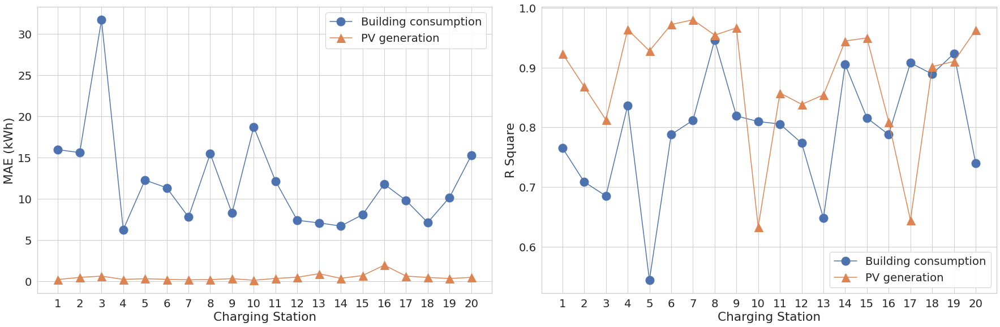

In [65]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

elec_predict_df = pd.read_csv("./Result/LSTM/predict_building_data.csv", index_col=0)
elec_predict_df["datetime"] = pd.to_datetime(elec_predict_df["datetime"], format="%Y-%m-%d %H:%M:%S")
elec_predict_df["buildingID"] = elec_predict_df["buildingID"].astype(str)
con_rmse, con_mae, con_r2, gen_rmse, gen_mae, gen_r2 = list(), list(), list(), list(), list(), list()

for buildingID in range(20):
    testing_start_time = parser.parse("2018-07-01")
    testing_end_time = parser.parse("2018-07-08")

    building_true = building_data.loc[(building_data["buildingID"] == str(buildingID)) &
                                      (building_data["datetime"] >= testing_start_time) &
                                      (building_data["datetime"] < testing_end_time)]
    building_predict = elec_predict_df.loc[(elec_predict_df["buildingID"] == str(buildingID)) &
                                           (elec_predict_df["datetime"] >= testing_start_time) &
                                           (elec_predict_df["datetime"] < testing_end_time)]
                                           
    con_true = building_true.loc[:, "consumption"].values.tolist()
    gen_true = building_true.loc[:, "generation"].values.tolist()
    con_predict = building_predict.loc[:, "consumption"].values.tolist()
    gen_predict = building_predict.loc[:, "generation"].values.tolist()

    # plt.plot(gen_true)
    # plt.plot(gen_predict)
    # plt.show()

    print("Consumption:")
    con_rmse.append(mean_squared_error(con_true, con_predict, squared=True))
    con_mae.append(mean_absolute_error(con_true, con_predict))
    con_r2.append(r2_score(con_true, con_predict))
    print(buildingID, ", rmse:", mean_squared_error(con_true, con_predict, squared=True))
    print(buildingID, ", mae:", mean_absolute_error(con_true, con_predict))
    print(buildingID, ", r2:", r2_score(con_true, con_predict))

    print("Generation:")
    gen_rmse.append(mean_squared_error(gen_true, gen_predict, squared=True))
    gen_mae.append(mean_absolute_error(gen_true, gen_predict))
    gen_r2.append(r2_score(gen_true, gen_predict))
    print(buildingID, ", rmse:", mean_squared_error(gen_true, gen_predict, squared=True))
    print(buildingID, ", mae:", mean_absolute_error(gen_true, gen_predict))
    print(buildingID, ", r2:", r2_score(gen_true, gen_predict))


print("====Consumption====")
print(sum(con_rmse) / 20)
print(sum(con_mae) / 20)
print(sum(con_r2) / 20)
print("====Generation====")
print(sum(gen_rmse) / 20)
print(sum(gen_mae) / 20)
print(sum(gen_r2) / 20)


sns.set(rc={'figure.figsize':(25, 8.5)}, font_scale=1.8)
sns.set_style('whitegrid')
con_color, gen_color = sns.color_palette("deep", n_colors=2)
#pseudo-value
# con_mae.insert(0, 0)
# gen_mae.insert(0, 0)
# con_r2.insert(0, 0)
# gen_r2.insert(0, 0)


fig, axes = plt.subplots(1, 2)
axes[0].plot(con_mae, marker="o", markersize=15, color=con_color, label="Building consumption")
axes[0].plot(gen_mae, marker="^", markersize=15, color=gen_color, label="PV generation")
axes[0].set_xticks(range(20))
axes[0].set_xticklabels([i for i in range(1, 21)])
axes[0].set_xlabel("Charging Station")
axes[0].set_ylabel("MAE (kWh)")
axes[0].legend(framealpha=0.9)

axes[1].plot(con_r2, marker="o", markersize=15, color=con_color, label="Building consumption")
axes[1].plot(gen_r2, marker="^", markersize=15, color=gen_color, label="PV generation")
axes[1].set_xticks(range(20))
axes[1].set_xticklabels([i for i in range(1, 21)])
axes[1].set_xlabel("Charging Station")
axes[1].set_ylabel("R Square")
axes[1].legend(framealpha=0.9)

fig.tight_layout()
plt.savefig("./Image/LSTM_accuracy.png", transparent=True)
plt.show()

# plt.plot(con_mae, marker="o", markersize=13, color=con_color, label="Building consumption")
# plt.plot(gen_mae, marker="^", markersize=13, color=gen_color, label="PV generation")
# # plt.xlim(0, 20.5)
# plt.xticks(range(20), [i for i in range(1, 21)])
# plt.xlabel("Charging Station")
# plt.ylabel("MAE (kWh)")
# plt.legend(framealpha=0.9)
# plt.tight_layout()
# plt.savefig("./Image/LSTM_accuracy_MAE.png")
# plt.show()

# plt.plot(con_r2, marker="o", markersize=13, color=con_color, label="Building consumption")
# plt.plot(gen_r2, marker="^", markersize=13, color=gen_color, label="PV generation")
# # plt.xlim(0, 20.5)
# plt.xticks(range(20), [i for i in range(1, 21)])
# plt.xlabel("Charging Station")
# plt.ylabel("R Square")
# plt.legend(framealpha=0.9)
# plt.tight_layout()
# plt.savefig("./Image/LSTM_accuracy_R_Square.png")
# plt.show()

# 棄用的程式

In [ ]:
sns.set(rc={'figure.figsize':(23.5, 8), "figure.dpi":800, 'savefig.dpi':400}, font_scale=1.8)
sns.set_style('whitegrid')
colors = sns.color_palette("deep", 8)
image_info = {"Unschedule": ["H", "Unscheudle", colors[5]], 
              "Popular": ["^", "Popular", colors[1]], 
              "remaining_ratio": ["P", "Remaining", colors[2]], 
              "Round-Robin": ["o", "Round-Robin", colors[0]], 
              "LU": ["*", "Least Utilization", colors[4]],
              "ISP": ["D", "ISP", colors[6]],
              "MISMF":["*", "MISMF", colors[4]], 
              "MISP": ["s", "MISP", colors[3]]}

# for item in ["unschedule_ratio", "popular_ratio", "remaining_ratio", "rr_ratio", "schedule_ratio"]:
#     plt.plot(result_df[item], label=image_info[item][1], marker=image_info[item][0], markersize=22, linewidth=3, color=image_info[item][2])

# plt.xticks(range(20), [i for i in range(1, 21)])
# plt.xlabel("Charging Station")
# plt.ylabel("Parking Slots Utilitzation (%)")
# plt.legend(bbox_to_anchor=(0.5, 1.15), loc="upper center", ncol = 5, edgecolor="black")
# plt.tight_layout()



testing_start_time = charging_start_time
utilization_df = pd.DataFrame([], columns=["datetime", "Unschedule", "MISP"])
idx = 0
unschedule_marker = [[], []]
# isp_marker = [[], []]
LU_marker = [[], []]
schedule_marker = [[], []]
while testing_start_time < charging_end_time:
    if unschedule_CV[idx] - unschedule_CV[idx-1] > 0.12:
        unschedule_marker[0].append(testing_start_time)
        unschedule_marker[1].append(unschedule_CV[idx])
    if LU_CV[idx] - LU_CV[idx-1] > 0.05:
        LU_marker[0].append(testing_start_time)
        LU_marker[1].append(LU_CV[idx])
    # if isp_CV[idx] - isp_CV[idx-1] > 0.08:
    #     isp_marker[0].append(testing_start_time)
    #     isp_marker[1].append(isp_CV[idx])
    if schedule_CV[idx] - schedule_CV[idx-1] > 0.08:
        schedule_marker[0].append(testing_start_time)
        schedule_marker[1].append(schedule_CV[idx])
    utilization_df.loc[len(utilization_df)] = [testing_start_time, unschedule_CV[idx], schedule_CV[idx]]
    idx += 1
    testing_start_time += timedelta(hours=1)

utilization_df.set_index("datetime", drop=True, inplace=True)
for column in utilization_df.columns:
    # if column == "Round-Robin":
    #     continue
    # plt.plot(utilization_df[column], label=column, marker=image_info[column][0], markersize=10, linewidth=3, markevery=5, color=image_info[column][2])
    plt.plot(utilization_df[column], label=column, linewidth=3, color=image_info[column][2])

plt.scatter(unschedule_marker[0], unschedule_marker[1], color=image_info["Unschedule"][2], marker=image_info["Unschedule"][0], s=120)
# plt.scatter(isp_marker[0], isp_marker[1], color=image_info["ISP"][2], marker=image_info["ISP"][0], s=100)
# plt.scatter(LU_marker[0], LU_marker[1], color=image_info["LU"][2], marker=image_info["LU"][0], s=120)
plt.scatter(schedule_marker[0], schedule_marker[1], color=image_info["MISP"][2], marker=image_info["MISP"][0], s=100)
# plt.plot(schedule_CV, label="MISP")
# plt.plot(schedule_CV, label="MISP")
# plt.plot(unschedule_CV, label="Unschedule")
# # plt.plot(rr_CV, label="Round")
# plt.plot(round_CV, label="Round-Remain")
# plt.plot(popular_CV, label="Popular")
# plt.plot(unschedule_CV, color="red")
plt.xlabel("Date")
plt.ylabel("Variance")
plt.legend(bbox_to_anchor=(0.5, 1.12), loc="upper center", ncol = 5, edgecolor="black")
plt.tight_layout()
plt.show()

In [ ]:
result_df = pd.DataFrame([], columns=["buildingID", "locationID", "slots_num", "unschedule_num", "popular_num", "remaining_num", "rr_num", "schedule_num",
                                      "unschedule_ratio", "popular_ratio", "remaining_ratio", "rr_ratio", "schedule_ratio"])
for cs in range(20):
    slots_num = truth_data.loc[truth_data["buildingID"] == str(cs), "parkingSlots"].sum()

    origin_num = sum(unschedule_ev_charging_volume[cs]) / charging_speed
    popular_num = sum(popular_ev_charging_volume[cs]) / charging_speed
    remaining_num = sum(remaining_ev_charging_volume[cs]) / charging_speed
    rr_num = sum(round_ev_charging_volume[cs]) / charging_speed
    schedule_num = sum(schedule_ev_charging_volume[cs]) / charging_speed

    origin_ratio = origin_num / slots_num * 100
    popular_ratio = popular_num / slots_num * 100
    remaining_ratio = remaining_num / slots_num * 100
    rr_ratio = rr_num / slots_num * 100
    schedule_ratio = schedule_num / slots_num * 100
    result_df.loc[len(result_df)] = [cs,
                                     location[location["buildingID"] == str(cs)].index[0],
                                     slots_num,
                                     origin_num,
                                     popular_num,
                                     remaining_num,
                                     rr_num,
                                     schedule_num,
                                     origin_ratio,
                                     popular_ratio,
                                     remaining_ratio,
                                     rr_ratio,
                                     schedule_ratio]
                                    #  "{:.2f}".format(origin_ratio),
                                    #  "{:.2f}".format(popular_ratio),
                                    #  "{:.2f}".format(remaining_ratio),
                                    #  "{:.2f}".format(rr_ratio),
                                    #  "{:.2f}".format(schedule_ratio)]

result_df.to_csv("./Result/spatial_utilization.csv")
print(len(result_df[result_df["popular_ratio"] >= result_df["unschedule_ratio"]]))
print(len(result_df[result_df["remaining_ratio"] >= result_df["unschedule_ratio"]]))
print(len(result_df[result_df["rr_ratio"] >= result_df["unschedule_ratio"]]))
print(len(result_df[result_df["schedule_ratio"] >= result_df["unschedule_ratio"]]))
result_df

8
3
15
14


,buildingID,locationID,slots_num,unschedule_num,popular_num,remaining_num,rr_num,schedule_num,unschedule_ratio,popular_ratio,remaining_ratio,rr_ratio,schedule_ratio
0,0,50230,622.0,35.0,0.0,166.0,70.0,46.0,5.627010,0.000000,26.688103,11.254019,7.395498
1,1,51199,483.0,62.0,87.0,0.0,71.0,66.0,12.836439,18.012422,0.000000,14.699793,13.664596
2,2,50841,1060.0,40.0,223.0,731.0,69.0,57.0,3.773585,21.037736,68.962264,6.509434,5.377358
3,3,50692,464.0,89.0,0.0,0.0,71.0,68.0,19.181034,0.000000,0.000000,15.301724,14.655172
4,4,51087,280.0,95.0,0.0,0.0,70.0,50.0,33.928571,0.000000,0.000000,25.000000,17.857143
5,5,51198,439.0,52.0,65.0,0.0,68.0,38.0,11.845103,14.806378,0.000000,15.489749,8.656036
6,6,50840,406.0,2.0,0.0,0.0,71.0,31.0,0.492611,0.000000,0.000000,17.487685,7.635468
7,7,50349,861.0,99.0,297.0,0.0,70.0,124.0,11.498258,34.494774,0.000000,8.130081,14.401858
8,8,50909,493.0,56.0,0.0,0.0,71.0,61.0,11.359026,0.000000,0.000000,14.401623,12.373225
9,9,50261,1234.0,25.0,0.0,363.0,72.0,51.0,2.025932,0.000000,29.416532,5.834684,4.132901


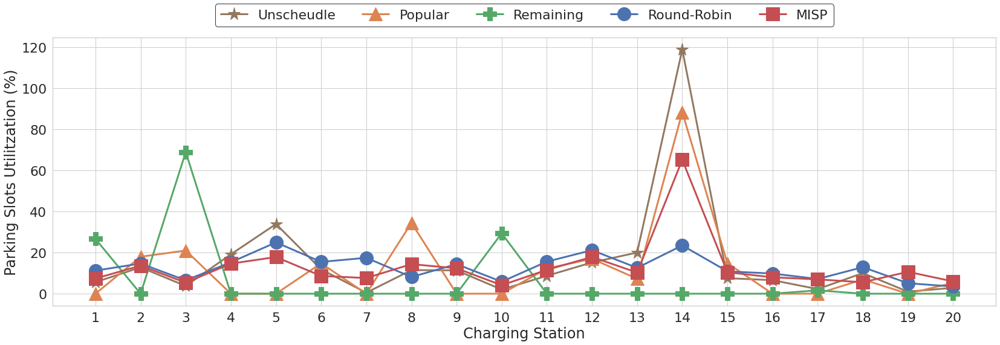

In [ ]:
sns.set(rc={'figure.figsize':(23.5, 8.5)}, font_scale=2)
sns.set_style('whitegrid')
colors = sns.color_palette("deep", 6)
image_info = {"unschedule_ratio": ["*", "Unscheudle", colors[5]], 
              "popular_ratio": ["^", "Popular", colors[1]], 
              "remaining_ratio": ["P", "Remaining", colors[2]], 
              "rr_ratio": ["o", "Round-Robin", colors[0]], 
              "MF":["H", "MISMF", colors[4]], 
              "schedule_ratio": ["s", "MISP", colors[3]]}

for item in ["unschedule_ratio", "popular_ratio", "remaining_ratio", "rr_ratio", "schedule_ratio"]:
    plt.plot(result_df[item], label=image_info[item][1], marker=image_info[item][0], markersize=22, linewidth=3, color=image_info[item][2])

plt.xticks(range(20), [i for i in range(1, 21)])
plt.xlabel("Charging Station")
plt.ylabel("Parking Slots Utilitzation (%)")
plt.legend(bbox_to_anchor=(0.5, 1.15), loc="upper center", ncol = 5, edgecolor="black")
# plt.legend(bbox_to_anchor=(0.5, 1.15), loc='upper center', fontsize=18, ncol = 3, edgecolor="black")
plt.tight_layout()
plt.savefig("./Image/all_spatial_utilization.png")
plt.show()

In [ ]:
unschedule_array = np.array(unschedule_ev_charging_volume)
popular_array = np.array(popular_ev_charging_volume)
remaining_array = np.array(remaining_ev_charging_volume)
rr_array = np.array(round_ev_charging_volume)
schedule_array = np.array(schedule_ev_charging_volume)
# temporal_time_list = defaultdict(list)
temporal_df = pd.DataFrame([], columns=["hour", "slots_num", "unschedule_num", "popular_num", "remaining_num", "rr_num", "schedule_num",
                                        "unschedule_ratio", "popular_ratio", "remaining_ratio", "rr_ratio", "schedule_ratio"])


for hour in range(0, 24):
    popular_volume = remaining_volume = unschedule_volume = rr_volume = schedule_volume = 0
    slots_num = truth_data.loc[truth_data["datetime"].dt.hour == hour, "parkingSlots"].sum()
    for slot in range(hour, 168, 24):
        for cs in range(20):
            popular_volume += popular_array[cs][slot]
            remaining_volume += remaining_array[cs][slot]
            unschedule_volume += unschedule_array[cs][slot]
            schedule_volume += schedule_array[cs][slot]
            rr_volume += rr_array[cs][slot]

    temporal_df.loc[len(temporal_df)] = [hour,
                                         slots_num,
                                         unschedule_volume / charging_speed,
                                         popular_volume / charging_speed,
                                         remaining_volume / charging_speed,
                                         rr_volume / charging_speed,
                                         schedule_volume / charging_speed,
                                         unschedule_volume / charging_speed / slots_num * 100,
                                         popular_volume / charging_speed / slots_num * 100,
                                         remaining_volume / charging_speed / slots_num * 100,
                                         rr_volume / charging_speed / slots_num * 100,
                                         schedule_volume / charging_speed / slots_num * 100]

# for key in temporal_time_list.keys():
#     print(f"{key} = {np.std(temporal_time_list[key]) / np.mean(temporal_time_list[key])}")
temporal_df.to_csv("./Result/temporal_utilization.csv")
temporal_df

,hour,slots_num,unschedule_num,popular_num,remaining_num,rr_num,schedule_num,unschedule_ratio,popular_ratio,remaining_ratio,rr_ratio,schedule_ratio
0,0.0,977.0,8.0,0.0,70.0,57.0,26.0,0.818833,0.000000,7.164790,5.834186,2.661208
1,1.0,982.0,11.0,70.0,140.0,57.0,48.0,1.120163,7.128310,14.256619,5.804481,4.887984
2,2.0,935.0,16.0,48.0,149.0,57.0,57.0,1.711230,5.133690,15.935829,6.096257,6.096257
3,3.0,903.0,20.0,16.0,98.0,58.0,43.0,2.214839,1.771872,10.852713,6.423034,4.761905
4,4.0,811.0,14.0,1.0,74.0,58.0,27.0,1.726264,0.123305,9.124538,7.151665,3.329223
5,5.0,758.0,17.0,0.0,71.0,58.0,21.0,2.242744,0.000000,9.366755,7.651715,2.770449
6,6.0,508.0,13.0,0.0,70.0,58.0,14.0,2.559055,0.000000,13.779528,11.417323,2.755906
7,7.0,466.0,29.0,14.0,70.0,58.0,34.0,6.223176,3.004292,15.021459,12.446352,7.296137
8,8.0,382.0,26.0,14.0,70.0,58.0,73.0,6.806283,3.664921,18.324607,15.183246,19.109948
9,9.0,350.0,58.0,14.0,29.0,58.0,67.0,16.571429,4.000000,8.285714,16.571429,19.142857


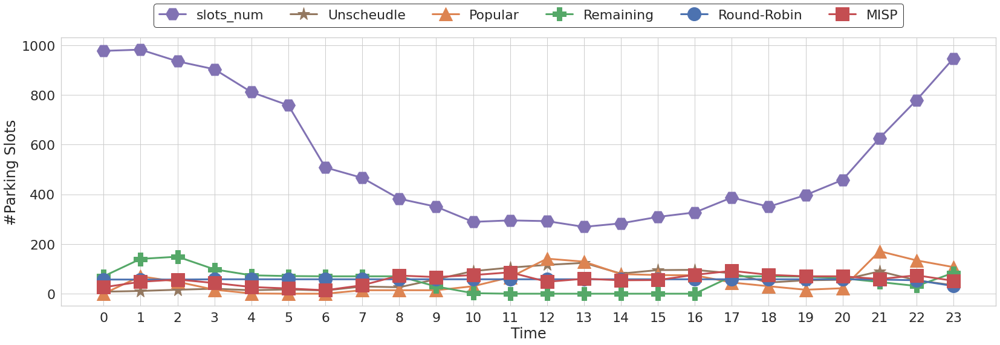

In [ ]:
sns.set(rc={'figure.figsize':(23.5, 8.5)}, font_scale=2)
sns.set_style('whitegrid')
colors = sns.color_palette("deep", 6)
image_info = {"unschedule_ratio": ["*", "Unscheudle", colors[5]], 
              "popular_ratio": ["^", "Popular", colors[1]], 
              "remaining_ratio": ["P", "Remaining", colors[2]], 
              "rr_ratio": ["o", "Round-Robin", colors[0]], 
              "slots_num":["H", "slots_num", colors[4]], 
              "schedule_ratio": ["s", "MISP", colors[3]]}

for item in ["unschedule_ratio", "popular_ratio", "remaining_ratio", "rr_ratio", "schedule_ratio"]:
    plt.plot(temporal_df[item], label=image_info[item][1], marker=image_info[item][0], markersize=22, linewidth=3, color=image_info[item][2])

plt.xticks(range(24), [i for i in range(0, 24)])
plt.xlabel("Time")
plt.ylabel("Parking Slots Utilitzation (%)")
plt.legend(bbox_to_anchor=(0.5, 1.15), loc="upper center", ncol = 6, edgecolor="black")
# plt.legend(bbox_to_anchor=(0.5, 1.15), loc='upper center', fontsize=18, ncol = 3, edgecolor="black")
plt.tight_layout()
plt.savefig("./Image/all_temporal_utilization.png")
plt.show()

In [ ]:
# for item in ["unschedule_ratio", "popular_ratio", "remaining_ratio", "rr_ratio", "schedule_ratio"]:
#     print("spatial, ", item, "=\t", np.std(result_df[item]) / np.mean(result_df[item]))
#     print("temporal, ", item, "=\t", np.std(temporal_df[item]) / np.mean(temporal_df[item]))
# print("=====")
for item in ["unschedule_num", "popular_num", "remaining_num", "rr_num", "schedule_num"]:
    # print("spatial, ", item, "=\t", np.std(result_df[item]) / np.mean(result_df[item]))
    print("temporal, ", item, "=\t", np.std(temporal_df[item]) / np.mean(temporal_df[item]))

temporal,  unschedule_num =	 0.6567503035081924
temporal,  popular_num =	 0.9220288358892298
temporal,  remaining_num =	 0.797594678058395
temporal,  rr_num =	 0.09537631122684911
temporal,  schedule_num =	 0.36162789202386797


In [ ]:
a = [3,5,5,2]
idx_order = sorted(range(len(a)), key=lambda k: a[k], reverse=True)
print(idx_order)

for idx, row in enumerate(a):
    print(idx_order.index(idx))

[1, 2, 0, 3]
2
0
1
3


In [ ]:
# n=1000
# m1=-3
# m2=3

# df1 = pd.DataFrame((np.random.randn(n)+m1).reshape(-1,2), columns=['x','y'])
# df2 = pd.DataFrame((np.random.randn(n)+m2).reshape(-1,2), columns=['x','y'])
# df3 = pd.DataFrame(df1.values+df2.values, columns=['x','y'])
# df1['kind'] = 'dist1'
# df2['kind'] = 'dist2'
# df3['kind'] = 'dist1+dist2'
# df=pd.concat([df1,df2,df3])
df = pd.concat([MF, MISP])

def multivariateGrid(col_x, col_y, col_k, df, k_is_color=False, scatter_alpha=.7):
    sns.set(font_scale=1.5)
    sns.set_style('whitegrid')


    def colored_scatter(x, y, marker, c=None):
        def scatter(*args, **kwargs):
            args = (x, y)
            if c is not None:
                kwargs['c'] = c
            kwargs["marker"] = marker
            kwargs['alpha'] = scatter_alpha
            plt.scatter(*args, **kwargs)


        return scatter

    g = sns.JointGrid(
        x=col_x,
        y=col_y,
        data=df,
        xlim=(-2.5, 12.5),
        ylim=(-2.5, 24.5)
    )

    color = None
    legends=[]
    for name, df_group in df.groupby(col_k):
        legends.append(name)
        if k_is_color:
            color=name
        if name == "MF":
            color = "blue"
            marker = "^"
        elif name == "MISP":
            color = "red"
            marker = "o"
        elif name == "Remaining":
            marker = "D"
            color = "purple"
        elif name == "Popular":
            marker = "*"
            color = "green"
        g.plot_joint(
            colored_scatter(df_group[col_x],df_group[col_y],marker,color),
        )
        sns.distplot(
            df_group[col_x].values,
            ax=g.ax_marg_x,
            color=color,
            hist=False
        )
        sns.distplot(
            df_group[col_y].values,
            ax=g.ax_marg_y,
            color=color,            
            vertical=True,
            hist=False
        )
    # Do also global Hist:
    # sns.distplot(
    #     df[col_x].values,
    #     ax=g.ax_marg_x,
    #     color='grey'
    # )
    # sns.distplot(
    #     df[col_y].values.ravel(),
    #     ax=g.ax_marg_y,
    #     color='grey',
    #     vertical=True
    # )
    plt.legend(legends)
    plt.tight_layout()

    g.fig.set_figwidth(10)
    g.fig.set_figheight(8)
    g.savefig("./Image/scatter_MF_MISP.png", dpi=500)

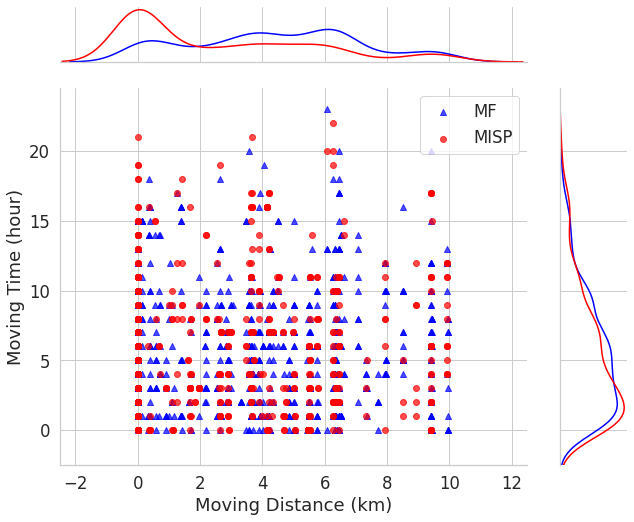

In [ ]:
multivariateGrid('Moving Distance (km)', 'Moving Time (hour)', 'kind', df=df)

In [ ]:
schedule_df = pd.read_csv(f"./Result/Schedule/MultipleStation/MISP/Threshold_3/alpha_0.5.csv", index_col=0)
schedule_df["datetime"] = pd.to_datetime(schedule_df["datetime"], format="%Y-%m-%d %H:%M:%S")
schedule_df["locationID"] = schedule_df["locationID"].astype(str)
schedule_df["buildingID"] = schedule_df["buildingID"].astype(str)
schedule_df

,datetime,date,userID,locationID,buildingID,chargingLen,originLocationID,originChargingHour,incentive,score
0,2018-07-01 15:00:00,701,606941,50911,0,3.0,51087,17,0.1,0.457015
1,2018-07-01 16:00:00,701,604897H,51199,1,1.0,51200,16,0.2,0.566799
2,2018-07-01 10:00:00,701,604760H,50911,0,1.0,50240,17,0.1,0.452716
3,2018-07-01 16:00:00,701,V009198,51087,18,2.0,50911,17,0.1,0.376612
4,2018-07-01 11:00:00,701,604725H,50261,9,2.0,50261,16,0.1,0.535279
...,...,...,...,...,...,...,...,...,...,...
747,2018-07-07 09:00:00,707,604900H,50261,9,2.0,50266,12,0.1,0.214664
748,2018-07-07 04:00:00,707,604804H,50692,3,2.0,50230,12,0.1,0.144641
749,2018-07-07 11:00:00,707,604745H,51199,1,2.0,51199,12,0.1,0.206495
750,2018-07-07 04:00:00,707,603522H,50269,12,2.0,50911,12,0.5,0.012014


In [ ]:
mf_df = pd.read_csv("./Result/Schedule/MultipleStation/MF/Threshold_3/alpha_0.5.csv", index_col=0)
mf_df["datetime"] = pd.to_datetime(mf_df["datetime"], format="%Y-%m-%d %H:%M:%S")
mf_df["locationID"] = mf_df["locationID"].astype(str)
mf_df["buildingID"] = mf_df["buildingID"].astype(str)
mf_df

,datetime,date,userID,locationID,buildingID,chargingLen,originLocationID,originChargingHour,incentive,score
0,2018-07-01 12:00:00,701,606941,50911,0,3.0,51087,17,1.0,0.220272
1,2018-07-01 15:00:00,701,604897H,50911,0,1.0,51200,16,2.0,0.227074
2,2018-07-01 02:00:00,701,604760H,50909,8,1.0,50240,17,5.0,0.213615
3,2018-07-01 15:00:00,701,V009198,50911,0,2.0,50911,17,2.0,0.228800
4,2018-07-01 11:00:00,701,604725H,50911,0,2.0,50261,16,1.0,0.188754
...,...,...,...,...,...,...,...,...,...,...
747,2018-07-07 22:00:00,707,604900H,50692,3,2.0,50266,12,4.0,0.146549
748,2018-07-07 09:00:00,707,604804H,50349,7,2.0,50230,12,5.0,0.167676
749,2018-07-07 12:00:00,707,604745H,50841,2,2.0,51199,12,1.0,0.156883
750,2018-07-07 08:00:00,707,603522H,50692,3,2.0,50911,12,1.0,0.158949


In [ ]:
popular_df = pd.read_csv("./Result/Schedule/MultipleStation/Popular/popular.csv", index_col=0)
popular_df ["datetime"] = pd.to_datetime(popular_df ["datetime"], format="%Y-%m-%d %H:%M:%S")
popular_df["locationID"] = popular_df["locationID"].astype(str)
popular_df ["buildingID"] = popular_df["buildingID"].astype(str)
popular_df

,datetime,userID,locationID,buildingID,chargingLen,originLocationID,originChargingHour
0,2018-07-01 21:00:00,606941,50841,2,3.0,51087,17
1,2018-07-01 21:00:00,604897H,50841,2,1.0,51200,16
2,2018-07-01 21:00:00,604760H,50841,2,1.0,50240,17
3,2018-07-01 20:00:00,V009198,50911,0,2.0,50911,17
4,2018-07-01 20:00:00,604725H,50911,0,2.0,50261,16
...,...,...,...,...,...,...,...
748,2018-07-07 14:00:00,604900H,50269,12,2.0,50266,12
749,2018-07-07 14:00:00,604804H,50269,12,2.0,50230,12
750,2018-07-07 21:00:00,604745H,50349,7,2.0,51199,12
751,2018-07-07 21:00:00,603522H,50349,7,2.0,50911,12


In [ ]:
residual_df = pd.read_csv("./Result/Schedule/MultipleStation/Remaining/Remaining.csv", index_col=0)
residual_df ["datetime"] = pd.to_datetime(residual_df ["datetime"], format="%Y-%m-%d %H:%M:%S")
residual_df["locationID"] = residual_df["locationID"].astype(str)
residual_df ["buildingID"] = residual_df["buildingID"].astype(str)
residual_df

,datetime,userID,locationID,buildingID,chargingLen,originChargingHour,originLocationID
0,2018-07-01 00:00:00,606941,50692,3,3,17,51087
1,2018-07-01 00:00:00,604897H,50692,3,1,16,51200
2,2018-07-01 00:00:00,604760H,50692,3,1,17,50240
3,2018-07-01 00:00:00,V009198,50692,3,2,17,50911
4,2018-07-01 00:00:00,604725H,50692,3,2,16,50261
...,...,...,...,...,...,...,...
748,2018-07-07 05:00:00,604900H,50263,11,2,12,50266
749,2018-07-07 06:00:00,604804H,50263,11,2,12,50230
750,2018-07-07 06:00:00,604745H,50263,11,2,12,51199
751,2018-07-07 06:00:00,603522H,50263,11,2,12,50911


In [ ]:
distance = 0
time = 0
MISP = pd.DataFrame([], columns=["Moving Distance (km)", "Moving Time (hour)"])
for idx, raw in schedule_df.iterrows():
    # if raw["datetime"] >= parser.parse("2018-07-02"):
    #     break
    distance = haversine(location.loc[raw["locationID"], ["Latitude", "Longitude"]].values, location.loc[user_preference[raw["userID"]]["locationId"], ["Latitude", "Longitude"]].values, unit = Unit.KILOMETERS)
    time = abs(raw["datetime"].hour - user_preference[raw["userID"]]["createdHour"])
    MISP.loc[len(MISP)] = [distance, time]

MF = pd.DataFrame([], columns=["Moving Distance (km)", "Moving Time (hour)"])
for idx, raw in mf_df.iterrows():
    # if raw["datetime"] >= parser.parse("2018-07-02"):
    #     break
    distance = haversine(location.loc[raw["locationID"], ["Latitude", "Longitude"]].values, location.loc[user_preference[raw["userID"]]["locationId"], ["Latitude", "Longitude"]].values, unit = Unit.KILOMETERS)
    time = abs(raw["datetime"].hour - user_preference[raw["userID"]]["createdHour"])
    MF.loc[len(MF)] = [distance, time]

Popular = pd.DataFrame([], columns=["Moving Distance (km)", "Moving Time (hour)"])
for idx, raw in popular_df.iterrows():
    # if raw["datetime"] >= parser.parse("2018-07-02"):
    #     break
    if raw["userID"] == "603475":
        continue
    distance = haversine(location.loc[raw["locationID"], ["Latitude", "Longitude"]].values, location.loc[user_preference[raw["userID"]]["locationId"], ["Latitude", "Longitude"]].values, unit = Unit.KILOMETERS)
    time = abs(raw["datetime"].hour - user_preference[raw["userID"]]["createdHour"])
    Popular.loc[len(Popular)] = [distance, time]

Remaining = pd.DataFrame([], columns=["Moving Distance (km)", "Moving Time (hour)"])
for idx, raw in residual_df.iterrows():
    # if raw["datetime"] >= parser.parse("2018-07-02"):
    #     break
    if raw["userID"] == "603475":
        continue
    distance = haversine(location.loc[raw["locationID"], ["Latitude", "Longitude"]].values, location.loc[user_preference[raw["userID"]]["locationId"], ["Latitude", "Longitude"]].values, unit = Unit.KILOMETERS)
    time = abs(raw["datetime"].hour - user_preference[raw["userID"]]["createdHour"])
    Remaining.loc[len(Remaining)] = [distance, time]

MF["kind"] = "MF"
MISP["kind"] = "MISP"
Popular["kind"] = "Popular"
Remaining["kind"] = "Remaining"
MISP

,Moving Distance (km),Moving Time (hour),kind
0,0.000000,1.0,MISP
1,0.000000,6.0,MISP
2,5.758650,6.0,MISP
3,0.000000,0.0,MISP
4,0.000000,4.0,MISP
...,...,...,...
747,2.624590,4.0,MISP
748,1.705099,8.0,MISP
749,0.010981,1.0,MISP
750,4.145089,16.0,MISP


In [ ]:
average_request_num = pd.DataFrame([], columns=["locationId", "datetime", "num"])
for cs in range(20):
    testing_start_time = parser.parse("2018-07-01")
    for i in range(7):
        locationID = location[location["buildingID"] == str(cs)].index[0]
        df = charging_data[(charging_data["locationId"] == locationID) &
                            (charging_data["createdNew"] >= (testing_start_time - timedelta(days=3))) &
                            (charging_data["createdNew"] < testing_start_time)]
        average_request_num.loc[len(average_request_num)] = [location[location["buildingID"] == str(cs)].index[0], testing_start_time, math.floor(len(df)/3)]
        testing_start_time += timedelta(days=1)

average_request_num.to_csv("./Dataset/Simulation/average_request_num.csv")
average_request_num

,locationId,datetime,num
0,50911,2018-07-01,14
1,50911,2018-07-02,19
2,50911,2018-07-03,22
3,50911,2018-07-04,29
4,50911,2018-07-05,29
...,...,...,...
135,50268,2018-07-03,2
136,50268,2018-07-04,4
137,50268,2018-07-05,3
138,50268,2018-07-06,4


## LSTM

### 訓練

In [ ]:
import keras
from keras.models import Sequential, load_model
from keras.layers import Dense, Dropout, Activation, Flatten, LSTM, TimeDistributed, RepeatVector
from keras.callbacks import EarlyStopping, ModelCheckpoint

In [ ]:
def building_many_to_one_model(x_train):
    model = Sequential()
    model.add(LSTM(units=100, input_shape=(x_train.shape[1], 1), return_sequences=False))
    # model.add(Dropout(0.1))
    # model.add(LSTM(units=100, activation="relu"))
    model.add(Dense(24))
    model.compile(loss="mse", optimizer="adam")

    return model

In [ ]:
def LSTM_data(building_data, buildingID, typing):
    training_start_time = parser.parse("2018-03-01")
    training_end_time = parser.parse("2018-07-01")

    data = building_data[(building_data["buildingID"] == buildingID) &
                         (building_data["datetime"] >= training_start_time) &
                         (building_data["datetime"] < training_end_time)][typing]
    x_train, y_train = list(), list()
    period = 7 * 24 # 7 days

    for i in range(period, len(data), 24):
        x_train.append(data.iloc[i-period:i].values)
        y_train.append(data.iloc[i:i+24].values)
    x_train, y_train = np.array(x_train), np.array(y_train)

    ######################

    testing_start_time = parser.parse("2018-06-24")
    testing_end_time = parser.parse("2018-07-08")

    data = building_data[(building_data["buildingID"] == buildingID) &
                         (building_data["datetime"] >= testing_start_time) &
                         (building_data["datetime"] < testing_end_time)][typing]
    x_test, y_test = list(), list()

    for i in range(period, len(data), 24):
        x_test.append(data.iloc[i-period:i].values)
        y_test.append(data.iloc[i:i+24].values)
    x_test, y_test = np.array(x_test), np.array(y_test)

    return x_train, y_train, x_test, y_test

In [ ]:
predict = model.predict(x_test)

Epoch 1/200
16/16 [==============================] - 3s 67ms/step - loss: 145.6478
Epoch 2/200
16/16 [==============================] - 1s 65ms/step - loss: 112.8781
Epoch 3/200
16/16 [==============================] - 1s 65ms/step - loss: 78.3579
Epoch 4/200
16/16 [==============================] - 1s 68ms/step - loss: 54.2989
Epoch 5/200
16/16 [==============================] - 1s 66ms/step - loss: 40.0325
Epoch 6/200
16/16 [==============================] - 1s 68ms/step - loss: 31.4796
Epoch 7/200
16/16 [==============================] - 1s 80ms/step - loss: 26.4608
Epoch 8/200
16/16 [==============================] - 1s 68ms/step - loss: 23.5212
Epoch 9/200
16/16 [==============================] - 1s 66ms/step - loss: 22.1858
Epoch 10/200
16/16 [==============================] - 1s 65ms/step - loss: 21.3764
Epoch 11/200
16/16 [==============================] - 1s 66ms/step - loss: 20.8454
Epoch 12/200
16/16 [==============================] - 1s 66ms/step - loss: 20.6270
Epoch 13/20

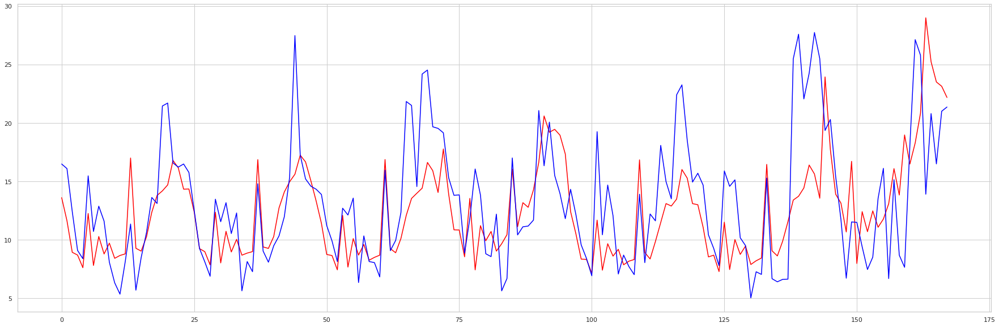

Epoch 1/200
16/16 [==============================] - 3s 69ms/step - loss: 1.6651
Epoch 2/200
16/16 [==============================] - 1s 69ms/step - loss: 0.2665
Epoch 3/200
16/16 [==============================] - 1s 72ms/step - loss: 0.2037
Epoch 4/200
16/16 [==============================] - 1s 70ms/step - loss: 0.1820
Epoch 5/200
16/16 [==============================] - 1s 71ms/step - loss: 0.1879
Epoch 6/200
16/16 [==============================] - 1s 69ms/step - loss: 0.1833
Epoch 7/200
16/16 [==============================] - 1s 76ms/step - loss: 0.1796
Epoch 8/200
16/16 [==============================] - 1s 71ms/step - loss: 0.1828
Epoch 9/200
16/16 [==============================] - 1s 70ms/step - loss: 0.1759
Epoch 10/200
16/16 [==============================] - 1s 71ms/step - loss: 0.1788
Epoch 11/200
16/16 [==============================] - 1s 72ms/step - loss: 0.1879
Epoch 12/200
16/16 [==============================] - 1s 72ms/step - loss: 0.1857
Epoch 13/200
16/16 [=====

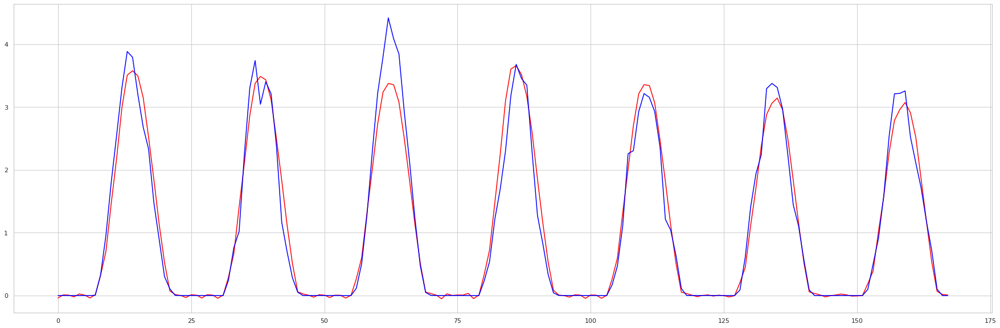

Epoch 1/200
16/16 [==============================] - 3s 73ms/step - loss: 215.8886
Epoch 2/200
16/16 [==============================] - 1s 69ms/step - loss: 180.7473
Epoch 3/200
16/16 [==============================] - 1s 70ms/step - loss: 139.2372
Epoch 4/200
16/16 [==============================] - 1s 70ms/step - loss: 104.8662
Epoch 5/200
16/16 [==============================] - 1s 72ms/step - loss: 81.0897
Epoch 6/200
16/16 [==============================] - 1s 74ms/step - loss: 64.9659
Epoch 7/200
16/16 [==============================] - 1s 71ms/step - loss: 53.1225
Epoch 8/200
16/16 [==============================] - 1s 73ms/step - loss: 45.0526
Epoch 9/200
16/16 [==============================] - 1s 72ms/step - loss: 39.5976
Epoch 10/200
16/16 [==============================] - 1s 73ms/step - loss: 35.9322
Epoch 11/200
16/16 [==============================] - 1s 73ms/step - loss: 33.6352
Epoch 12/200
16/16 [==============================] - 1s 71ms/step - loss: 31.8362
Epoch 13/

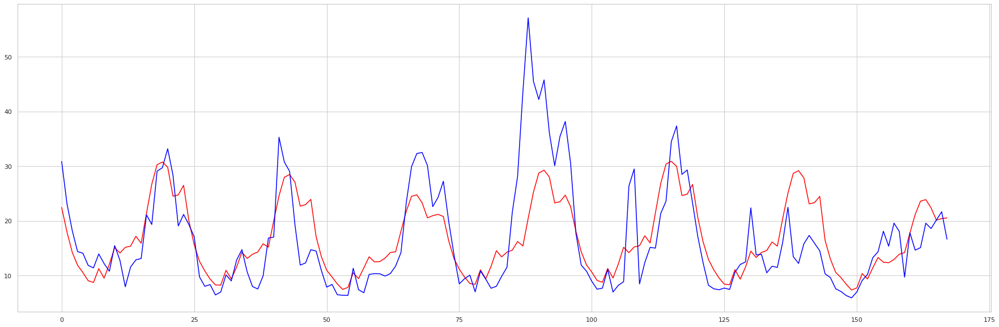

Epoch 1/200
16/16 [==============================] - 3s 73ms/step - loss: 7.6425
Epoch 2/200
16/16 [==============================] - 1s 74ms/step - loss: 2.3449
Epoch 3/200
16/16 [==============================] - 1s 74ms/step - loss: 0.7162
Epoch 4/200
16/16 [==============================] - 1s 74ms/step - loss: 0.6059
Epoch 5/200
16/16 [==============================] - 1s 73ms/step - loss: 0.5962
Epoch 6/200
16/16 [==============================] - 1s 73ms/step - loss: 0.5910
Epoch 7/200
16/16 [==============================] - 1s 73ms/step - loss: 0.6017
Epoch 8/200
16/16 [==============================] - 1s 73ms/step - loss: 0.5974
Epoch 9/200
16/16 [==============================] - 1s 72ms/step - loss: 0.5987
Epoch 10/200
16/16 [==============================] - 1s 76ms/step - loss: 0.5935
Epoch 11/200
16/16 [==============================] - 1s 74ms/step - loss: 0.5890
Epoch 12/200
16/16 [==============================] - 1s 74ms/step - loss: 0.5942
Epoch 13/200
16/16 [=====

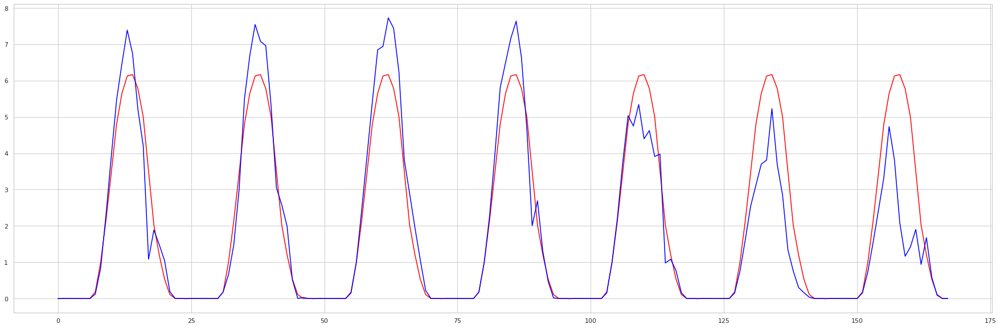

Epoch 1/200
16/16 [==============================] - 3s 72ms/step - loss: 79.7066
Epoch 2/200
16/16 [==============================] - 1s 74ms/step - loss: 57.4507
Epoch 3/200
16/16 [==============================] - 1s 76ms/step - loss: 36.9469
Epoch 4/200
16/16 [==============================] - 1s 74ms/step - loss: 24.8057
Epoch 5/200
16/16 [==============================] - 1s 75ms/step - loss: 18.9456
Epoch 6/200
16/16 [==============================] - 1s 74ms/step - loss: 16.3668
Epoch 7/200
16/16 [==============================] - 1s 75ms/step - loss: 15.1075
Epoch 8/200
16/16 [==============================] - 1s 76ms/step - loss: 14.6227
Epoch 9/200
16/16 [==============================] - 1s 74ms/step - loss: 14.3243
Epoch 10/200
16/16 [==============================] - 1s 74ms/step - loss: 14.1839
Epoch 11/200
16/16 [==============================] - 1s 74ms/step - loss: 14.1398
Epoch 12/200
16/16 [==============================] - 1s 72ms/step - loss: 14.1227
Epoch 13/200


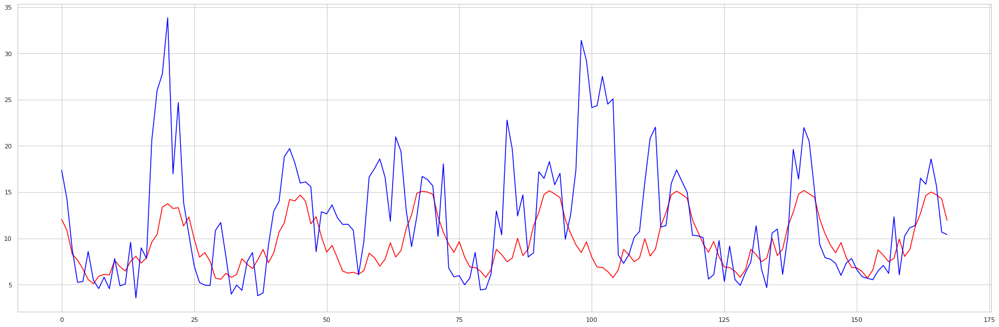

Epoch 1/200
16/16 [==============================] - 3s 73ms/step - loss: 4.1019
Epoch 2/200
16/16 [==============================] - 1s 74ms/step - loss: 0.6565
Epoch 3/200
16/16 [==============================] - 1s 74ms/step - loss: 0.3260
Epoch 4/200
16/16 [==============================] - 1s 75ms/step - loss: 0.2862
Epoch 5/200
16/16 [==============================] - 1s 75ms/step - loss: 0.2885
Epoch 6/200
16/16 [==============================] - 1s 73ms/step - loss: 0.2884
Epoch 7/200
16/16 [==============================] - 1s 73ms/step - loss: 0.2782
Epoch 8/200
16/16 [==============================] - 1s 74ms/step - loss: 0.2780
Epoch 9/200
16/16 [==============================] - 1s 76ms/step - loss: 0.2862
Epoch 10/200
16/16 [==============================] - 1s 75ms/step - loss: 0.2992
Epoch 11/200
16/16 [==============================] - 1s 74ms/step - loss: 0.2877
Epoch 12/200
16/16 [==============================] - 1s 77ms/step - loss: 0.2784
Epoch 13/200
16/16 [=====

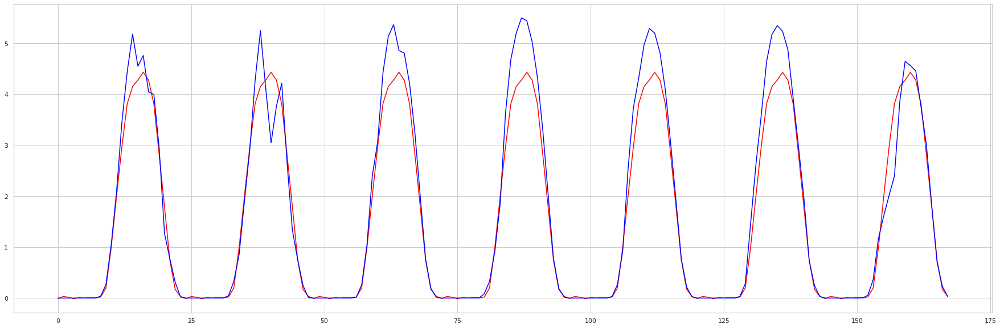

Epoch 1/200
16/16 [==============================] - 3s 75ms/step - loss: 939.8748
Epoch 2/200
16/16 [==============================] - 1s 75ms/step - loss: 879.8508
Epoch 3/200
16/16 [==============================] - 1s 74ms/step - loss: 780.7224
Epoch 4/200
16/16 [==============================] - 1s 74ms/step - loss: 678.9933
Epoch 5/200
16/16 [==============================] - 1s 73ms/step - loss: 593.5563
Epoch 6/200
16/16 [==============================] - 1s 74ms/step - loss: 520.0328
Epoch 7/200
16/16 [==============================] - 1s 77ms/step - loss: 458.2762
Epoch 8/200
16/16 [==============================] - 1s 75ms/step - loss: 405.2946
Epoch 9/200
16/16 [==============================] - 1s 74ms/step - loss: 359.0433
Epoch 10/200
16/16 [==============================] - 1s 78ms/step - loss: 317.8292
Epoch 11/200
16/16 [==============================] - 1s 75ms/step - loss: 282.0590
Epoch 12/200
16/16 [==============================] - 1s 76ms/step - loss: 251.2104
E

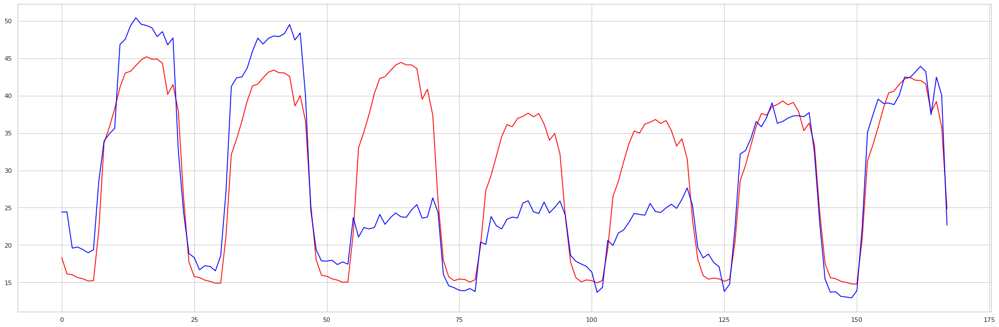

Epoch 1/200
16/16 [==============================] - 3s 72ms/step - loss: 11.3951
Epoch 2/200
16/16 [==============================] - 1s 75ms/step - loss: 4.3098
Epoch 3/200
16/16 [==============================] - 1s 74ms/step - loss: 1.2610
Epoch 4/200
16/16 [==============================] - 1s 77ms/step - loss: 0.9590
Epoch 5/200
16/16 [==============================] - 1s 77ms/step - loss: 0.9571
Epoch 6/200
16/16 [==============================] - 1s 75ms/step - loss: 0.9471
Epoch 7/200
16/16 [==============================] - 1s 74ms/step - loss: 0.9456
Epoch 8/200
16/16 [==============================] - 1s 74ms/step - loss: 0.9442
Epoch 9/200
16/16 [==============================] - 1s 74ms/step - loss: 0.9430
Epoch 10/200
16/16 [==============================] - 1s 75ms/step - loss: 0.9534
Epoch 11/200
16/16 [==============================] - 1s 77ms/step - loss: 0.9462
Epoch 12/200
16/16 [==============================] - 1s 74ms/step - loss: 0.9445
Epoch 13/200
16/16 [====

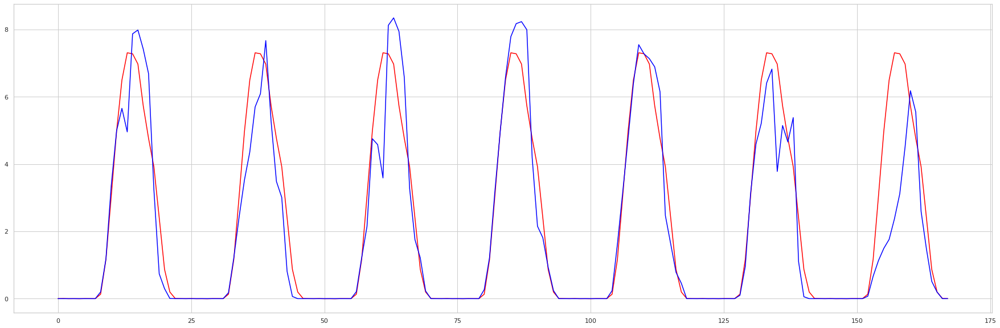

Epoch 1/200
16/16 [==============================] - 3s 79ms/step - loss: 115.4932
Epoch 2/200
16/16 [==============================] - 1s 77ms/step - loss: 86.6744
Epoch 3/200
16/16 [==============================] - 1s 75ms/step - loss: 59.7091
Epoch 4/200
16/16 [==============================] - 1s 77ms/step - loss: 41.1927
Epoch 5/200
16/16 [==============================] - 1s 76ms/step - loss: 29.9679
Epoch 6/200
16/16 [==============================] - 1s 73ms/step - loss: 23.5548
Epoch 7/200
16/16 [==============================] - 1s 75ms/step - loss: 20.1423
Epoch 8/200
16/16 [==============================] - 1s 78ms/step - loss: 18.2408
Epoch 9/200
16/16 [==============================] - 1s 76ms/step - loss: 17.1267
Epoch 10/200
16/16 [==============================] - 1s 77ms/step - loss: 16.4795
Epoch 11/200
16/16 [==============================] - 1s 76ms/step - loss: 16.0788
Epoch 12/200
16/16 [==============================] - 1s 74ms/step - loss: 15.7612
Epoch 13/200

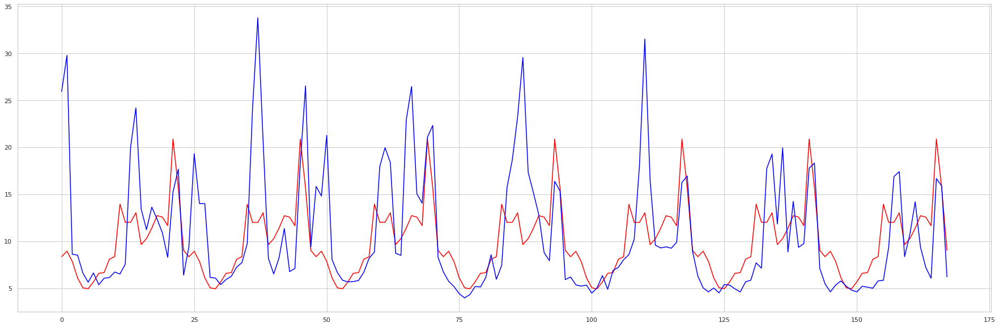

Epoch 1/200
16/16 [==============================] - 3s 76ms/step - loss: 4.2523
Epoch 2/200
16/16 [==============================] - 1s 74ms/step - loss: 0.7831
Epoch 3/200
16/16 [==============================] - 1s 73ms/step - loss: 0.4115
Epoch 4/200
16/16 [==============================] - 1s 75ms/step - loss: 0.3852
Epoch 5/200
16/16 [==============================] - 1s 79ms/step - loss: 0.3704
Epoch 6/200
16/16 [==============================] - 1s 76ms/step - loss: 0.3749
Epoch 7/200
16/16 [==============================] - 1s 74ms/step - loss: 0.3758
Epoch 8/200
16/16 [==============================] - 1s 75ms/step - loss: 0.3811
Epoch 9/200
16/16 [==============================] - 1s 76ms/step - loss: 0.3722
Epoch 10/200
16/16 [==============================] - 1s 75ms/step - loss: 0.3757
Epoch 11/200
16/16 [==============================] - 1s 77ms/step - loss: 0.3706
Epoch 12/200
16/16 [==============================] - 1s 77ms/step - loss: 0.3688
Epoch 13/200
16/16 [=====

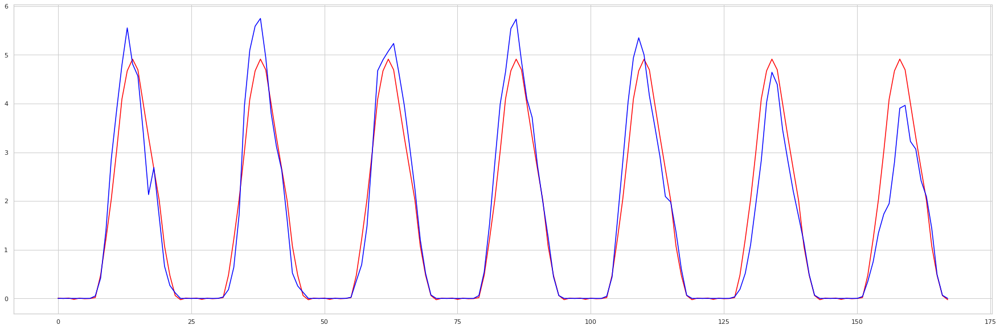

Epoch 1/200
16/16 [==============================] - 3s 78ms/step - loss: 459.9504
Epoch 2/200
16/16 [==============================] - 1s 75ms/step - loss: 401.0860
Epoch 3/200
16/16 [==============================] - 1s 74ms/step - loss: 333.1153
Epoch 4/200
16/16 [==============================] - 1s 76ms/step - loss: 279.4029
Epoch 5/200
16/16 [==============================] - 1s 77ms/step - loss: 231.9133
Epoch 6/200
16/16 [==============================] - 1s 77ms/step - loss: 196.5832
Epoch 7/200
16/16 [==============================] - 1s 78ms/step - loss: 168.0497
Epoch 8/200
16/16 [==============================] - 1s 78ms/step - loss: 144.7260
Epoch 9/200
16/16 [==============================] - 1s 74ms/step - loss: 126.2391
Epoch 10/200
16/16 [==============================] - 1s 76ms/step - loss: 112.4167
Epoch 11/200
16/16 [==============================] - 1s 77ms/step - loss: 100.3222
Epoch 12/200
16/16 [==============================] - 1s 77ms/step - loss: 90.7632
Ep

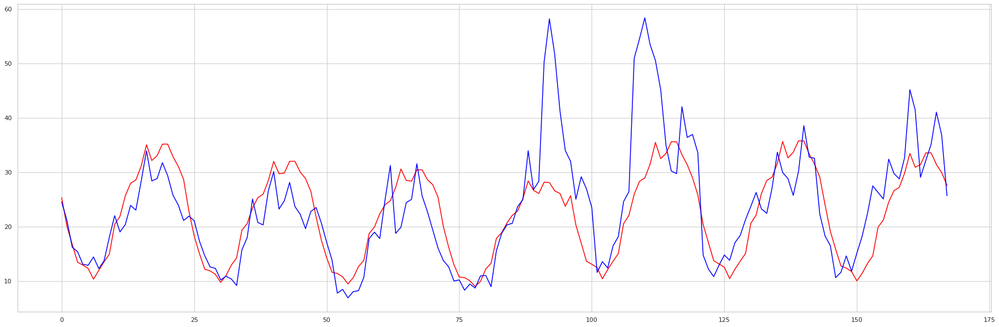

Epoch 1/200
16/16 [==============================] - 3s 74ms/step - loss: 7.0875
Epoch 2/200
16/16 [==============================] - 1s 77ms/step - loss: 1.8401
Epoch 3/200
16/16 [==============================] - 1s 82ms/step - loss: 0.5849
Epoch 4/200
16/16 [==============================] - 1s 76ms/step - loss: 0.5249
Epoch 5/200
16/16 [==============================] - 1s 81ms/step - loss: 0.4964
Epoch 6/200
16/16 [==============================] - 1s 79ms/step - loss: 0.4947
Epoch 7/200
16/16 [==============================] - 1s 78ms/step - loss: 0.4976
Epoch 8/200
16/16 [==============================] - 1s 78ms/step - loss: 0.5003
Epoch 9/200
16/16 [==============================] - 1s 78ms/step - loss: 0.4979
Epoch 10/200
16/16 [==============================] - 1s 77ms/step - loss: 0.5262
Epoch 11/200
16/16 [==============================] - 1s 80ms/step - loss: 0.4986
Epoch 12/200
16/16 [==============================] - 1s 76ms/step - loss: 0.4955
Epoch 13/200
16/16 [=====

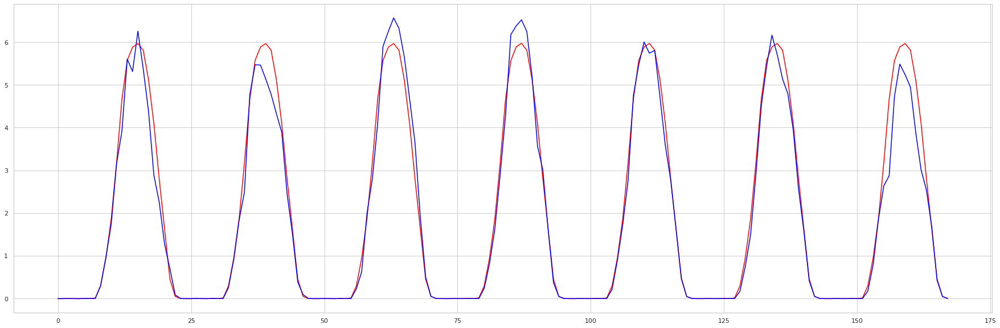

Epoch 1/200
16/16 [==============================] - 3s 76ms/step - loss: 338.3999
Epoch 2/200
16/16 [==============================] - 1s 74ms/step - loss: 297.4716
Epoch 3/200
16/16 [==============================] - 1s 77ms/step - loss: 244.0411
Epoch 4/200
16/16 [==============================] - 1s 76ms/step - loss: 198.6648
Epoch 5/200
16/16 [==============================] - 1s 77ms/step - loss: 163.6594
Epoch 6/200
16/16 [==============================] - 1s 77ms/step - loss: 136.3111
Epoch 7/200
16/16 [==============================] - 1s 77ms/step - loss: 117.7428
Epoch 8/200
16/16 [==============================] - 1s 79ms/step - loss: 103.7775
Epoch 9/200
16/16 [==============================] - 1s 83ms/step - loss: 93.6668
Epoch 10/200
16/16 [==============================] - 1s 77ms/step - loss: 84.9107
Epoch 11/200
16/16 [==============================] - 1s 76ms/step - loss: 79.1007
Epoch 12/200
16/16 [==============================] - 1s 77ms/step - loss: 74.2659
Epoch

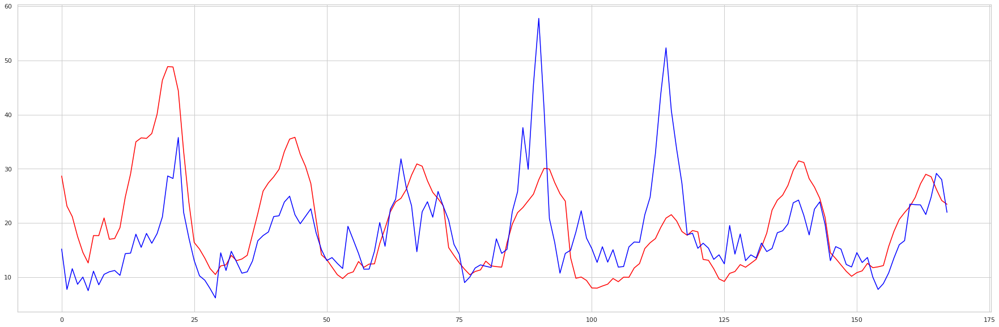

Epoch 1/200
16/16 [==============================] - 3s 76ms/step - loss: 2.2411
Epoch 2/200
16/16 [==============================] - 1s 77ms/step - loss: 0.5077
Epoch 3/200
16/16 [==============================] - 1s 77ms/step - loss: 0.3897
Epoch 4/200
16/16 [==============================] - 1s 78ms/step - loss: 0.3823
Epoch 5/200
16/16 [==============================] - 1s 78ms/step - loss: 0.3804
Epoch 6/200
16/16 [==============================] - 1s 78ms/step - loss: 0.3796
Epoch 7/200
16/16 [==============================] - 1s 78ms/step - loss: 0.3865
Epoch 8/200
16/16 [==============================] - 1s 79ms/step - loss: 0.3957
Epoch 9/200
16/16 [==============================] - 1s 82ms/step - loss: 0.3721
Epoch 10/200
16/16 [==============================] - 1s 76ms/step - loss: 0.3704
Epoch 11/200
16/16 [==============================] - 1s 78ms/step - loss: 0.3899
Epoch 12/200
16/16 [==============================] - 1s 77ms/step - loss: 0.3753
Epoch 13/200
16/16 [=====

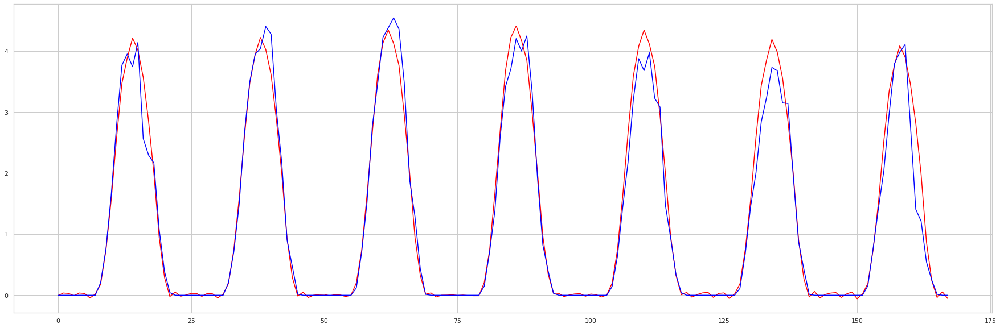

Epoch 1/200
16/16 [==============================] - 3s 82ms/step - loss: 199.1741
Epoch 2/200
16/16 [==============================] - 1s 76ms/step - loss: 161.1547
Epoch 3/200
16/16 [==============================] - 1s 78ms/step - loss: 122.1199
Epoch 4/200
16/16 [==============================] - 1s 79ms/step - loss: 90.5736
Epoch 5/200
16/16 [==============================] - 1s 76ms/step - loss: 67.1535
Epoch 6/200
16/16 [==============================] - 1s 76ms/step - loss: 51.3611
Epoch 7/200
16/16 [==============================] - 1s 77ms/step - loss: 41.1381
Epoch 8/200
16/16 [==============================] - 1s 79ms/step - loss: 34.1694
Epoch 9/200
16/16 [==============================] - 1s 79ms/step - loss: 29.8548
Epoch 10/200
16/16 [==============================] - 1s 75ms/step - loss: 27.1183
Epoch 11/200
16/16 [==============================] - 1s 77ms/step - loss: 25.2400
Epoch 12/200
16/16 [==============================] - 1s 77ms/step - loss: 24.0342
Epoch 13/2

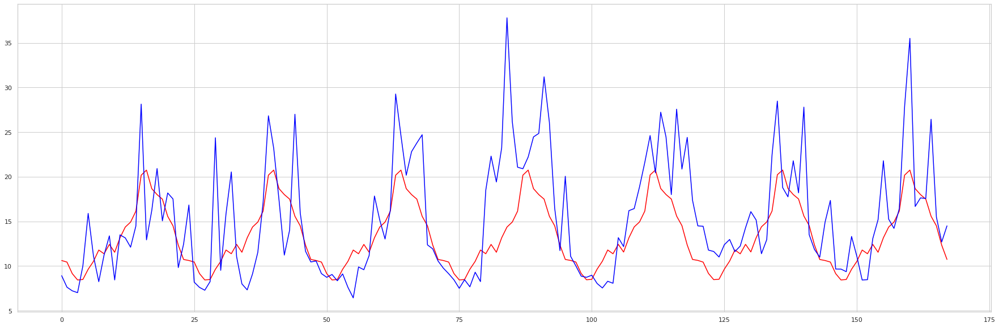

Epoch 1/200
16/16 [==============================] - 3s 79ms/step - loss: 3.1353
Epoch 2/200
16/16 [==============================] - 1s 81ms/step - loss: 0.7003
Epoch 3/200
16/16 [==============================] - 1s 78ms/step - loss: 0.5422
Epoch 4/200
16/16 [==============================] - 1s 77ms/step - loss: 0.5118
Epoch 5/200
16/16 [==============================] - 1s 81ms/step - loss: 0.5050
Epoch 6/200
16/16 [==============================] - 1s 80ms/step - loss: 0.5018
Epoch 7/200
16/16 [==============================] - 1s 80ms/step - loss: 0.5011
Epoch 8/200
16/16 [==============================] - 1s 80ms/step - loss: 0.5081
Epoch 9/200
16/16 [==============================] - 1s 81ms/step - loss: 0.5240
Epoch 10/200
16/16 [==============================] - 1s 83ms/step - loss: 0.4996
Epoch 11/200
16/16 [==============================] - 1s 81ms/step - loss: 0.4841
Epoch 12/200
16/16 [==============================] - 1s 80ms/step - loss: 0.4848
Epoch 13/200
16/16 [=====

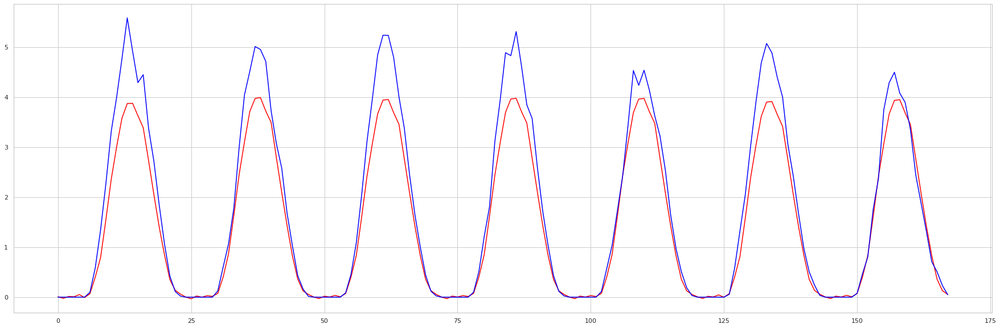

Epoch 1/200
16/16 [==============================] - 3s 82ms/step - loss: 2539.9778
Epoch 2/200
16/16 [==============================] - 1s 81ms/step - loss: 2421.5713
Epoch 3/200
16/16 [==============================] - 1s 77ms/step - loss: 2255.4128
Epoch 4/200
16/16 [==============================] - 1s 82ms/step - loss: 2094.8970
Epoch 5/200
16/16 [==============================] - 1s 78ms/step - loss: 1956.4042
Epoch 6/200
16/16 [==============================] - 1s 83ms/step - loss: 1823.2823
Epoch 7/200
16/16 [==============================] - 1s 79ms/step - loss: 1701.9655
Epoch 8/200
16/16 [==============================] - 1s 78ms/step - loss: 1588.9956
Epoch 9/200
16/16 [==============================] - 1s 78ms/step - loss: 1483.8846
Epoch 10/200
16/16 [==============================] - 1s 78ms/step - loss: 1389.8727
Epoch 11/200
16/16 [==============================] - 1s 79ms/step - loss: 1301.2494
Epoch 12/200
16/16 [==============================] - 1s 80ms/step - loss:

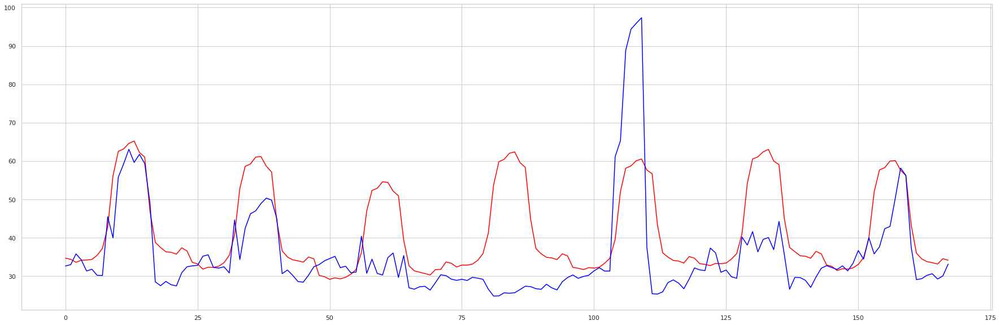

Epoch 1/200
16/16 [==============================] - 3s 78ms/step - loss: 9.0574
Epoch 2/200
16/16 [==============================] - 1s 81ms/step - loss: 3.1408
Epoch 3/200
16/16 [==============================] - 1s 81ms/step - loss: 1.2104
Epoch 4/200
16/16 [==============================] - 1s 81ms/step - loss: 1.0725
Epoch 5/200
16/16 [==============================] - 1s 81ms/step - loss: 1.0645
Epoch 6/200
16/16 [==============================] - 1s 83ms/step - loss: 1.0500
Epoch 7/200
16/16 [==============================] - 1s 83ms/step - loss: 1.0490
Epoch 8/200
16/16 [==============================] - 1s 81ms/step - loss: 1.0463
Epoch 9/200
16/16 [==============================] - 1s 79ms/step - loss: 1.0453
Epoch 10/200
16/16 [==============================] - 1s 82ms/step - loss: 1.0528
Epoch 11/200
16/16 [==============================] - 1s 81ms/step - loss: 1.0427
Epoch 12/200
16/16 [==============================] - 1s 79ms/step - loss: 1.0511
Epoch 13/200
16/16 [=====

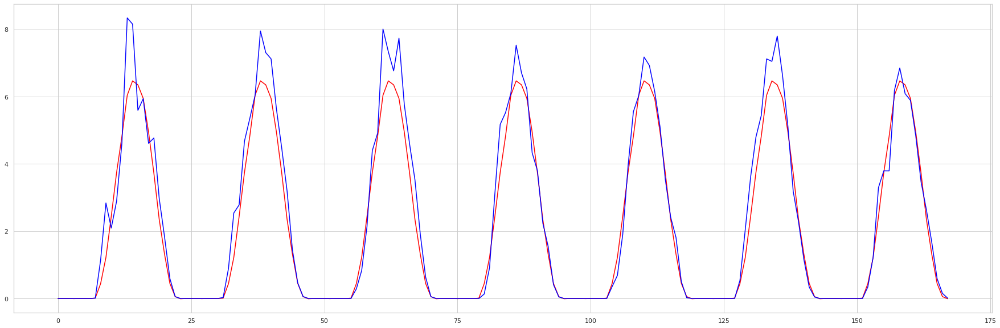

Epoch 1/200
16/16 [==============================] - 4s 84ms/step - loss: 413.1627
Epoch 2/200
16/16 [==============================] - 1s 80ms/step - loss: 362.5728
Epoch 3/200
16/16 [==============================] - 1s 82ms/step - loss: 298.6382
Epoch 4/200
16/16 [==============================] - 1s 84ms/step - loss: 244.4739
Epoch 5/200
16/16 [==============================] - 1s 82ms/step - loss: 204.2536
Epoch 6/200
16/16 [==============================] - 1s 78ms/step - loss: 171.2255
Epoch 7/200
16/16 [==============================] - 1s 79ms/step - loss: 144.6781
Epoch 8/200
16/16 [==============================] - 1s 88ms/step - loss: 124.2261
Epoch 9/200
16/16 [==============================] - 1s 84ms/step - loss: 108.6218
Epoch 10/200
16/16 [==============================] - 1s 81ms/step - loss: 97.0311
Epoch 11/200
16/16 [==============================] - 1s 81ms/step - loss: 86.7669
Epoch 12/200
16/16 [==============================] - 1s 84ms/step - loss: 79.3108
Epoc

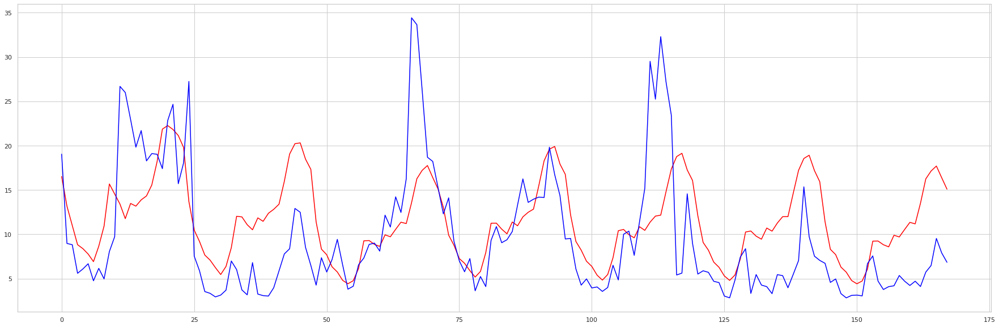

Epoch 1/200
16/16 [==============================] - 3s 81ms/step - loss: 5.0114
Epoch 2/200
16/16 [==============================] - 1s 81ms/step - loss: 1.9929
Epoch 3/200
16/16 [==============================] - 1s 85ms/step - loss: 1.7006
Epoch 4/200
16/16 [==============================] - 1s 83ms/step - loss: 1.6363
Epoch 5/200
16/16 [==============================] - 1s 83ms/step - loss: 1.6120
Epoch 6/200
16/16 [==============================] - 1s 80ms/step - loss: 1.4746
Epoch 7/200
16/16 [==============================] - 1s 84ms/step - loss: 1.2953
Epoch 8/200
16/16 [==============================] - 1s 85ms/step - loss: 1.1783
Epoch 9/200
16/16 [==============================] - 1s 80ms/step - loss: 1.1174
Epoch 10/200
16/16 [==============================] - 1s 83ms/step - loss: 1.3635
Epoch 11/200
16/16 [==============================] - 1s 81ms/step - loss: 1.1322
Epoch 12/200
16/16 [==============================] - 1s 81ms/step - loss: 1.0654
Epoch 13/200
16/16 [=====

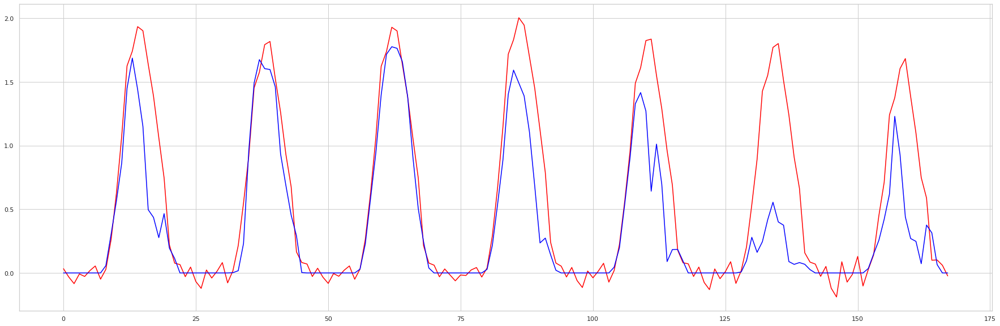

Epoch 1/200
16/16 [==============================] - 3s 82ms/step - loss: 122.7936
Epoch 2/200
16/16 [==============================] - 1s 83ms/step - loss: 95.4456
Epoch 3/200
16/16 [==============================] - 1s 86ms/step - loss: 65.6121
Epoch 4/200
16/16 [==============================] - 1s 84ms/step - loss: 43.5386
Epoch 5/200
16/16 [==============================] - 1s 83ms/step - loss: 31.0601
Epoch 6/200
16/16 [==============================] - 1s 83ms/step - loss: 23.4295
Epoch 7/200
16/16 [==============================] - 1s 83ms/step - loss: 19.2965
Epoch 8/200
16/16 [==============================] - 1s 82ms/step - loss: 16.9510
Epoch 9/200
16/16 [==============================] - 1s 84ms/step - loss: 15.5892
Epoch 10/200
16/16 [==============================] - 1s 84ms/step - loss: 14.8300
Epoch 11/200
16/16 [==============================] - 1s 82ms/step - loss: 14.4281
Epoch 12/200
16/16 [==============================] - 1s 85ms/step - loss: 14.1467
Epoch 13/200

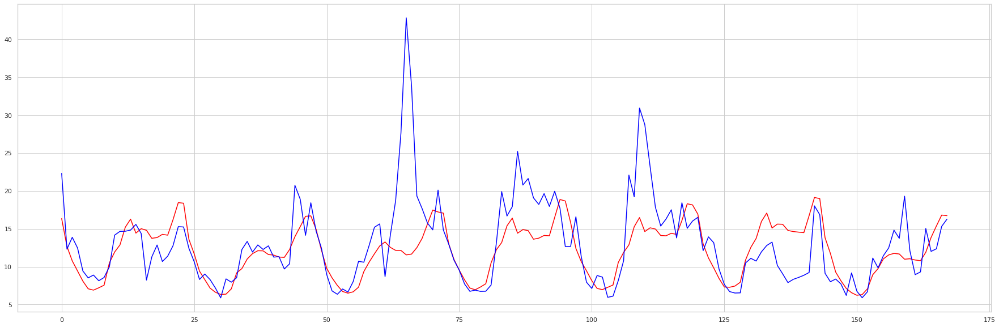

Epoch 1/200
16/16 [==============================] - 4s 86ms/step - loss: 2.8829
Epoch 2/200
16/16 [==============================] - 1s 84ms/step - loss: 0.6079
Epoch 3/200
16/16 [==============================] - 1s 86ms/step - loss: 0.5181
Epoch 4/200
16/16 [==============================] - 1s 84ms/step - loss: 0.4951
Epoch 5/200
16/16 [==============================] - 1s 86ms/step - loss: 0.4738
Epoch 6/200
16/16 [==============================] - 1s 88ms/step - loss: 0.4846
Epoch 7/200
16/16 [==============================] - 1s 86ms/step - loss: 0.4736
Epoch 8/200
16/16 [==============================] - 1s 83ms/step - loss: 0.4862
Epoch 9/200
16/16 [==============================] - 1s 85ms/step - loss: 0.4756
Epoch 10/200
16/16 [==============================] - 1s 87ms/step - loss: 0.4815
Epoch 11/200
16/16 [==============================] - 1s 85ms/step - loss: 0.4687
Epoch 12/200
16/16 [==============================] - 1s 84ms/step - loss: 0.4843
Epoch 13/200
16/16 [=====

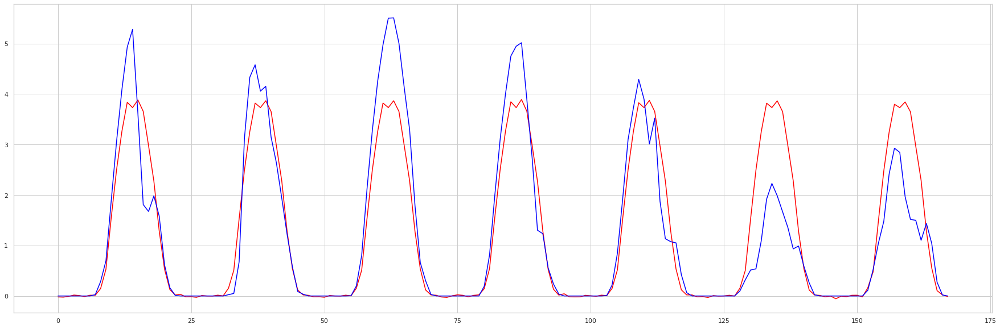

Epoch 1/200
16/16 [==============================] - 3s 83ms/step - loss: 242.7139
Epoch 2/200
16/16 [==============================] - 1s 85ms/step - loss: 201.6190
Epoch 3/200
16/16 [==============================] - 1s 83ms/step - loss: 162.8583
Epoch 4/200
16/16 [==============================] - 1s 84ms/step - loss: 127.8213
Epoch 5/200
16/16 [==============================] - 1s 85ms/step - loss: 100.4367
Epoch 6/200
16/16 [==============================] - 1s 82ms/step - loss: 79.8883
Epoch 7/200
16/16 [==============================] - 1s 92ms/step - loss: 65.7459
Epoch 8/200
16/16 [==============================] - 1s 92ms/step - loss: 55.8786
Epoch 9/200
16/16 [==============================] - 1s 84ms/step - loss: 49.6301
Epoch 10/200
16/16 [==============================] - 1s 86ms/step - loss: 45.6537
Epoch 11/200
16/16 [==============================] - 1s 85ms/step - loss: 43.3091
Epoch 12/200
16/16 [==============================] - 1s 86ms/step - loss: 41.8350
Epoch 13

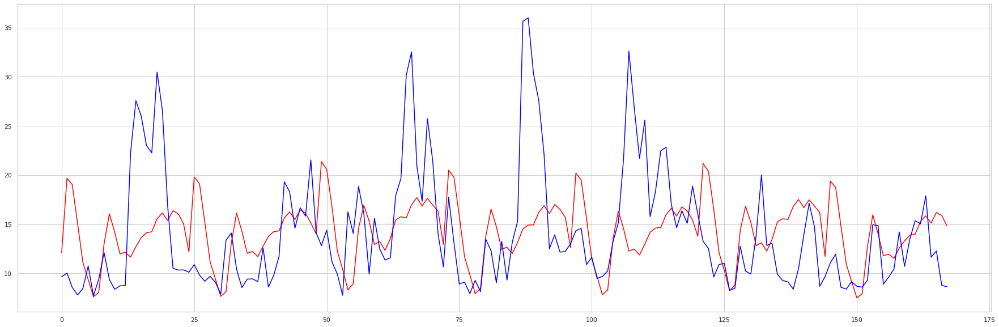

Epoch 1/200
16/16 [==============================] - 3s 85ms/step - loss: 6.3336
Epoch 2/200
16/16 [==============================] - 1s 85ms/step - loss: 2.0027
Epoch 3/200
16/16 [==============================] - 1s 86ms/step - loss: 0.9197
Epoch 4/200
16/16 [==============================] - 1s 86ms/step - loss: 0.7771
Epoch 5/200
16/16 [==============================] - 1s 85ms/step - loss: 0.7748
Epoch 6/200
16/16 [==============================] - 1s 84ms/step - loss: 0.7696
Epoch 7/200
16/16 [==============================] - 1s 87ms/step - loss: 0.7617
Epoch 8/200
16/16 [==============================] - 1s 85ms/step - loss: 0.7517
Epoch 9/200
16/16 [==============================] - 1s 83ms/step - loss: 0.7640
Epoch 10/200
16/16 [==============================] - 1s 85ms/step - loss: 0.7543
Epoch 11/200
16/16 [==============================] - 1s 84ms/step - loss: 0.7549
Epoch 12/200
16/16 [==============================] - 1s 85ms/step - loss: 0.7615
Epoch 13/200
16/16 [=====

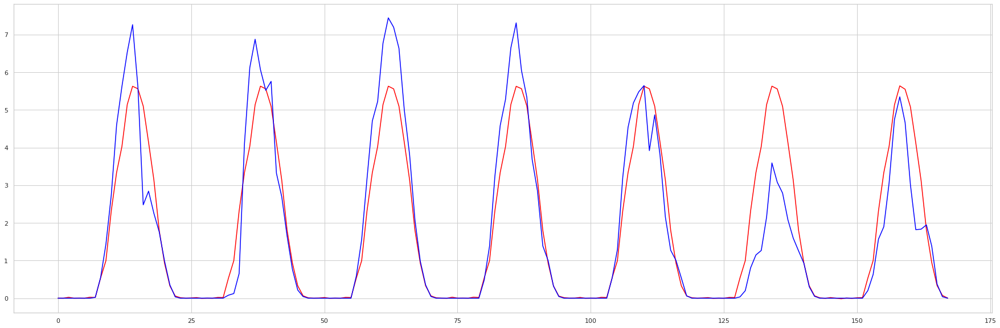

Epoch 1/200
16/16 [==============================] - 4s 88ms/step - loss: 366.4030
Epoch 2/200
16/16 [==============================] - 1s 85ms/step - loss: 313.7100
Epoch 3/200
16/16 [==============================] - 1s 84ms/step - loss: 255.6223
Epoch 4/200
16/16 [==============================] - 1s 86ms/step - loss: 206.6575
Epoch 5/200
16/16 [==============================] - 1s 85ms/step - loss: 166.7093
Epoch 6/200
16/16 [==============================] - 1s 85ms/step - loss: 133.9632
Epoch 7/200
16/16 [==============================] - 1s 88ms/step - loss: 108.2170
Epoch 8/200
16/16 [==============================] - 1s 83ms/step - loss: 89.1313
Epoch 9/200
16/16 [==============================] - 1s 88ms/step - loss: 74.3822
Epoch 10/200
16/16 [==============================] - 1s 88ms/step - loss: 63.9400
Epoch 11/200
16/16 [==============================] - 1s 88ms/step - loss: 57.2452
Epoch 12/200
16/16 [==============================] - 1s 87ms/step - loss: 51.6856
Epoch 

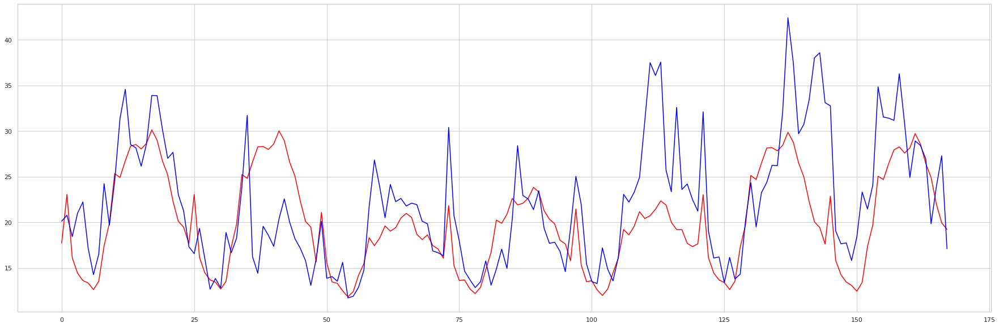

Epoch 1/200
16/16 [==============================] - 3s 88ms/step - loss: 26.0604
Epoch 2/200
16/16 [==============================] - 1s 90ms/step - loss: 13.3948
Epoch 3/200
16/16 [==============================] - 1s 87ms/step - loss: 5.4309
Epoch 4/200
16/16 [==============================] - 1s 88ms/step - loss: 2.8893
Epoch 5/200
16/16 [==============================] - 1s 87ms/step - loss: 2.1112
Epoch 6/200
16/16 [==============================] - 1s 92ms/step - loss: 1.9456
Epoch 7/200
16/16 [==============================] - 1s 87ms/step - loss: 1.8886
Epoch 8/200
16/16 [==============================] - 1s 87ms/step - loss: 1.8875
Epoch 9/200
16/16 [==============================] - 1s 86ms/step - loss: 1.8659
Epoch 10/200
16/16 [==============================] - 1s 89ms/step - loss: 1.8759
Epoch 11/200
16/16 [==============================] - 1s 87ms/step - loss: 1.8772
Epoch 12/200
16/16 [==============================] - 1s 89ms/step - loss: 1.8696
Epoch 13/200
16/16 [===

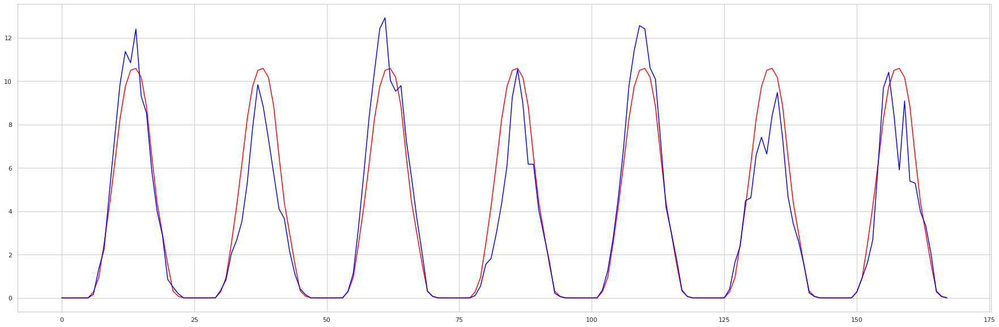

Epoch 1/200
16/16 [==============================] - 3s 89ms/step - loss: 264.4020
Epoch 2/200
16/16 [==============================] - 1s 88ms/step - loss: 219.8460
Epoch 3/200
16/16 [==============================] - 1s 90ms/step - loss: 172.0980
Epoch 4/200
16/16 [==============================] - 1s 87ms/step - loss: 133.8015
Epoch 5/200
16/16 [==============================] - 1s 89ms/step - loss: 104.3451
Epoch 6/200
16/16 [==============================] - 1s 88ms/step - loss: 83.5748
Epoch 7/200
16/16 [==============================] - 2s 95ms/step - loss: 68.3384
Epoch 8/200
16/16 [==============================] - 1s 89ms/step - loss: 57.3312
Epoch 9/200
16/16 [==============================] - 1s 91ms/step - loss: 49.2361
Epoch 10/200
16/16 [==============================] - 1s 91ms/step - loss: 43.4647
Epoch 11/200
16/16 [==============================] - 1s 91ms/step - loss: 39.1549
Epoch 12/200
16/16 [==============================] - 1s 91ms/step - loss: 35.9425
Epoch 13

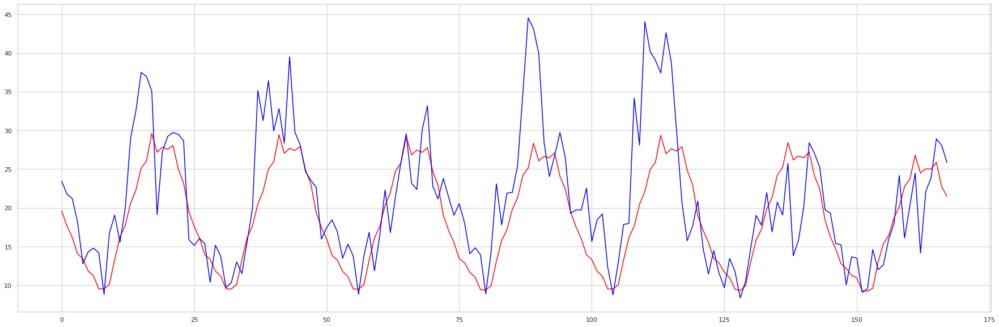

Epoch 1/200
16/16 [==============================] - 4s 87ms/step - loss: 8.6201
Epoch 2/200
16/16 [==============================] - 1s 90ms/step - loss: 2.2011
Epoch 3/200
16/16 [==============================] - 1s 88ms/step - loss: 0.4849
Epoch 4/200
16/16 [==============================] - 1s 90ms/step - loss: 0.4749
Epoch 5/200
16/16 [==============================] - 1s 91ms/step - loss: 0.4312
Epoch 6/200
16/16 [==============================] - 1s 90ms/step - loss: 0.4281
Epoch 7/200
16/16 [==============================] - 1s 90ms/step - loss: 0.4282
Epoch 8/200
16/16 [==============================] - 1s 90ms/step - loss: 0.4270
Epoch 9/200
16/16 [==============================] - 1s 88ms/step - loss: 0.4299
Epoch 10/200
16/16 [==============================] - 1s 92ms/step - loss: 0.4295
Epoch 11/200
16/16 [==============================] - 1s 92ms/step - loss: 0.4345
Epoch 12/200
16/16 [==============================] - 2s 94ms/step - loss: 0.4263
Epoch 13/200
16/16 [=====

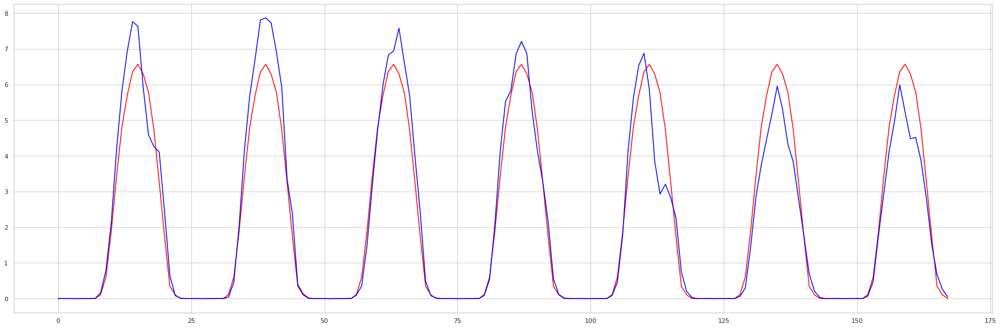

Epoch 1/200
16/16 [==============================] - 3s 90ms/step - loss: 719.8699
Epoch 2/200
16/16 [==============================] - 1s 91ms/step - loss: 658.3579
Epoch 3/200
16/16 [==============================] - 1s 92ms/step - loss: 564.7393
Epoch 4/200
16/16 [==============================] - 1s 91ms/step - loss: 467.1210
Epoch 5/200
16/16 [==============================] - 1s 91ms/step - loss: 384.0073
Epoch 6/200
16/16 [==============================] - 1s 91ms/step - loss: 319.4226
Epoch 7/200
16/16 [==============================] - 1s 91ms/step - loss: 265.1985
Epoch 8/200
16/16 [==============================] - 2s 93ms/step - loss: 220.6067
Epoch 9/200
16/16 [==============================] - 1s 90ms/step - loss: 185.0150
Epoch 10/200
16/16 [==============================] - 2s 93ms/step - loss: 156.1924
Epoch 11/200
16/16 [==============================] - 1s 91ms/step - loss: 132.4112
Epoch 12/200
16/16 [==============================] - 1s 89ms/step - loss: 113.8011
E

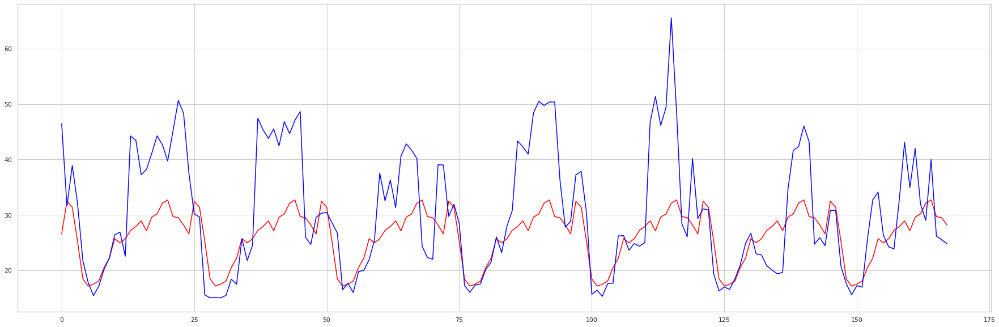

Epoch 1/200
16/16 [==============================] - 3s 91ms/step - loss: 36.6431
Epoch 2/200
16/16 [==============================] - 1s 91ms/step - loss: 21.9726
Epoch 3/200
16/16 [==============================] - 1s 91ms/step - loss: 10.1490
Epoch 4/200
16/16 [==============================] - 2s 93ms/step - loss: 4.9405
Epoch 5/200
16/16 [==============================] - 1s 92ms/step - loss: 2.9134
Epoch 6/200
16/16 [==============================] - 2s 93ms/step - loss: 2.0921
Epoch 7/200
16/16 [==============================] - 1s 91ms/step - loss: 1.8234
Epoch 8/200
16/16 [==============================] - 1s 92ms/step - loss: 1.7319
Epoch 9/200
16/16 [==============================] - 1s 91ms/step - loss: 1.7235
Epoch 10/200
16/16 [==============================] - 2s 94ms/step - loss: 1.7045
Epoch 11/200
16/16 [==============================] - 2s 92ms/step - loss: 1.7030
Epoch 12/200
16/16 [==============================] - 1s 91ms/step - loss: 1.7002
Epoch 13/200
16/16 [==

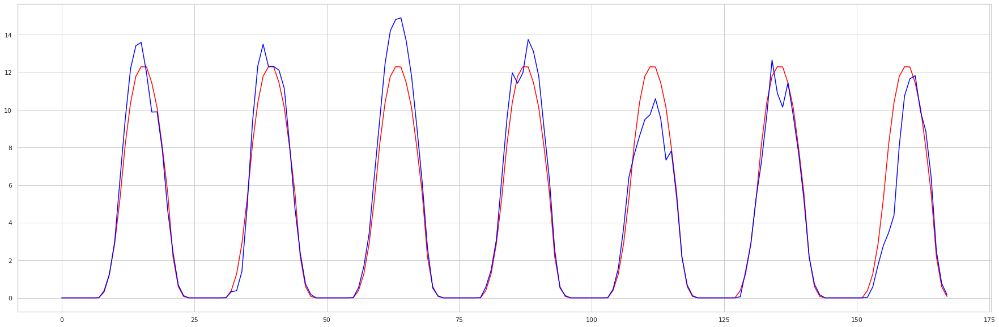

Epoch 1/200
16/16 [==============================] - 4s 91ms/step - loss: 1091.2750
Epoch 2/200
16/16 [==============================] - 2s 95ms/step - loss: 991.3498
Epoch 3/200
16/16 [==============================] - 2s 95ms/step - loss: 878.6038
Epoch 4/200
16/16 [==============================] - 1s 90ms/step - loss: 785.7772
Epoch 5/200
16/16 [==============================] - 1s 94ms/step - loss: 705.3993
Epoch 6/200
16/16 [==============================] - 2s 94ms/step - loss: 630.8890
Epoch 7/200
16/16 [==============================] - 1s 91ms/step - loss: 564.5386
Epoch 8/200
16/16 [==============================] - 1s 92ms/step - loss: 506.8575
Epoch 9/200
16/16 [==============================] - 1s 93ms/step - loss: 455.2571
Epoch 10/200
16/16 [==============================] - 1s 92ms/step - loss: 409.5937
Epoch 11/200
16/16 [==============================] - 1s 91ms/step - loss: 370.4300
Epoch 12/200
16/16 [==============================] - 1s 93ms/step - loss: 338.3802


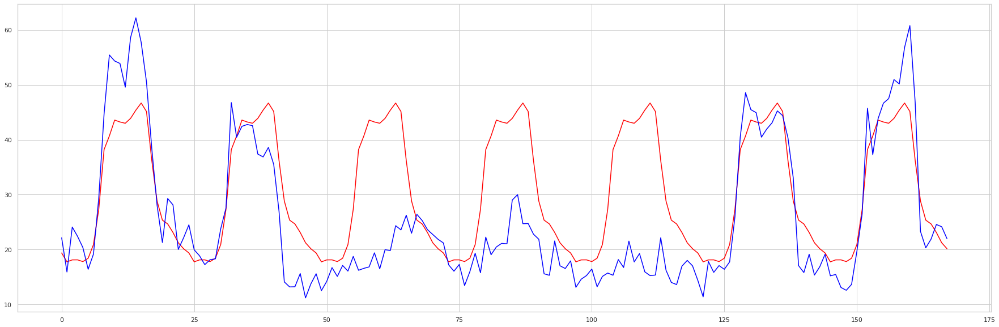

Epoch 1/200
16/16 [==============================] - 3s 92ms/step - loss: 102.3416
Epoch 2/200
16/16 [==============================] - 1s 91ms/step - loss: 73.6509
Epoch 3/200
16/16 [==============================] - 2s 100ms/step - loss: 48.2430
Epoch 4/200
16/16 [==============================] - 2s 93ms/step - loss: 34.2081
Epoch 5/200
16/16 [==============================] - 2s 98ms/step - loss: 25.7631
Epoch 6/200
16/16 [==============================] - 2s 94ms/step - loss: 19.8159
Epoch 7/200
16/16 [==============================] - 2s 94ms/step - loss: 15.7005
Epoch 8/200
16/16 [==============================] - 2s 95ms/step - loss: 12.8147
Epoch 9/200
16/16 [==============================] - 2s 99ms/step - loss: 10.9686
Epoch 10/200
16/16 [==============================] - 1s 94ms/step - loss: 9.6969
Epoch 11/200
16/16 [==============================] - 2s 96ms/step - loss: 8.7423
Epoch 12/200
16/16 [==============================] - 2s 94ms/step - loss: 8.1515
Epoch 13/200
1

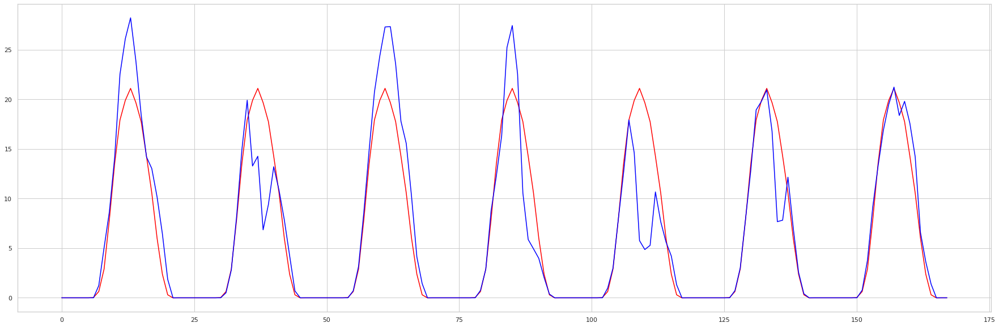

Epoch 1/200
16/16 [==============================] - 3s 92ms/step - loss: 192.5185
Epoch 2/200
16/16 [==============================] - 2s 95ms/step - loss: 159.4544
Epoch 3/200
16/16 [==============================] - 2s 98ms/step - loss: 121.1442
Epoch 4/200
16/16 [==============================] - 2s 95ms/step - loss: 91.8730
Epoch 5/200
16/16 [==============================] - 2s 100ms/step - loss: 69.9016
Epoch 6/200
16/16 [==============================] - 1s 93ms/step - loss: 56.0900
Epoch 7/200
16/16 [==============================] - 2s 94ms/step - loss: 46.9309
Epoch 8/200
16/16 [==============================] - 2s 94ms/step - loss: 40.6062
Epoch 9/200
16/16 [==============================] - 2s 95ms/step - loss: 37.0179
Epoch 10/200
16/16 [==============================] - 2s 95ms/step - loss: 34.5057
Epoch 11/200
16/16 [==============================] - 2s 99ms/step - loss: 33.2792
Epoch 12/200
16/16 [==============================] - 2s 96ms/step - loss: 32.3972
Epoch 13/

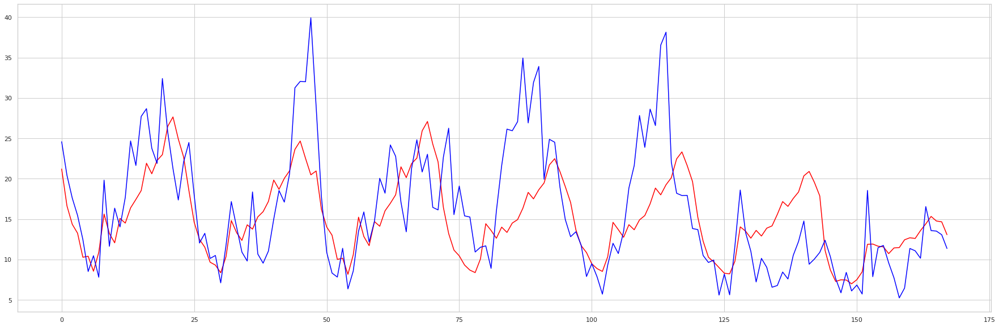

Epoch 1/200
16/16 [==============================] - 4s 93ms/step - loss: 3.7784
Epoch 2/200
16/16 [==============================] - 2s 99ms/step - loss: 0.9565
Epoch 3/200
16/16 [==============================] - 2s 99ms/step - loss: 0.9208
Epoch 4/200
16/16 [==============================] - 2s 94ms/step - loss: 0.8697
Epoch 5/200
16/16 [==============================] - 2s 94ms/step - loss: 0.8458
Epoch 6/200
16/16 [==============================] - 2s 96ms/step - loss: 0.7968
Epoch 7/200
16/16 [==============================] - 2s 99ms/step - loss: 0.7666
Epoch 8/200
16/16 [==============================] - 2s 98ms/step - loss: 0.7292
Epoch 9/200
16/16 [==============================] - 2s 95ms/step - loss: 0.7159
Epoch 10/200
16/16 [==============================] - 2s 98ms/step - loss: 0.6964
Epoch 11/200
16/16 [==============================] - 2s 99ms/step - loss: 0.6907
Epoch 12/200
16/16 [==============================] - 2s 98ms/step - loss: 0.6948
Epoch 13/200
16/16 [=====

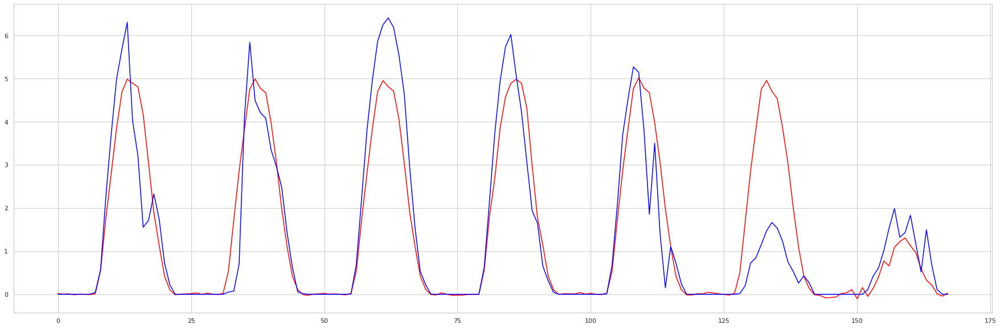

Epoch 1/200
16/16 [==============================] - 4s 97ms/step - loss: 285.6292
Epoch 2/200
16/16 [==============================] - 2s 97ms/step - loss: 246.1406
Epoch 3/200
16/16 [==============================] - 2s 100ms/step - loss: 191.2073
Epoch 4/200
16/16 [==============================] - 2s 97ms/step - loss: 149.7794
Epoch 5/200
16/16 [==============================] - 2s 100ms/step - loss: 118.2988
Epoch 6/200
16/16 [==============================] - 2s 99ms/step - loss: 94.6549
Epoch 7/200
16/16 [==============================] - 2s 98ms/step - loss: 77.2823
Epoch 8/200
16/16 [==============================] - 2s 96ms/step - loss: 64.2289
Epoch 9/200
16/16 [==============================] - 2s 97ms/step - loss: 54.7244
Epoch 10/200
16/16 [==============================] - 2s 96ms/step - loss: 47.8917
Epoch 11/200
16/16 [==============================] - 2s 98ms/step - loss: 42.2485
Epoch 12/200
16/16 [==============================] - 2s 98ms/step - loss: 38.6524
Epoch 

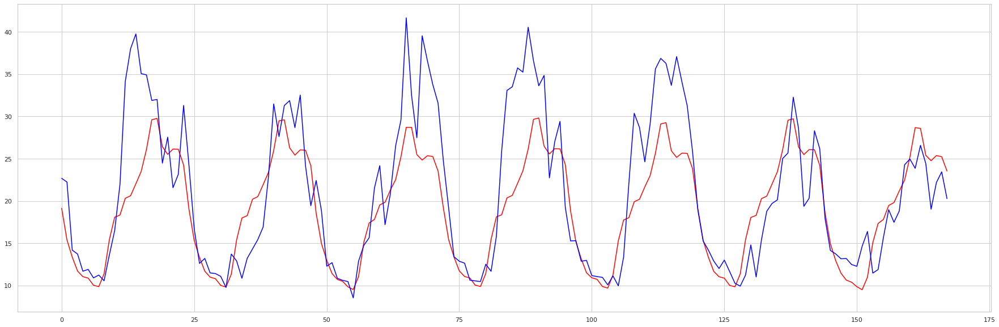

Epoch 1/200
16/16 [==============================] - 3s 95ms/step - loss: 7.1274
Epoch 2/200
16/16 [==============================] - 2s 98ms/step - loss: 2.0595
Epoch 3/200
16/16 [==============================] - 2s 95ms/step - loss: 1.1157
Epoch 4/200
16/16 [==============================] - 2s 100ms/step - loss: 1.0614
Epoch 5/200
16/16 [==============================] - 2s 97ms/step - loss: 1.0391
Epoch 6/200
16/16 [==============================] - 2s 96ms/step - loss: 1.0440
Epoch 7/200
16/16 [==============================] - 2s 97ms/step - loss: 1.0204
Epoch 8/200
16/16 [==============================] - 2s 98ms/step - loss: 1.0112
Epoch 9/200
16/16 [==============================] - 2s 95ms/step - loss: 1.0102
Epoch 10/200
16/16 [==============================] - 2s 97ms/step - loss: 1.0164
Epoch 11/200
16/16 [==============================] - 2s 94ms/step - loss: 1.0547
Epoch 12/200
16/16 [==============================] - 2s 96ms/step - loss: 1.0552
Epoch 13/200
16/16 [====

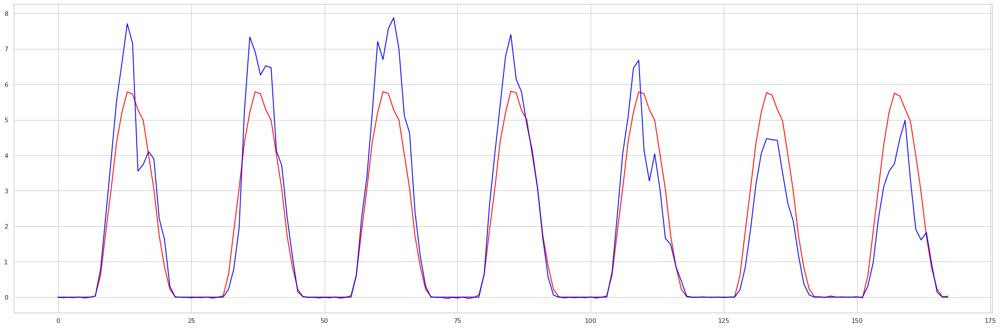

Epoch 1/200
16/16 [==============================] - 4s 97ms/step - loss: 183.5749
Epoch 2/200
16/16 [==============================] - 2s 97ms/step - loss: 149.2336
Epoch 3/200
16/16 [==============================] - 2s 98ms/step - loss: 113.6528
Epoch 4/200
16/16 [==============================] - 2s 101ms/step - loss: 86.3878
Epoch 5/200
16/16 [==============================] - 2s 98ms/step - loss: 67.3329
Epoch 6/200
16/16 [==============================] - 2s 101ms/step - loss: 54.2416
Epoch 7/200
16/16 [==============================] - 2s 98ms/step - loss: 45.5641
Epoch 8/200
16/16 [==============================] - 2s 97ms/step - loss: 39.4287
Epoch 9/200
16/16 [==============================] - 2s 97ms/step - loss: 35.1459
Epoch 10/200
16/16 [==============================] - 2s 106ms/step - loss: 32.1213
Epoch 11/200
16/16 [==============================] - 2s 98ms/step - loss: 29.9703
Epoch 12/200
16/16 [==============================] - 2s 100ms/step - loss: 28.3947
Epoch 

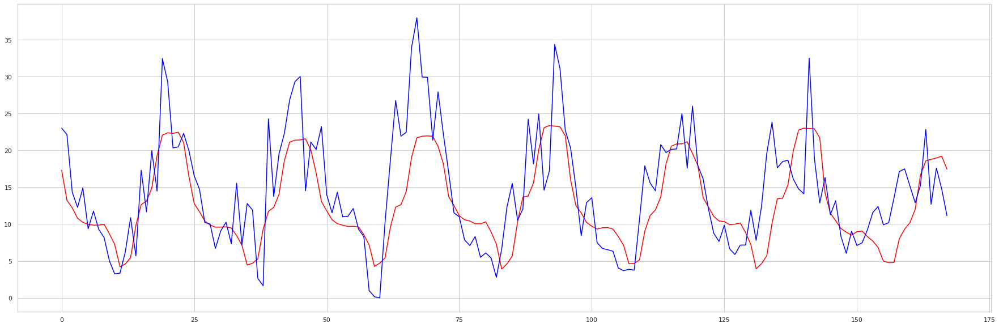

Epoch 1/200
16/16 [==============================] - 3s 96ms/step - loss: 3.2758
Epoch 2/200
16/16 [==============================] - 2s 99ms/step - loss: 0.6036
Epoch 3/200
16/16 [==============================] - 2s 99ms/step - loss: 0.3651
Epoch 4/200
16/16 [==============================] - 2s 100ms/step - loss: 0.3434
Epoch 5/200
16/16 [==============================] - 2s 104ms/step - loss: 0.3449
Epoch 6/200
16/16 [==============================] - 2s 100ms/step - loss: 0.3389
Epoch 7/200
16/16 [==============================] - 2s 100ms/step - loss: 0.3366
Epoch 8/200
16/16 [==============================] - 2s 100ms/step - loss: 0.3402
Epoch 9/200
16/16 [==============================] - 2s 97ms/step - loss: 0.3403
Epoch 10/200
16/16 [==============================] - 2s 99ms/step - loss: 0.3462
Epoch 11/200
16/16 [==============================] - 2s 100ms/step - loss: 0.3330
Epoch 12/200
16/16 [==============================] - 2s 98ms/step - loss: 0.3365
Epoch 13/200
16/16 

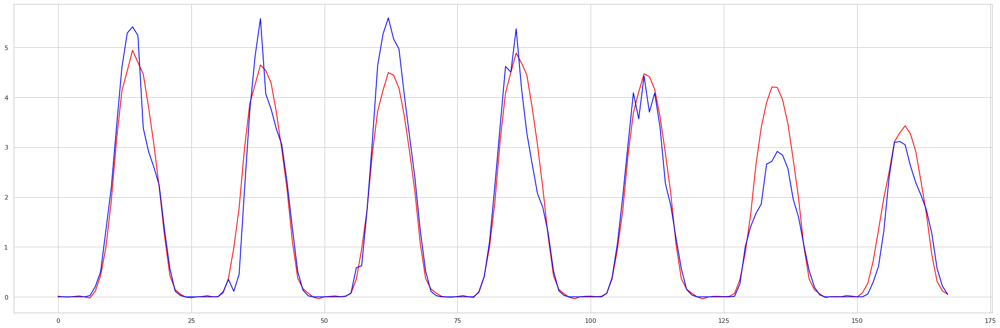

Epoch 1/200
16/16 [==============================] - 3s 98ms/step - loss: 746.6121
Epoch 2/200
16/16 [==============================] - 2s 100ms/step - loss: 686.4894
Epoch 3/200
16/16 [==============================] - 2s 100ms/step - loss: 598.7266
Epoch 4/200
16/16 [==============================] - 2s 100ms/step - loss: 508.4453
Epoch 5/200
16/16 [==============================] - 2s 97ms/step - loss: 436.6118
Epoch 6/200
16/16 [==============================] - 2s 97ms/step - loss: 376.1217
Epoch 7/200
16/16 [==============================] - 2s 99ms/step - loss: 325.1824
Epoch 8/200
16/16 [==============================] - 2s 99ms/step - loss: 279.0673
Epoch 9/200
16/16 [==============================] - 2s 98ms/step - loss: 240.4799
Epoch 10/200
16/16 [==============================] - 2s 100ms/step - loss: 210.4324
Epoch 11/200
16/16 [==============================] - 2s 102ms/step - loss: 183.5449
Epoch 12/200
16/16 [==============================] - 2s 98ms/step - loss: 158.5

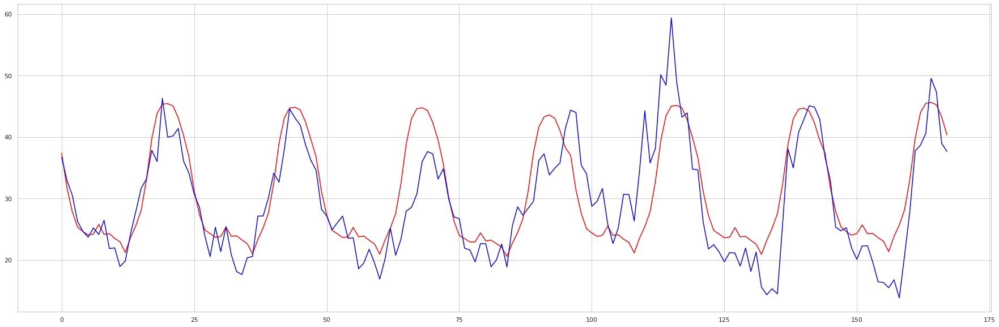

Epoch 1/200
16/16 [==============================] - 4s 97ms/step - loss: 16.9056
Epoch 2/200
16/16 [==============================] - 2s 99ms/step - loss: 8.0072
Epoch 3/200
16/16 [==============================] - 2s 98ms/step - loss: 2.5557
Epoch 4/200
16/16 [==============================] - 2s 97ms/step - loss: 1.2702
Epoch 5/200
16/16 [==============================] - 2s 101ms/step - loss: 1.1396
Epoch 6/200
16/16 [==============================] - 2s 106ms/step - loss: 1.1367
Epoch 7/200
16/16 [==============================] - 2s 98ms/step - loss: 1.1241
Epoch 8/200
16/16 [==============================] - 2s 99ms/step - loss: 1.1211
Epoch 9/200
16/16 [==============================] - 2s 99ms/step - loss: 1.1229
Epoch 10/200
16/16 [==============================] - 2s 101ms/step - loss: 1.1233
Epoch 11/200
16/16 [==============================] - 2s 98ms/step - loss: 1.1235
Epoch 12/200
16/16 [==============================] - 2s 100ms/step - loss: 1.1318
Epoch 13/200
16/16 [

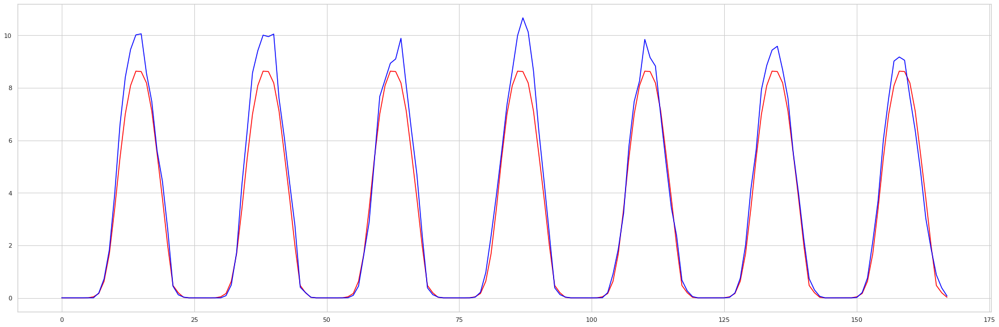

In [ ]:
for id in range(20):
    building_data = pd.read_csv("./Dataset/Simulation/generation_with_consumption.csv", index_col=0)
    building_data["datetime"] = pd.to_datetime(building_data["datetime"], format="%Y-%m-%d %H:%M:%S")
    building_data["buildingID"] = building_data["buildingID"].astype(str)

    for typing in ["consumption", "generation"]:
        x_train, y_train, x_test, y_test = LSTM_data(building_data, str(id), typing)
        model = building_many_to_one_model(x_train)
        callback = EarlyStopping(monitor="loss", patience=10, verbose=1, mode="auto")
        model.fit(x_train, y_train, epochs = 200, batch_size = 4, callbacks=[callback])
        model.save(f"./Result/Model/{typing}/{str(id)}.h5")

        predict = model.predict(x_test)
        predict = predict.flatten()
        plt.figure(figsize=(30.8, 10))
        plt.plot(predict, color="red")
        plt.plot(y_test.flatten(), color="blue")
        plt.show()

### 讀取準確度

GroundTruth

In [ ]:
ref = defaultdict()
for location_id in location.index:
    buildingID = location.loc[location_id, "buildingID"]
    ref[buildingID] = location.loc[location_id, ["contractCapacity", "stationNewNum"]].values

building_data = pd.read_csv("./Dataset/Simulation/generation_with_consumption.csv", index_col=0)
building_data["datetime"] = pd.to_datetime(building_data["datetime"], format="%Y-%m-%d %H:%M:%S")
building_data["buildingID"] = building_data["buildingID"].astype(str)

spendable_parking_slots = pd.DataFrame([], columns=[str(i) for i in range(20)])
for idx, row in building_data.iterrows():
    value = math.floor((ref[row["buildingID"]][0] - row["consumption"] + row["generation"]) / charging_speed)
    spendable_parking_slots.loc[row["datetime"], row["buildingID"]] = max(min(value, ref[row["buildingID"]][1]), 0)
    
spendable_parking_slots.to_csv("./Dataset/Simulation/ground_truth_parking_slots.csv")

In [60]:
spendable_parking_slots = pd.read_csv("./Dataset/Simulation/ground_truth_parking_slots.csv", index_col=0)
spendable_parking_slots.index = pd.to_datetime(spendable_parking_slots.index, format="%Y-%m-%d %H:%M:%S")

FileNotFoundError: ignored

In [ ]:
spendable_parking_slots

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
2015-01-01 00:00:00,1,3,1,4,2,2,2,2,0,0,2,1,0,3,1,1,3,2,1,1
2015-01-01 01:00:00,2,3,1,4,2,2,2,2,0,0,2,0,1,2,0,1,3,3,1,1
2015-01-01 02:00:00,1,3,2,4,2,2,2,2,0,0,2,1,0,2,0,2,3,3,1,1
2015-01-01 03:00:00,2,3,2,5,2,2,2,2,0,0,2,2,1,2,0,2,3,3,2,1
2015-01-01 04:00:00,2,3,2,5,2,2,2,1,0,0,2,2,0,3,1,2,3,4,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-12-31 19:00:00,1,3,0,2,2,2,2,2,0,0,0,1,0,1,0,2,1,3,1,0
2015-12-31 20:00:00,0,3,2,4,2,2,1,2,0,0,0,2,1,2,0,2,1,3,0,0
2015-12-31 21:00:00,1,3,2,4,1,2,2,2,0,0,1,2,0,2,0,2,2,3,1,0
2015-12-31 22:00:00,1,3,1,4,1,2,2,3,0,0,1,2,1,2,0,2,1,2,1,0


#### 判斷哪個模型較好

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import shutil

ref = defaultdict()
for location_id in location.index:
    buildingID = location.loc[location_id, "buildingID"]
    ref[buildingID] = location.loc[location_id, ["contractCapacity", "stationNewNum"]].values

true_data = pd.read_csv("./Dataset/Simulation/generation_with_consumption.csv", index_col=0)
true_data["datetime"] = pd.to_datetime(true_data["datetime"], format="%Y-%m-%d %H:%M:%S")
true_data["buildingID"] = true_data["buildingID"].astype(str)

# 預測電量
predict_list = list()
for buildingID in range(20):
    _, _, x_consumption, y_consumption = LSTM_data(building_data, str(buildingID), "consumption")
    _, _, x_generation, y_generation = LSTM_data(building_data, str(buildingID), "generation")
    one_model_consumption = load_model(f"./Result/LSTM/one_layer/Model/consumption/{buildingID}.h5")
    one_model_generation = load_model(f"./Result/LSTM/one_layer/Model/generation/{buildingID}.h5")
    four_model_consumption = load_model(f"./Result/LSTM/four_layer/Model/consumption/{buildingID}.h5")
    four_model_generation = load_model(f"./Result/LSTM/four_layer/Model/generation/{buildingID}.h5")

    one_predict_consumption = one_model_consumption.predict(x_consumption)
    one_predict_consumption = one_predict_consumption.flatten()
    one_predict_generation = one_model_generation.predict(x_generation)
    one_predict_generation = one_predict_generation.flatten()
    four_predict_consumption = four_model_consumption.predict(x_consumption)
    four_predict_consumption = four_predict_consumption.flatten()
    four_predict_generation = four_model_generation.predict(x_generation)
    four_predict_generation = four_predict_generation.flatten()
    one_predict_generation[one_predict_generation < 0] = 0
    four_predict_generation[four_predict_generation < 0] = 0


    testing_start_time = parser.parse("2015-07-01")
    testing_end_time = parser.parse("2015-07-08")
    building_true = true_data.loc[(true_data["buildingID"] == str(buildingID)) &
                                  (true_data["datetime"] >= testing_start_time) &
                                  (true_data["datetime"] < testing_end_time)]
    consumption_true = building_true.loc[:, "consumption"].values.tolist()
    generation_true = building_true.loc[:, "generation"].values.tolist()

    one_consumption_result = r2_score(consumption_true, one_predict_consumption)
    four_consumption_result = r2_score(consumption_true, four_predict_consumption)
    one_generation_result = r2_score(generation_true, one_predict_generation)
    four_generation_result = r2_score(generation_true, four_predict_generation)

    if one_consumption_result > four_consumption_result:
        consumption_win = "one_layer"
        consumption_win_result = one_predict_consumption
    else:
        consumption_win = "four_layer"
        consumption_win_result = four_predict_consumption
    
    if one_generation_result > four_generation_result:
        generation_win = "one_layer"
        generation_win_result = one_predict_generation
    else:
        generation_win = "four_layer"
        generation_win_result = four_predict_generation

    print(consumption_win, " ", generation_win)
    shutil.copyfile(f"./Result/LSTM/{consumption_win}/Model/consumption/{buildingID}.h5", f"./Result/LSTM/combine/Model/consumption/{buildingID}.h5")
    shutil.copyfile(f"./Result/LSTM/{generation_win}/Model/generation/{buildingID}.h5", f"./Result/LSTM/combine/Model/generation/{buildingID}.h5")

    for i in range(len(building_true)):
        predict_list.append([testing_start_time, str(buildingID), consumption_win_result[i], generation_win_result[i]])
        testing_start_time += timedelta(hours=1)

pd.DataFrame(predict_list, columns=["datetime", "buildingID", "consumption", "generation"]).to_csv("./Result/LSTM/combine/predict_building_data.csv")

four_layer   one_layer
one_layer   one_layer
one_layer   four_layer
one_layer   four_layer
one_layer   four_layer
one_layer   four_layer
four_layer   one_layer
four_layer   four_layer
one_layer   four_layer
one_layer   one_layer
one_layer   four_layer
four_layer   four_layer
one_layer   one_layer
four_layer   four_layer
one_layer   one_layer
four_layer   one_layer
one_layer   four_layer
four_layer   four_layer
four_layer   one_layer
one_layer   four_layer


#### 讀取模型

In [61]:
# ref = defaultdict()
# for location_id in location.index:
#     buildingID = location.loc[location_id, "buildingID"]
#     ref[buildingID] = location.loc[location_id, ["contractCapacity", "stationNewNum"]].values

# 預測充電位數量
# predict_slots = defaultdict(list)
# 預測電量
predict_list = list()
for buildingID in range(20):
    _, _, x_consumption, y_consumption = LSTM_data(building_data, str(buildingID), "consumption")
    _, _, x_generation, y_generation = LSTM_data(building_data, str(buildingID), "generation")
    model_consumption = load_model(f"./Result/LSTM/0702_four_layer/Model/consumption/{buildingID}.h5")
    model_generation = load_model(f"./Result/LSTM/0702_four_layer/Model/generation/{buildingID}.h5")

    predict_consumption = model_consumption.predict(x_consumption)
    predict_consumption =  predict_consumption.flatten()
    predict_generation = model_generation.predict(x_generation)
    predict_generation = predict_generation.flatten()

    predict_generation[predict_generation < 0] = 0
    # value = (ref[str(buildingID)][0] - predict_consumption + predict_generation) / charging_speed

    testing_start_time = parser.parse("2018-07-01")
    # slots_df = pd.DataFrame([], columns=["datetime", "true", "predict"])

    for i in range(7*24):
        predict_list.append([testing_start_time, str(buildingID), predict_consumption[i], predict_generation[i]])
        testing_start_time += timedelta(hours=1)
    
    ### slots figure ###
    # ax = plt.gca()

    # df.plot(kind='line', x='datetime',y='true', color="red", ax=ax, figsize=(20.5,8), fontsize=18)
    # df.plot(kind='line', x='datetime',y='predict', color='blue', ax=ax, figsize=(20.5,8), fontsize=18)

    # # plt.title(f"BuildingID: {buildingID}", fontsize=20)
    # plt.xlabel("Time", fontsize=20)
    # plt.ylabel("Spendable Parking Slots", fontsize=20)
    # plt.yticks(np.arange(0, 6, step=1))
    # plt.legend(fontsize=18, loc="upper right")
    # plt.savefig(f"./Result/LSTM/0702_four_layer/{buildingID}.png", bbox_inches='tight')
    # plt.show()


    ### electric figure ###

pd.DataFrame(predict_list, columns=["datetime", "buildingID", "consumption", "generation"]).to_csv("./Result/LSTM/0702_four_layer/predict_building_data.csv")
print(predict_list)

NameError: ignored

重新訓練 building 2 後更改 predict_building_data 的資料

In [ ]:
# ref = defaultdict()
# for location_id in location.index:
#     buildingID = location.loc[location_id, "buildingID"]
#     ref[buildingID] = location.loc[location_id, ["contractCapacity", "stationNewNum"]].values

# 預測充電位數量
# predict_slots = defaultdict(list)
# 預測電量
predict_list = defaultdict(dict)
for buildingID in [2]:
    _, _, x_consumption, y_consumption = LSTM_data(building_data, str(buildingID), "consumption")
    _, _, x_generation, y_generation = LSTM_data(building_data, str(buildingID), "generation")
    model_consumption = load_model(f"./Result/LSTM/0702_four_layer/Model/consumption/{buildingID}.h5")
    model_generation = load_model(f"./Result/LSTM/0702_four_layer/Model/generation/{buildingID}.h5")

    predict_consumption = model_consumption.predict(x_consumption)
    predict_consumption =  predict_consumption.flatten()
    predict_generation = model_generation.predict(x_generation)
    predict_generation = predict_generation.flatten()

    predict_generation[predict_generation < 0] = 0
    # value = (ref[str(buildingID)][0] - predict_consumption + predict_generation) / charging_speed

    testing_start_time = parser.parse("2018-07-01")
    # slots_df = pd.DataFrame([], columns=["datetime", "true", "predict"])

    for i in range(7*24):
        predict_list[testing_start_time]["consumption"] = predict_consumption[i]
        predict_list[testing_start_time]["generation"] = predict_generation[i]
        testing_start_time += timedelta(hours=1)
    
    ### slots figure ###
    # ax = plt.gca()

    # df.plot(kind='line', x='datetime',y='true', color="red", ax=ax, figsize=(20.5,8), fontsize=18)
    # df.plot(kind='line', x='datetime',y='predict', color='blue', ax=ax, figsize=(20.5,8), fontsize=18)

    # # plt.title(f"BuildingID: {buildingID}", fontsize=20)
    # plt.xlabel("Time", fontsize=20)
    # plt.ylabel("Spendable Parking Slots", fontsize=20)
    # plt.yticks(np.arange(0, 6, step=1))
    # plt.legend(fontsize=18, loc="upper right")
    # # plt.savefig(f"./Result/LSTM/0702_four_layer/{buildingID}.png", bbox_inches='tight')
    # plt.show()


    ### electric figure ###

# pd.DataFrame(predict_list, columns=["datetime", "buildingID", "consumption", "generation"]).to_csv("./Result/LSTM/0702_four_layer/predict_building_data.csv")
print(predict_list)

defaultdict(<class 'dict'>, {datetime.datetime(2018, 7, 1, 0, 0): {'consumption': 260.0573, 'generation': 0.06895539}, datetime.datetime(2018, 7, 1, 1, 0): {'consumption': 236.31252, 'generation': 0.023704782}, datetime.datetime(2018, 7, 1, 2, 0): {'consumption': 215.1617, 'generation': 0.016597982}, datetime.datetime(2018, 7, 1, 3, 0): {'consumption': 215.16164, 'generation': 0.0}, datetime.datetime(2018, 7, 1, 4, 0): {'consumption': 222.20558, 'generation': 0.0}, datetime.datetime(2018, 7, 1, 5, 0): {'consumption': 223.35596, 'generation': 0.0}, datetime.datetime(2018, 7, 1, 6, 0): {'consumption': 241.77681, 'generation': 0.046948083}, datetime.datetime(2018, 7, 1, 7, 0): {'consumption': 276.11063, 'generation': 0.10874957}, datetime.datetime(2018, 7, 1, 8, 0): {'consumption': 278.62912, 'generation': 0.0}, datetime.datetime(2018, 7, 1, 9, 0): {'consumption': 289.51904, 'generation': 0.59937626}, datetime.datetime(2018, 7, 1, 10, 0): {'consumption': 319.33743, 'generation': 3.1487465

In [ ]:
predict_df = pd.read_csv("./Result/LSTM/predict_building_data.csv", index_col=0) 
predict_df["datetime"] = pd.to_datetime(predict_df["datetime"], format="%Y-%m-%d %H:%M:%S")
df = predict_df[predict_df["buildingID"] == 2].copy()

for idx, item in df.iterrows():
    predict_df.loc[idx, "consumption"] = predict_list[item["datetime"]]["consumption"]
    predict_df.loc[idx, "generation"] = predict_list[item["datetime"]]["generation"]

predict_df.to_csv("./Result/LSTM/predict_building_data.csv")

#### 用充電位計算準確度

In [ ]:
ref = defaultdict()
for location_id in location.index:
    buildingID = location.loc[location_id, "buildingID"]
    ref[buildingID] = location.loc[location_id, ["contractCapacity", "stationNewNum"]].values

elec_predict_df = pd.read_csv("./Result/LSTM/combine/predict_building_data.csv", index_col=0)
elec_predict_df["datetime"] = pd.to_datetime(elec_predict_df["datetime"], format="%Y-%m-%d %H:%M:%S")
elec_predict_df["buildingID"] = elec_predict_df["buildingID"].astype(str)

predict_slots = list()
for idx, raw in elec_predict_df.iterrows():
    predict_slots.append(max(min(math.floor((ref[raw["buildingID"]][0] - raw["consumption"] + raw["generation"]) / charging_speed), ref[raw["buildingID"]][1]), 0))

elec_predict_df["predictSlots"] = predict_slots
elec_predict_df["predictSlots"] = elec_predict_df["predictSlots"].astype(int)
elec_predict_df

,datetime,buildingID,consumption,generation,predictSlots
0,2015-07-01 00:00:00,0,13.581714,0.000000,2
1,2015-07-01 01:00:00,0,10.980442,0.010942,2
2,2015-07-01 02:00:00,0,9.076773,0.007472,2
3,2015-07-01 03:00:00,0,8.604302,0.000000,2
4,2015-07-01 04:00:00,0,6.895886,0.025496,2
...,...,...,...,...,...
3355,2015-07-07 19:00:00,19,45.499245,3.636486,0
3356,2015-07-07 20:00:00,19,45.637596,1.807669,0
3357,2015-07-07 21:00:00,19,45.255787,0.406558,0
3358,2015-07-07 22:00:00,19,43.257286,0.101569,0


0 , rmse: 0.4107142857142857
0 , mae: 0.3869047619047619
0 , r2_score: -1.1003805037144407
1 , rmse: 0.7857142857142857
1 , mae: 0.6190476190476191
1 , r2_score: -0.20652883569096825
2 , rmse: 0.8095238095238095
2 , mae: 0.5714285714285714
2 , r2_score: -1.6180818150567204
3 , rmse: 1.0714285714285714
3 , mae: 0.6547619047619048
3 , r2_score: 0.15094339622641506
4 , rmse: 0.6607142857142857
4 , mae: 0.5654761904761905
4 , r2_score: -1.5647091184156232
5 , rmse: 0.4166666666666667
5 , mae: 0.35714285714285715
5 , r2_score: 0.3851623359648665
6 , rmse: 0.5178571428571429
6 , mae: 0.4583333333333333
6 , r2_score: 0.27062228654124454
7 , rmse: 0.375
7 , mae: 0.3392857142857143
7 , r2_score: -0.7737556561085974
8 , rmse: 2.0714285714285716
8 , mae: 0.8809523809523809
8 , r2_score: -0.3960218725375486
9 , rmse: 0.7559523809523809
9 , mae: 0.625
9 , r2_score: -1.1682926829268294
10 , rmse: 0.30357142857142855
10 , mae: 0.24404761904761904
10 , r2_score: -1.2505910165484635
11 , rmse: 0.684523

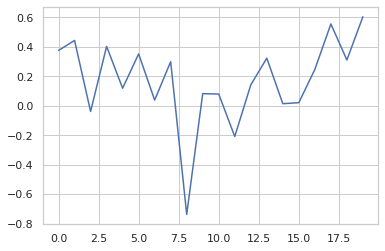

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

rmse, mae, r2 = list(), list(), list()
for buildingID in range(20):
    testing_start_time = parser.parse("2015-07-01")
    testing_end_time = parser.parse("2015-07-07 23:00:00")
    # count = 0
    # difference = list()

    # while testing_start_time < testing_end_time:
    #     difference.append(abs(spendable_parking_slots.loc[testing_start_time, str(buildingID)] - predict_slots[str(buildingID)][count]))

    #     testing_start_time += timedelta(hours=1)
    #     count += 1
    # print(sum(difference) / (7*24))
    # total_sum += (sum(difference) / (7*24))
    y_true = spendable_parking_slots.loc[testing_start_time:testing_end_time, str(buildingID)].tolist()
    y_pred = elec_predict_df.loc[(elec_predict_df["datetime"] >= testing_start_time) &
                                 (elec_predict_df["datetime"] <= testing_end_time) &
                                 (elec_predict_df["buildingID"] == str(buildingID)), "predictSlots"].values.tolist()
    # y_pred = predict_slots[str(buildingID)]
    rmse.append(mean_squared_error(y_true, y_pred, squared=True))
    mae.append(mean_absolute_error(y_true, y_pred))
    r2.append(r2_score(y_true, y_pred))
    print(buildingID, ", rmse:", mean_squared_error(y_true, y_pred, squared=True))
    print(buildingID, ", mae:", mean_absolute_error(y_true, y_pred))
    print(buildingID, ", r2_score:", r2_score(y_pred, y_true))

print(sum(rmse) / 20)
print(sum(mae) / 20)
print(sum(r2) / 20)

plt.plot(r2)
plt.show()